# Prelims:
## Required Modules

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import tensorflow as tf

%matplotlib inline

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


## Importing / Formatting Data

In [2]:
df = pd.read_csv("../data/train_2.csv", index_col='Page')

df.head()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2017-09-01,2017-09-02,2017-09-03,2017-09-04,2017-09-05,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10
Page,,,,,,,,,,,,,,,,,,,,,
2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,24.0,...,19.0,33.0,33.0,18.0,16.0,27.0,29.0,23.0,54.0,38.0
2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,4.0,...,32.0,30.0,11.0,19.0,54.0,25.0,26.0,23.0,13.0,81.0
3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,4.0,...,6.0,6.0,7.0,2.0,4.0,7.0,3.0,4.0,7.0,6.0
4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,16.0,...,7.0,19.0,19.0,9.0,6.0,16.0,19.0,30.0,38.0,4.0
52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,16.0,16.0,19.0,9.0,20.0,23.0,28.0,14.0,8.0,7.0


In [3]:
df = df.pct_change(axis=1)
df.head()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2017-09-01,2017-09-02,2017-09-03,2017-09-04,2017-09-05,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10
Page,,,,,,,,,,,,,,,,,,,,,
2NE1_zh.wikipedia.org_all-access_spider,NaN,-0.388889,-0.545455,1.6,0.076923,-0.357143,0.000000,1.444444,0.181818,-0.076923,...,-0.095238,0.736842,0.000000,-0.454545,-0.111111,0.687500,0.074074,-0.206897,1.347826,-0.296296
2PM_zh.wikipedia.org_all-access_spider,NaN,0.272727,0.071429,0.2,-0.388889,0.181818,0.692308,-0.500000,-0.090909,-0.600000,...,0.280000,-0.062500,-0.633333,0.727273,1.842105,-0.537037,0.040000,-0.115385,-0.434783,5.230769
3C_zh.wikipedia.org_all-access_spider,NaN,-1.000000,inf,0.0,-1.000000,inf,-1.000000,inf,0.333333,0.000000,...,-0.333333,0.000000,0.166667,-0.714286,1.000000,0.750000,-0.571429,0.333333,0.750000,-0.142857
4minute_zh.wikipedia.org_all-access_spider,NaN,-0.628571,-0.230769,8.4,-0.957447,5.500000,-0.461538,-0.357143,0.222222,0.454545,...,-0.533333,1.714286,0.000000,-0.526316,-0.333333,1.666667,0.187500,0.578947,0.266667,-0.894737
52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.333333,0.000000,0.187500,-0.526316,1.222222,0.150000,0.217391,-0.500000,-0.428571,-0.125000


In [4]:
df = df.fillna(0)
df[df == np.inf] = 1.0
df.head()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2017-09-01,2017-09-02,2017-09-03,2017-09-04,2017-09-05,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10
Page,,,,,,,,,,,,,,,,,,,,,
2NE1_zh.wikipedia.org_all-access_spider,0.0,-0.388889,-0.545455,1.6,0.076923,-0.357143,0.000000,1.444444,0.181818,-0.076923,...,-0.095238,0.736842,0.000000,-0.454545,-0.111111,0.687500,0.074074,-0.206897,1.347826,-0.296296
2PM_zh.wikipedia.org_all-access_spider,0.0,0.272727,0.071429,0.2,-0.388889,0.181818,0.692308,-0.500000,-0.090909,-0.600000,...,0.280000,-0.062500,-0.633333,0.727273,1.842105,-0.537037,0.040000,-0.115385,-0.434783,5.230769
3C_zh.wikipedia.org_all-access_spider,0.0,-1.000000,1.000000,0.0,-1.000000,1.000000,-1.000000,1.000000,0.333333,0.000000,...,-0.333333,0.000000,0.166667,-0.714286,1.000000,0.750000,-0.571429,0.333333,0.750000,-0.142857
4minute_zh.wikipedia.org_all-access_spider,0.0,-0.628571,-0.230769,8.4,-0.957447,5.500000,-0.461538,-0.357143,0.222222,0.454545,...,-0.533333,1.714286,0.000000,-0.526316,-0.333333,1.666667,0.187500,0.578947,0.266667,-0.894737
52_Hz_I_Love_You_zh.wikipedia.org_all-access_spider,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-0.333333,0.000000,0.187500,-0.526316,1.222222,0.150000,0.217391,-0.500000,-0.428571,-0.125000


In [24]:
val = df.iloc[:,-20:]
trn = df.iloc[:,:-20]

# Simple implementation
## Translating [this](https://medium.com/@erikhallstrm/hello-world-rnn-83cd7105b767) article

### Just running his:

New data, epoch 0
Step 0 Loss 0.718272


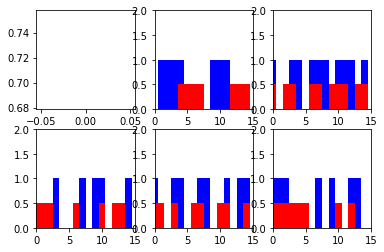

Step 100 Loss 0.699555


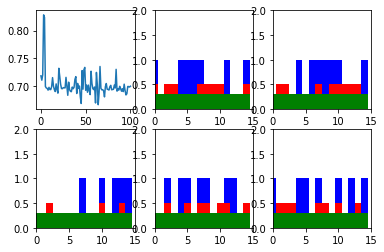

Step 200 Loss 0.68831


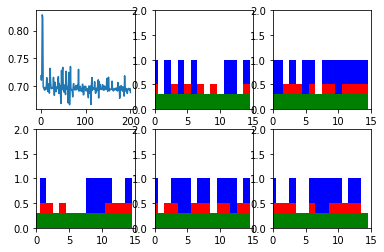

Step 300 Loss 0.693433


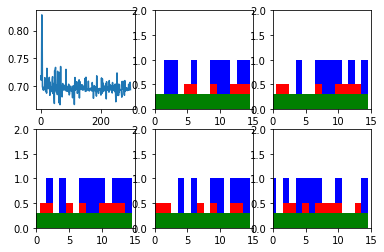

Step 400 Loss 0.693195


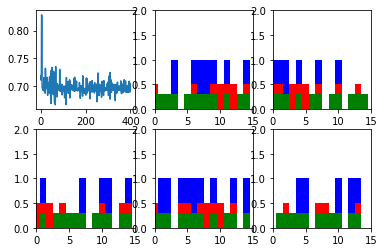

Step 500 Loss 0.69389


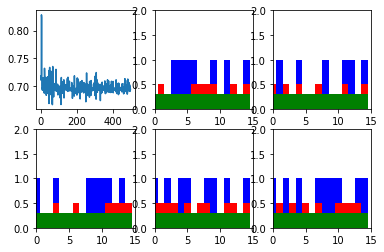

Step 600 Loss 0.690318


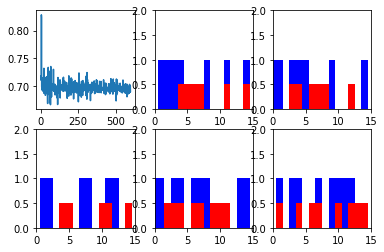

New data, epoch 1
Step 0 Loss 0.696578


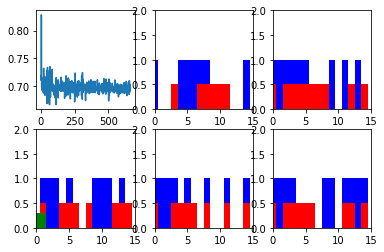

Step 100 Loss 0.690829


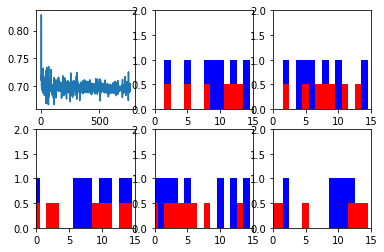

Step 200 Loss 0.692607


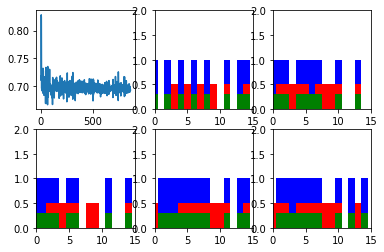

Step 300 Loss 0.699835


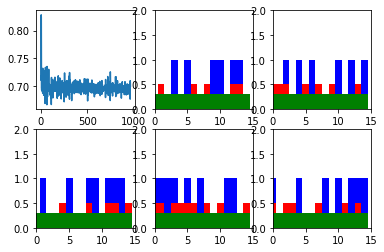

Step 400 Loss 0.690963


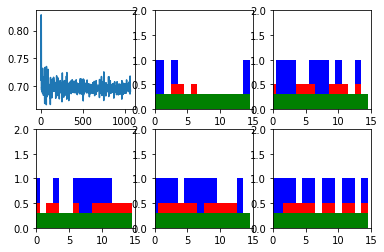

Step 500 Loss 0.698272


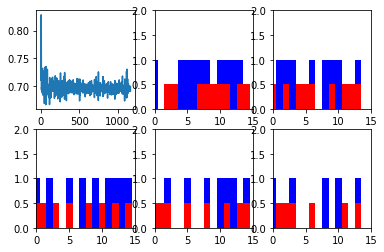

Step 600 Loss 0.699318


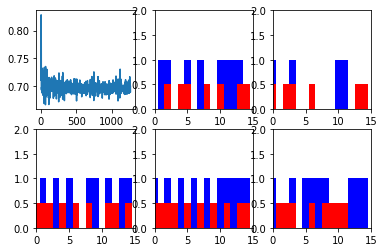

New data, epoch 2
Step 0 Loss 0.691627


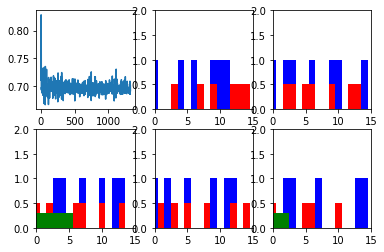

Step 100 Loss 0.713018


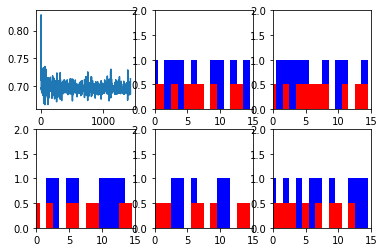

Step 200 Loss 0.694741


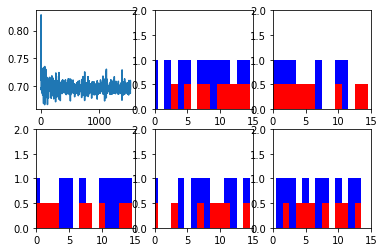

Step 300 Loss 0.693438


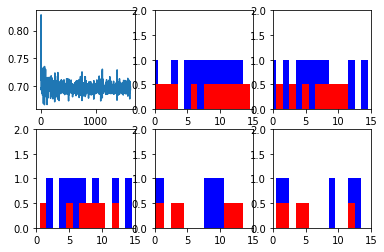

Step 400 Loss 0.687456


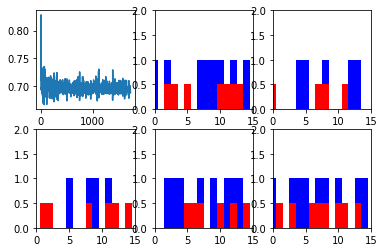

Step 500 Loss 0.69208


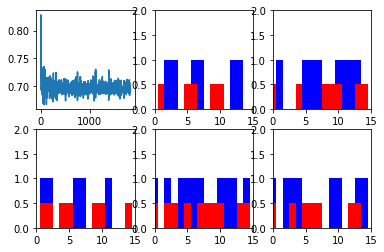

Step 600 Loss 0.69397


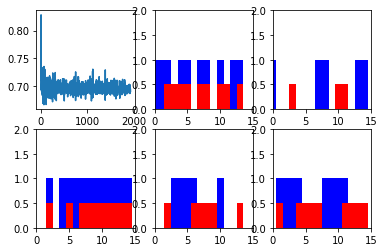

New data, epoch 3
Step 0 Loss 0.728702


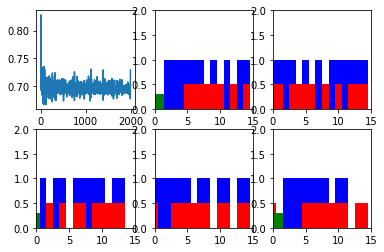

Step 100 Loss 0.693226


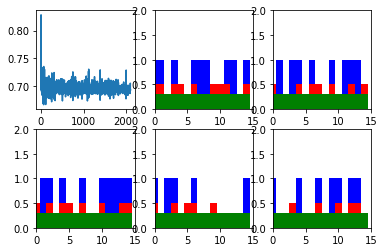

Step 200 Loss 0.691218


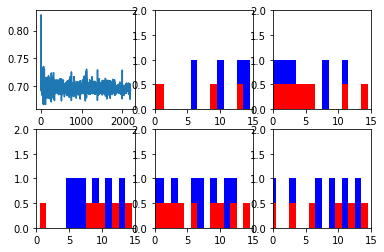

Step 300 Loss 0.692844


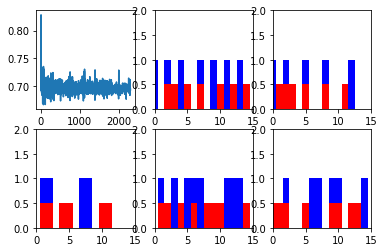

Step 400 Loss 0.694526


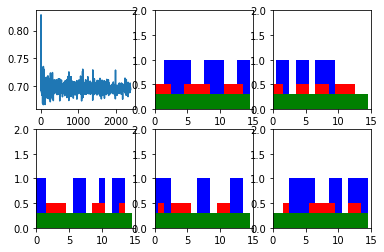

Step 500 Loss 0.694632


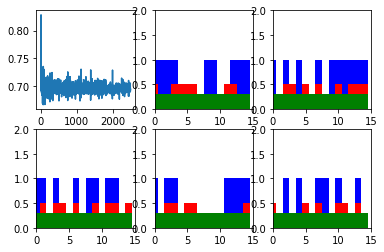

Step 600 Loss 0.696241


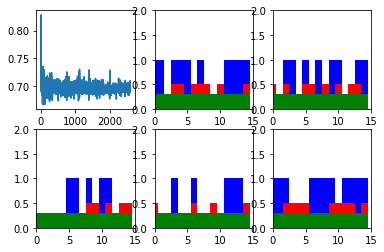

New data, epoch 4
Step 0 Loss 0.692562


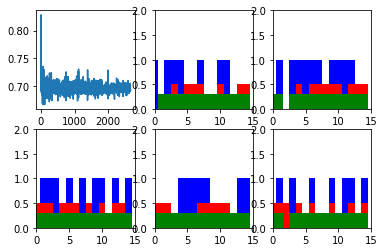

Step 100 Loss 0.69422


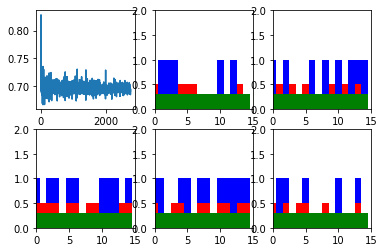

Step 200 Loss 0.0413804


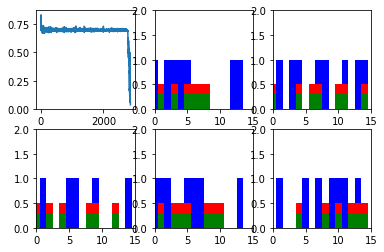

Step 300 Loss 0.00976063


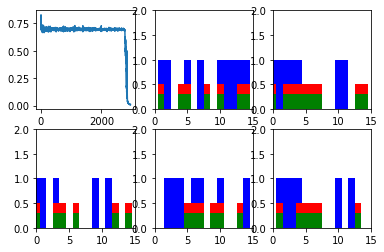

Step 400 Loss 0.00485659


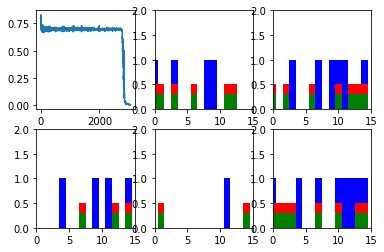

Step 500 Loss 0.00350318


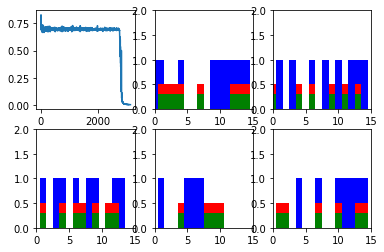

Step 600 Loss 0.00256192


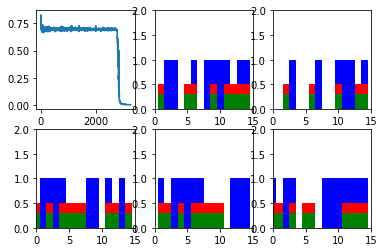

New data, epoch 5
Step 0 Loss 0.139396


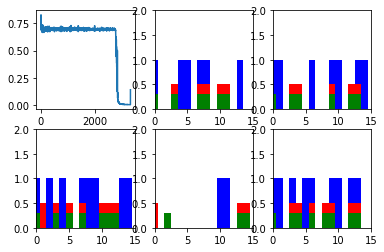

Step 100 Loss 0.0021208


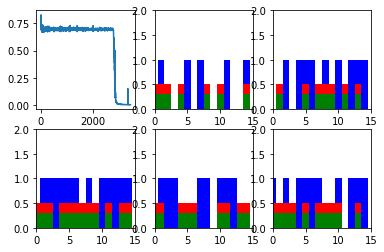

Step 200 Loss 0.00173192


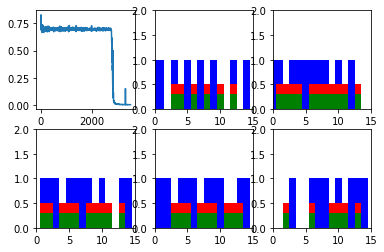

Step 300 Loss 0.00147592


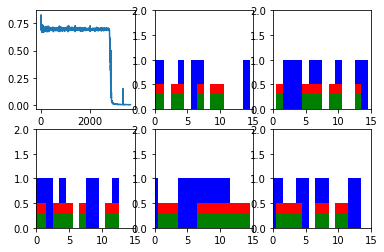

Step 400 Loss 0.00140164


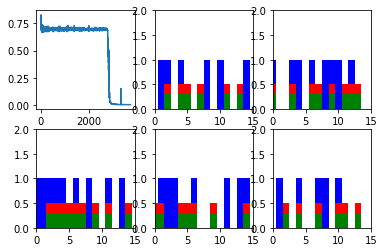

Step 500 Loss 0.00117559


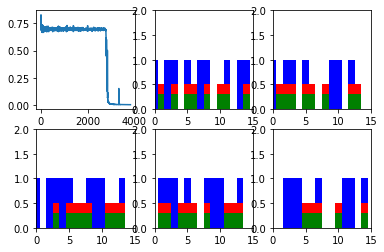

Step 600 Loss 0.00107133


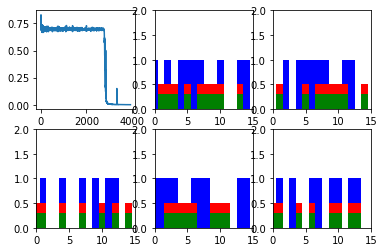

New data, epoch 6
Step 0 Loss 0.250398


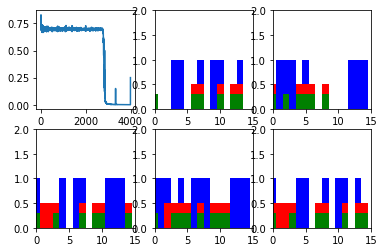

Step 100 Loss 0.000993234


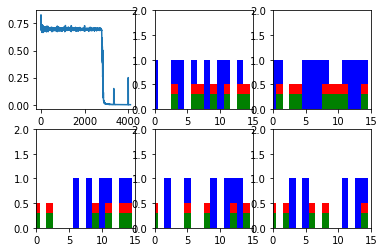

Step 200 Loss 0.000897315


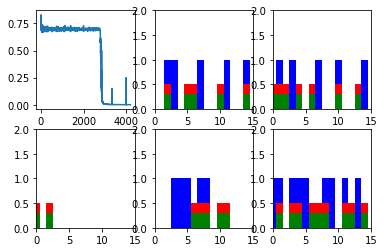

Step 300 Loss 0.00085785


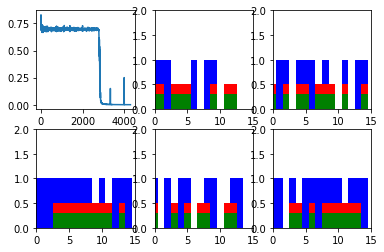

Step 400 Loss 0.0008063


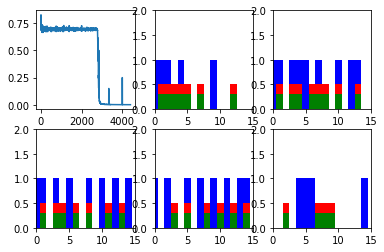

Step 500 Loss 0.000741186


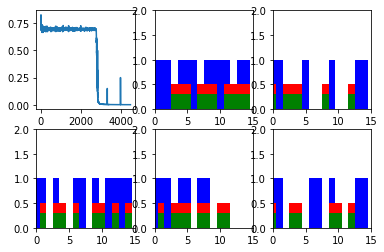

Step 600 Loss 0.00070199


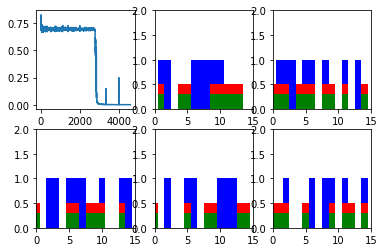

New data, epoch 7
Step 0 Loss 0.170044


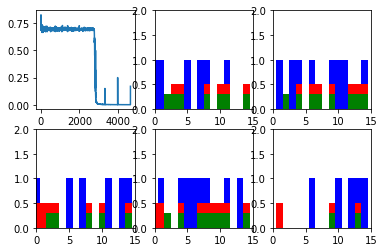

Step 100 Loss 0.000662717


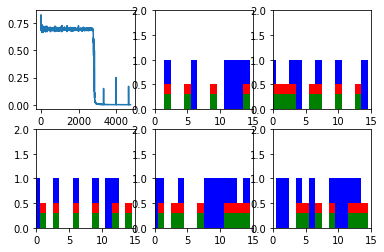

Step 200 Loss 0.000605944


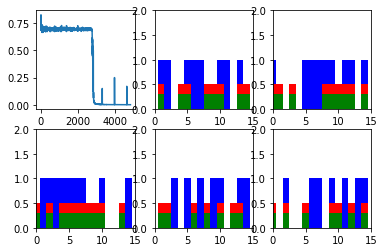

Step 300 Loss 0.000543262


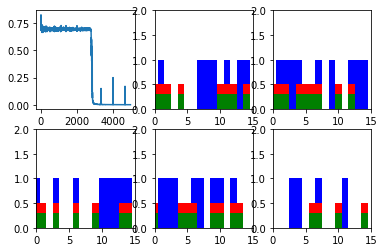

Step 400 Loss 0.000484761


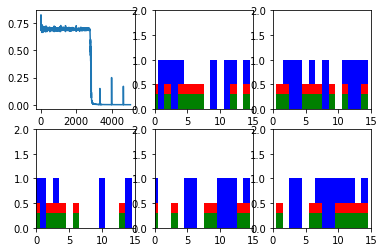

Step 500 Loss 0.00051523


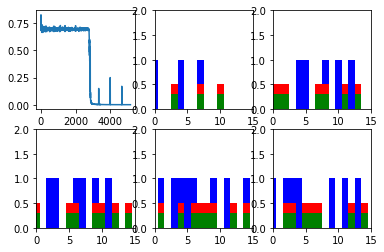

Step 600 Loss 0.00047462


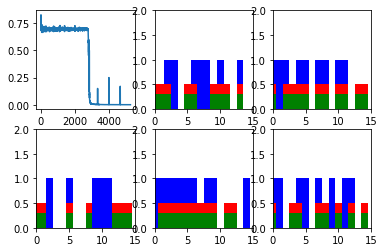

New data, epoch 8
Step 0 Loss 0.208435


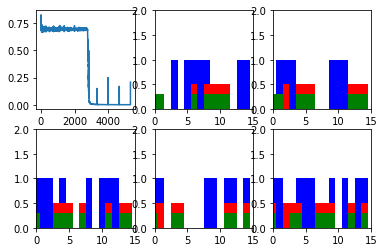

Step 100 Loss 0.000388452


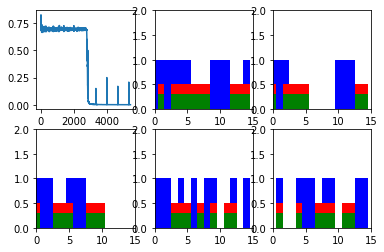

Step 200 Loss 0.000464967


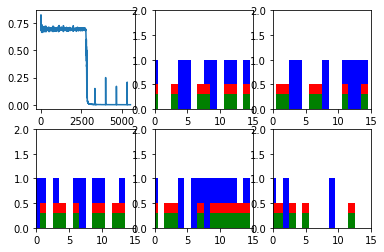

Step 300 Loss 0.00038764


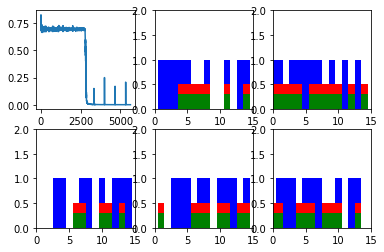

Step 400 Loss 0.000368383


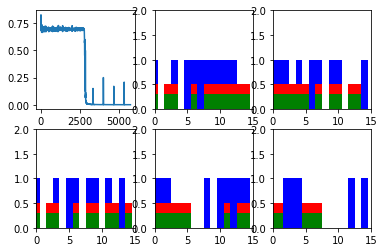

Step 500 Loss 0.000365439


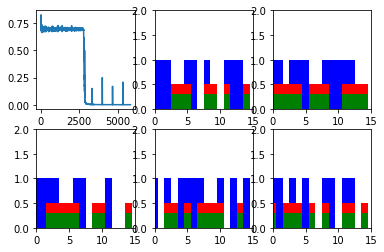

Step 600 Loss 0.000419865


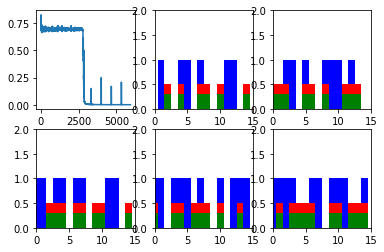

New data, epoch 9
Step 0 Loss 0.127022


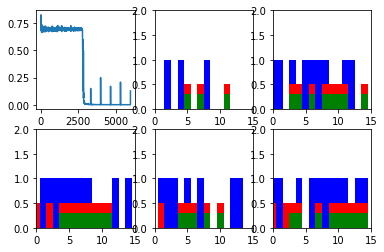

Step 100 Loss 0.000305848


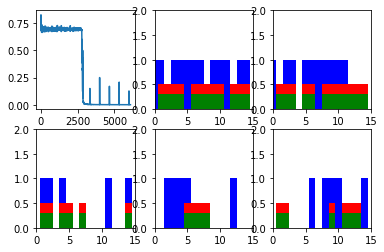

Step 200 Loss 0.000382411


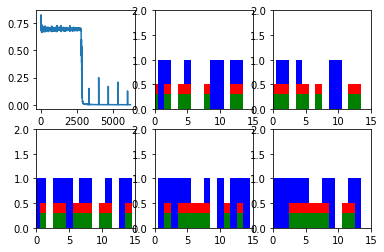

Step 300 Loss 0.00029915


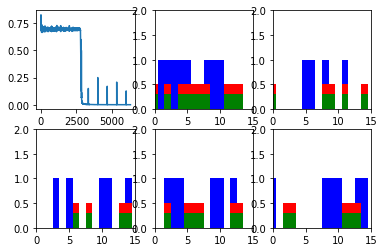

Step 400 Loss 0.000344666


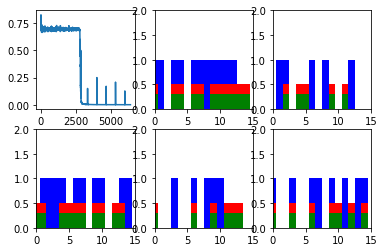

Step 500 Loss 0.000301999


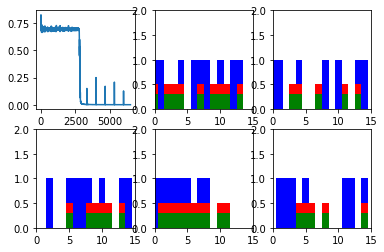

Step 600 Loss 0.00028353


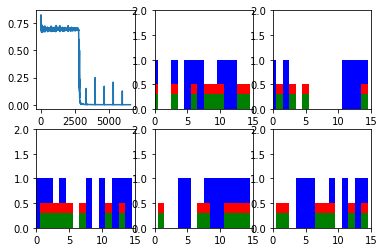

New data, epoch 10
Step 0 Loss 0.159409


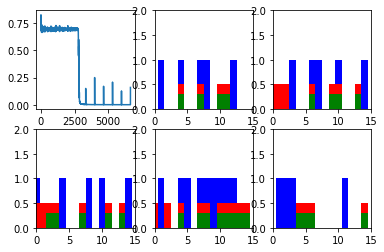

Step 100 Loss 0.000440421


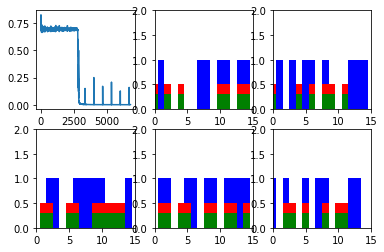

Step 200 Loss 0.000266035


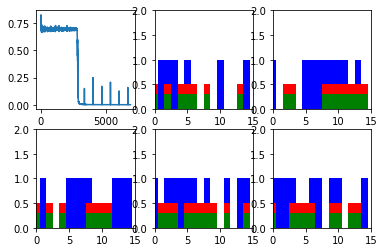

Step 300 Loss 0.000285823


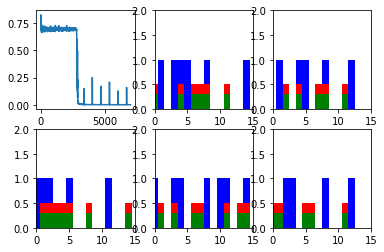

Step 400 Loss 0.00024267


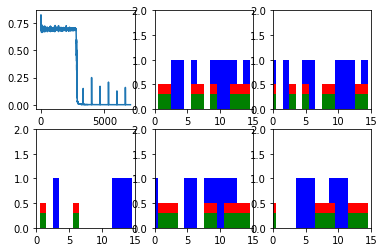

Step 500 Loss 0.000267698


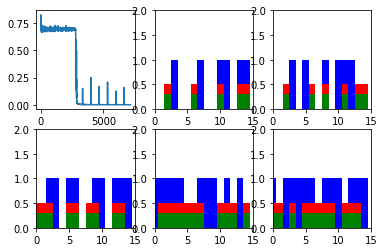

Step 600 Loss 0.000238142


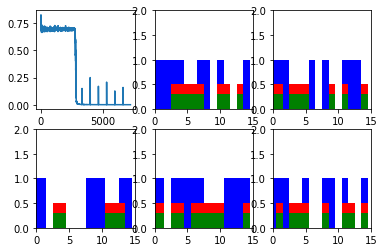

New data, epoch 11
Step 0 Loss 0.214222


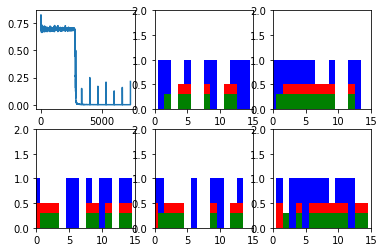

Step 100 Loss 0.000284055


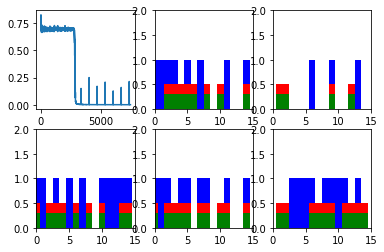

Step 200 Loss 0.000316386


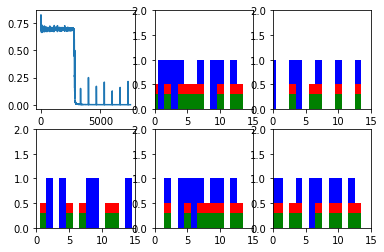

Step 300 Loss 0.000246751


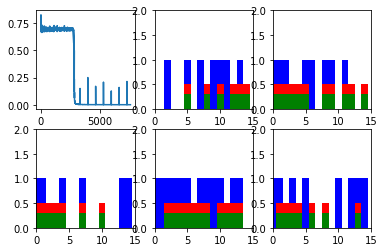

Step 400 Loss 0.000266495


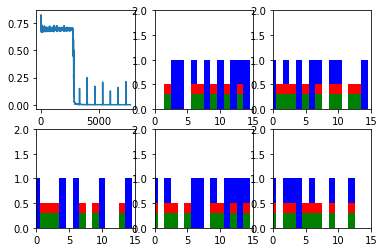

Step 500 Loss 0.000214859


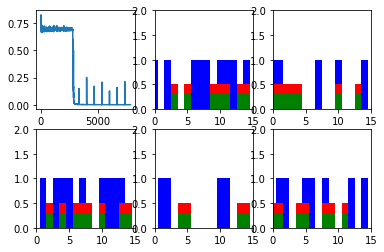

Step 600 Loss 0.000215418


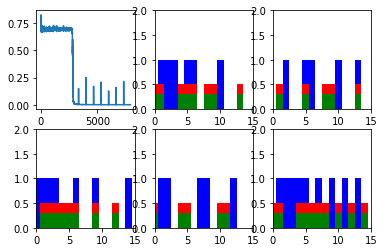

New data, epoch 12
Step 0 Loss 0.235534


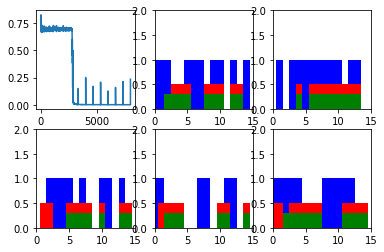

Step 100 Loss 0.000215067


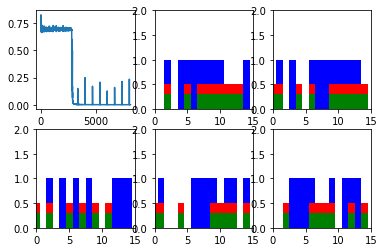

Step 200 Loss 0.000199204


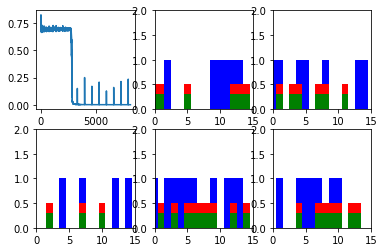

Step 300 Loss 0.000206708


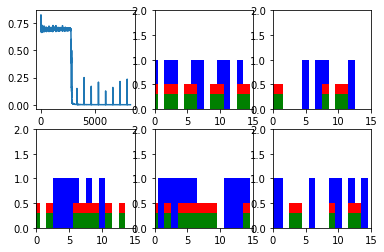

Step 400 Loss 0.000185463


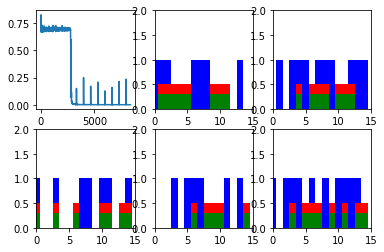

Step 500 Loss 0.000165794


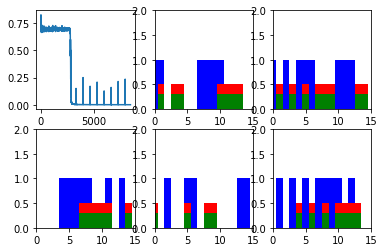

Step 600 Loss 0.00017144


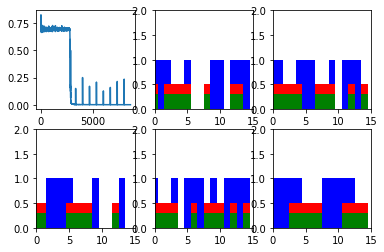

New data, epoch 13
Step 0 Loss 0.172368


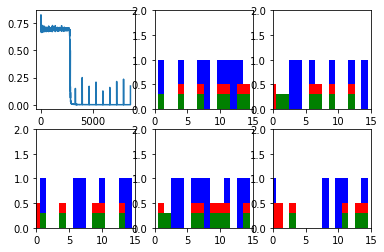

Step 100 Loss 0.000249211


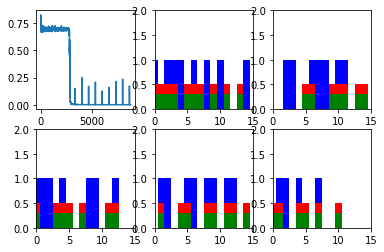

Step 200 Loss 0.000178198


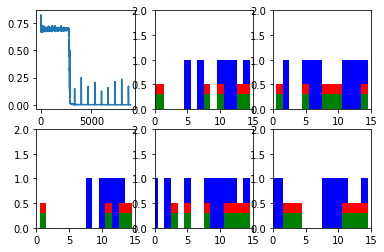

Step 300 Loss 0.000193021


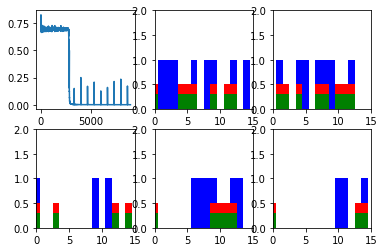

Step 400 Loss 0.000196455


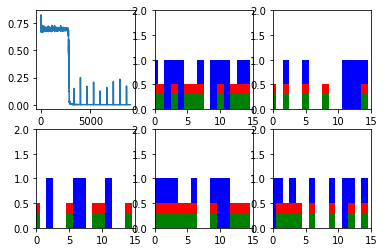

Step 500 Loss 0.000186213


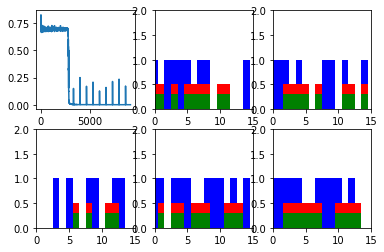

Step 600 Loss 0.000173957


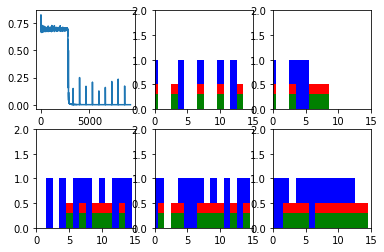

New data, epoch 14
Step 0 Loss 0.363767


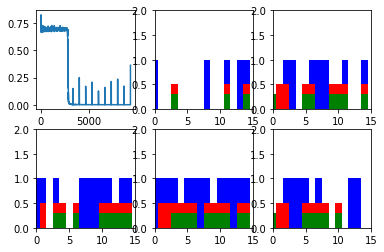

Step 100 Loss 0.000188862


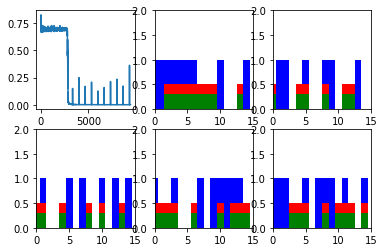

Step 200 Loss 0.000164193


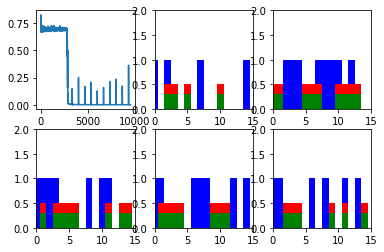

Step 300 Loss 0.000191278


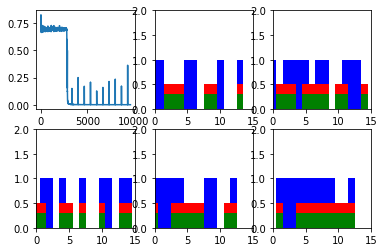

Step 400 Loss 0.000183888


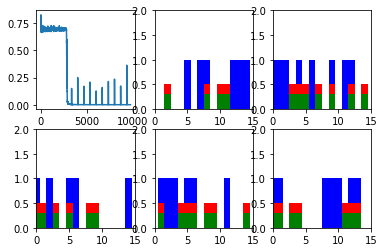

Step 500 Loss 0.000193864


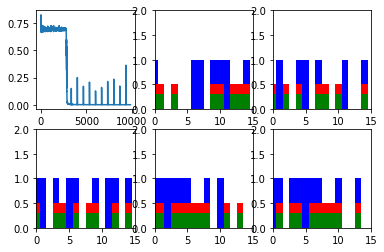

Step 600 Loss 0.000168739


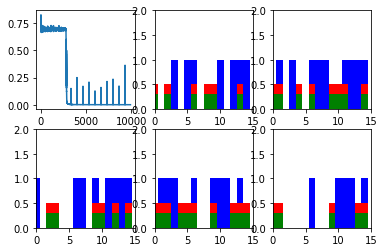

New data, epoch 15
Step 0 Loss 0.237747


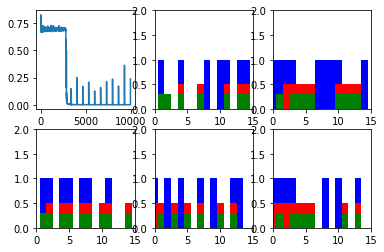

Step 100 Loss 0.000192495


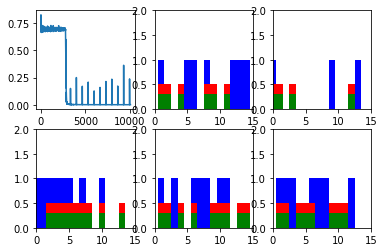

Step 200 Loss 0.000188641


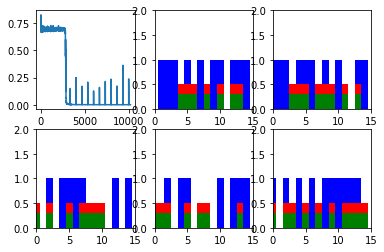

Step 300 Loss 0.00016382


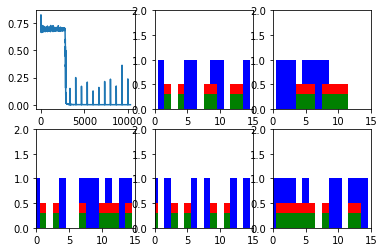

Step 400 Loss 0.000131198


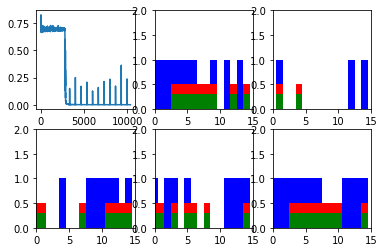

Step 500 Loss 0.000159828


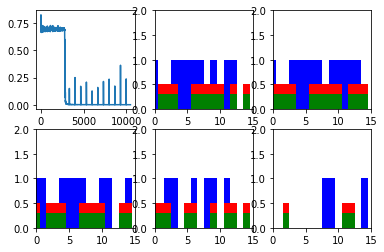

Step 600 Loss 0.000153032


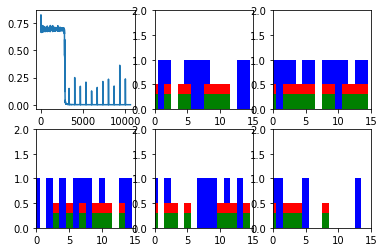

New data, epoch 16
Step 0 Loss 0.215014


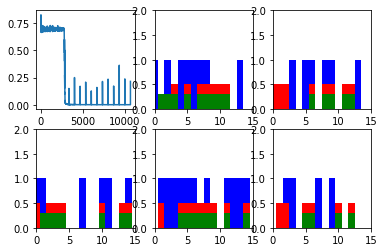

Step 100 Loss 0.000146266


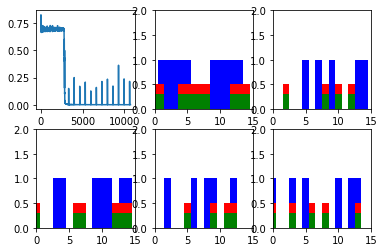

Step 200 Loss 0.00014002


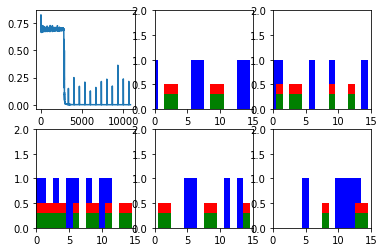

Step 300 Loss 0.000154585


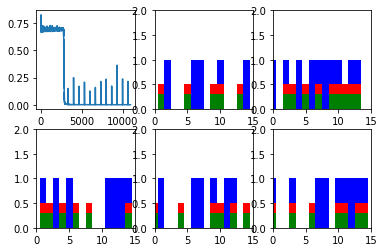

Step 400 Loss 0.000139397


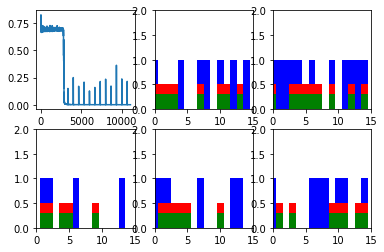

Step 500 Loss 0.000136794


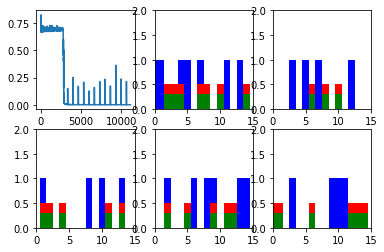

Step 600 Loss 0.000124471


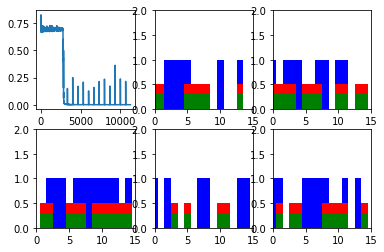

New data, epoch 17
Step 0 Loss 0.215315


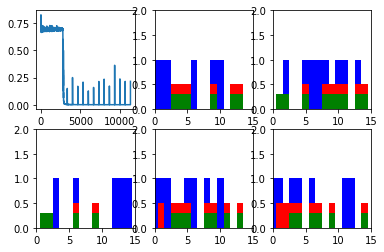

Step 100 Loss 0.000145665


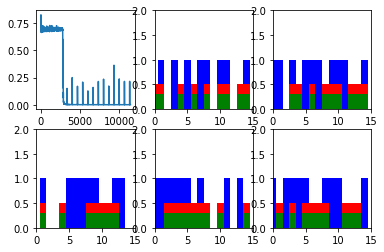

Step 200 Loss 0.000152832


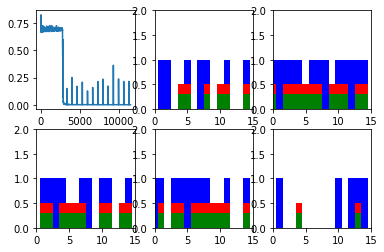

Step 300 Loss 0.000137684


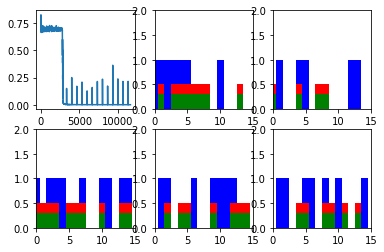

Step 400 Loss 0.00013941


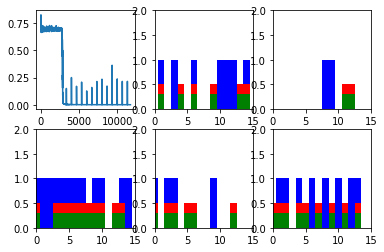

Step 500 Loss 0.000130956


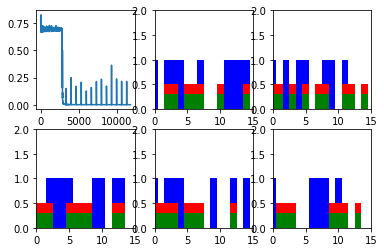

Step 600 Loss 0.000139331


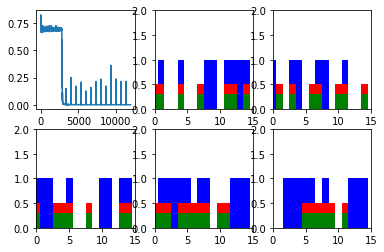

New data, epoch 18
Step 0 Loss 0.193027


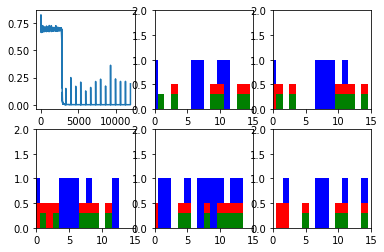

Step 100 Loss 0.000129876


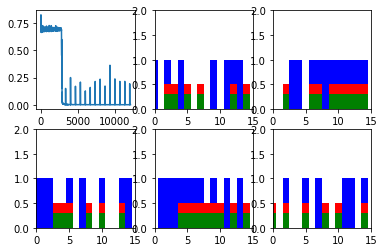

Step 200 Loss 0.000130334


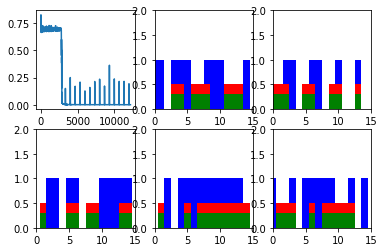

Step 300 Loss 0.000142307


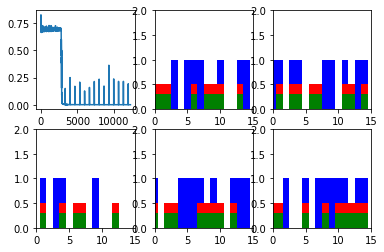

Step 400 Loss 0.000132729


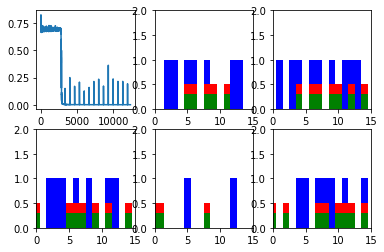

Step 500 Loss 0.000115052


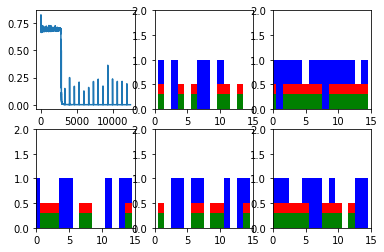

Step 600 Loss 0.000127988


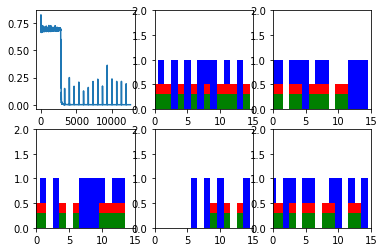

New data, epoch 19
Step 0 Loss 0.178966


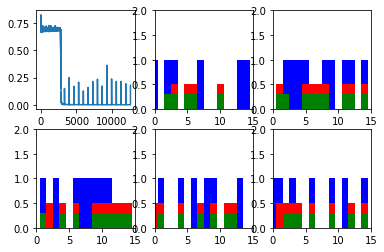

Step 100 Loss 0.000123838


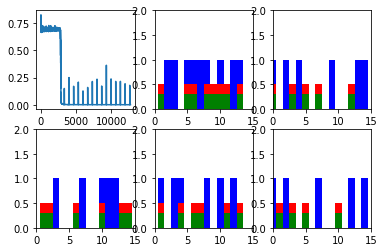

Step 200 Loss 0.000130112


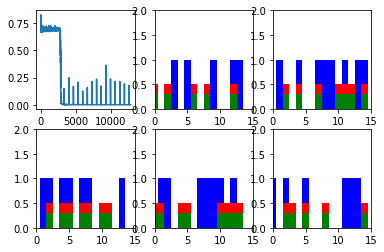

Step 300 Loss 0.000130614


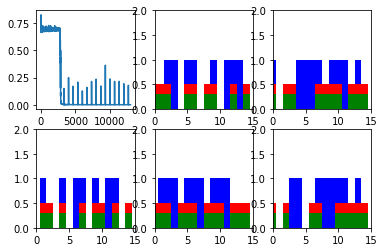

Step 400 Loss 0.000119455


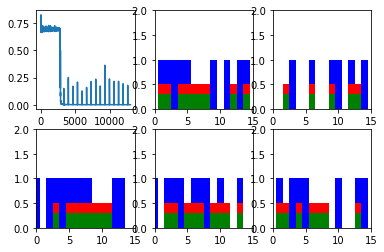

Step 500 Loss 0.000134143


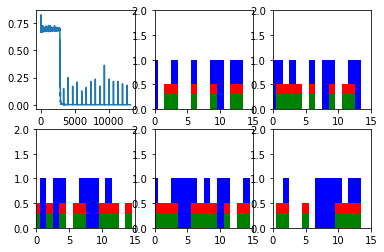

Step 600 Loss 0.000113268


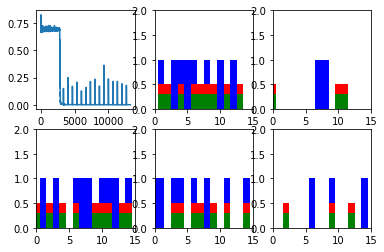

New data, epoch 20
Step 0 Loss 0.203729


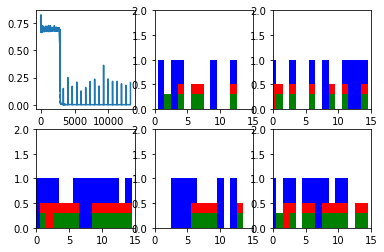

Step 100 Loss 0.00011277


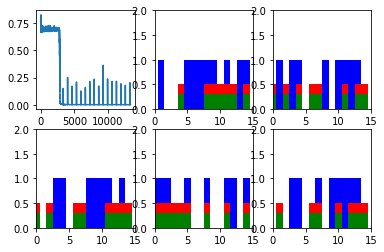

Step 200 Loss 0.00013408


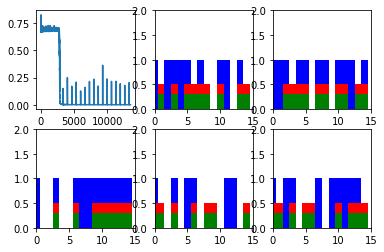

Step 300 Loss 0.000125357


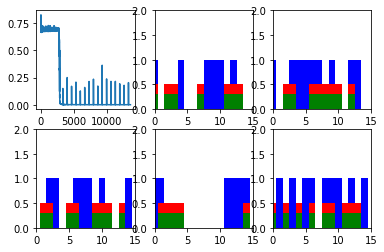

Step 400 Loss 0.000132149


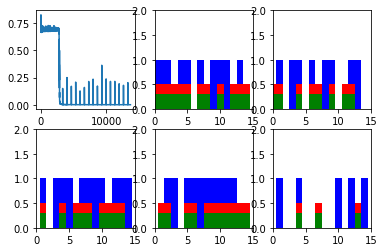

Step 500 Loss 0.000125314


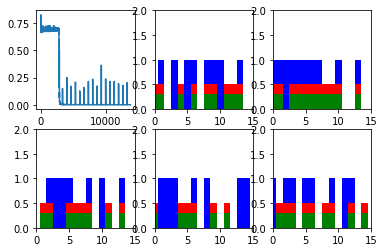

Step 600 Loss 0.000112559


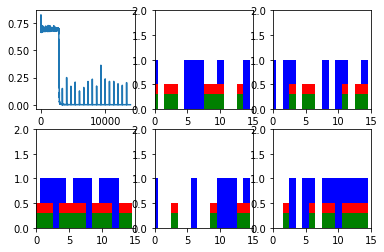

New data, epoch 21
Step 0 Loss 0.384908


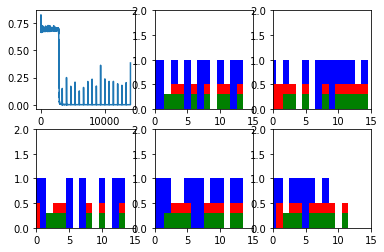

Step 100 Loss 0.000172642


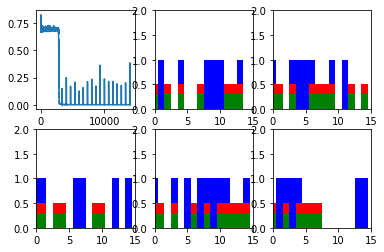

Step 200 Loss 0.000175127


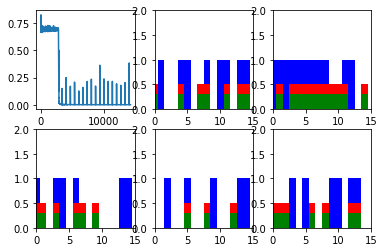

Step 300 Loss 0.000131978


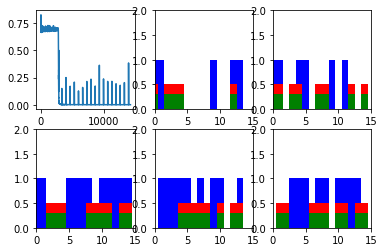

Step 400 Loss 0.000122599


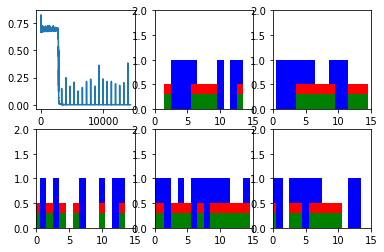

Step 500 Loss 0.00011968


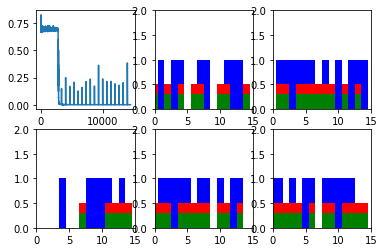

Step 600 Loss 0.000116594


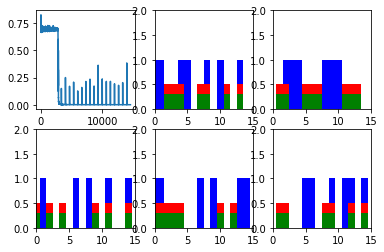

New data, epoch 22
Step 0 Loss 0.256558


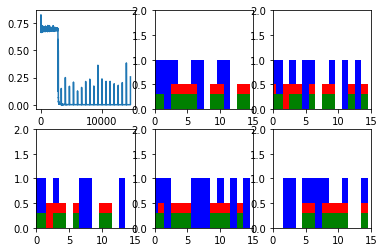

Step 100 Loss 0.000140025


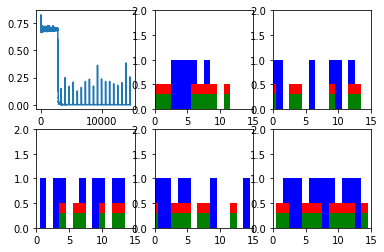

Step 200 Loss 0.000145776


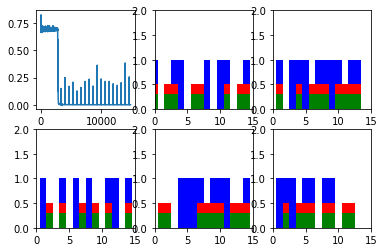

Step 300 Loss 0.00010904


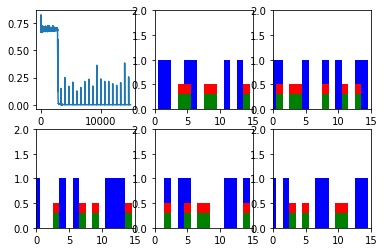

Step 400 Loss 0.000120258


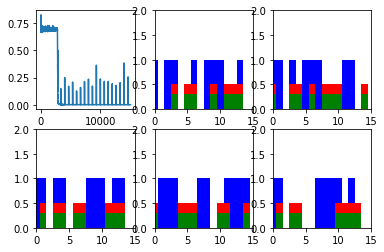

Step 500 Loss 0.000121872


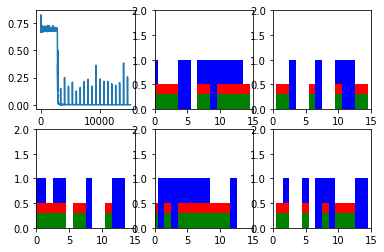

Step 600 Loss 0.000114587


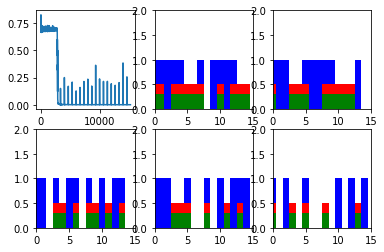

New data, epoch 23
Step 0 Loss 0.220746


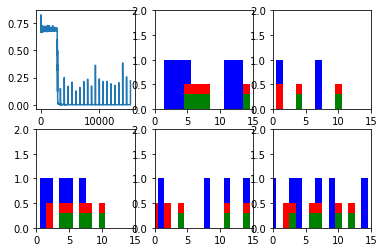

Step 100 Loss 0.000125772


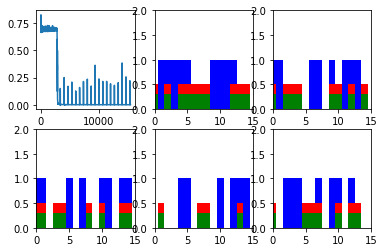

Step 200 Loss 0.000125209


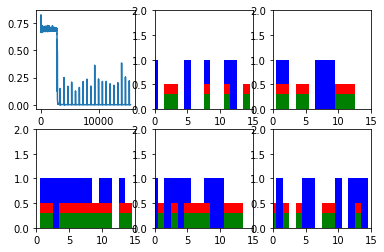

Step 300 Loss 0.000114581


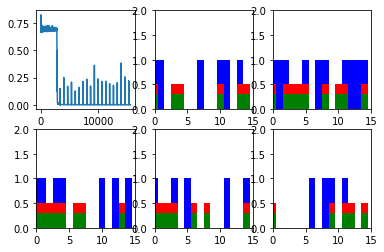

Step 400 Loss 0.000114121


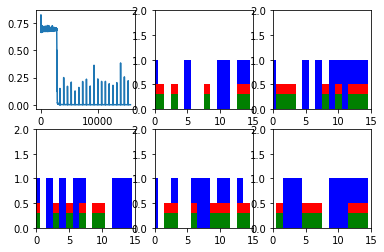

Step 500 Loss 0.00012557


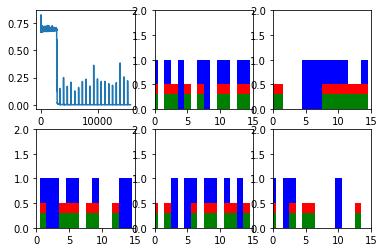

Step 600 Loss 0.000122373


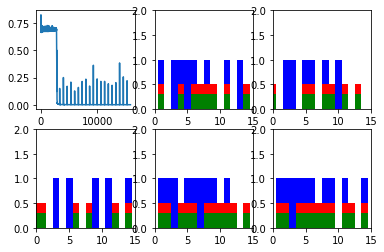

New data, epoch 24
Step 0 Loss 0.109732


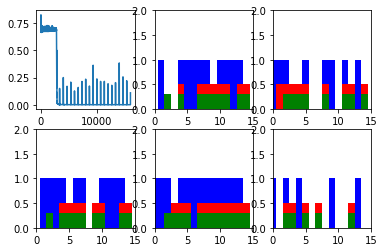

Step 100 Loss 0.000114973


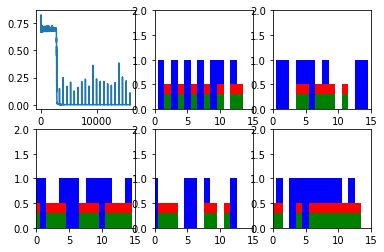

Step 200 Loss 0.00012103


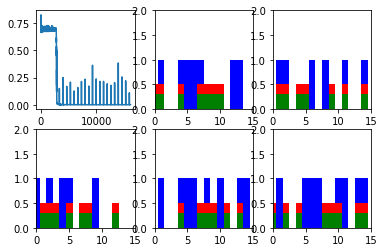

Step 300 Loss 9.54172e-05


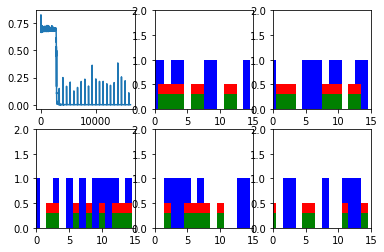

Step 400 Loss 0.00012238


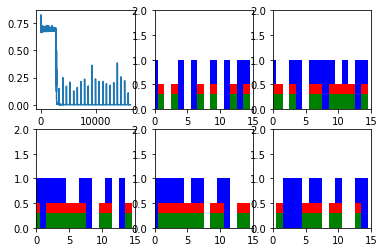

Step 500 Loss 9.40096e-05


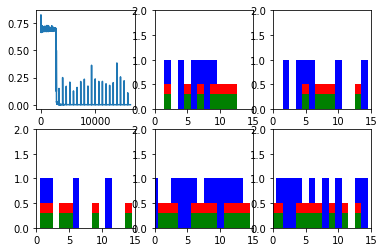

Step 600 Loss 8.85296e-05


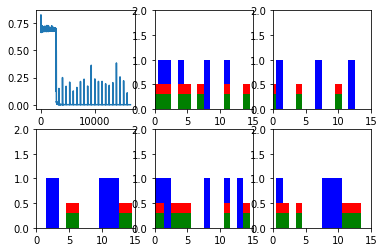

New data, epoch 25
Step 0 Loss 0.111157


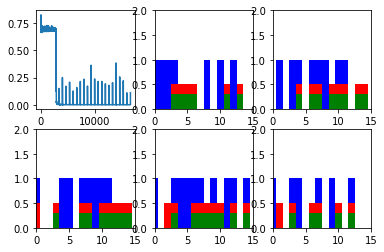

Step 100 Loss 9.64014e-05


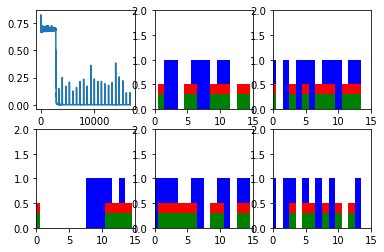

Step 200 Loss 9.64862e-05


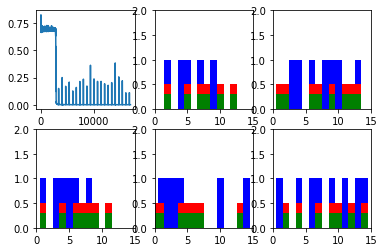

Step 300 Loss 8.39622e-05


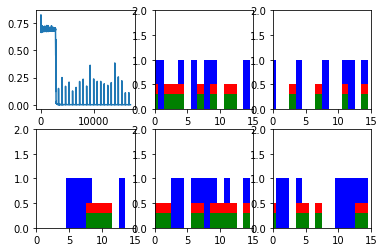

Step 400 Loss 8.94514e-05


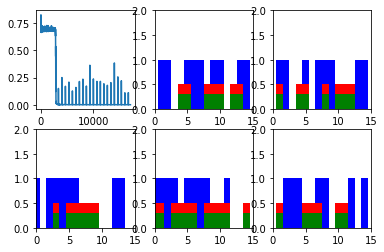

Step 500 Loss 8.69409e-05


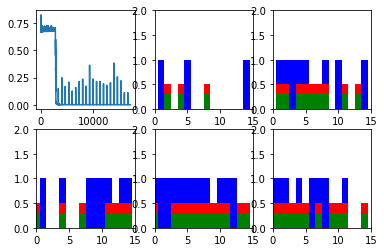

Step 600 Loss 8.53469e-05


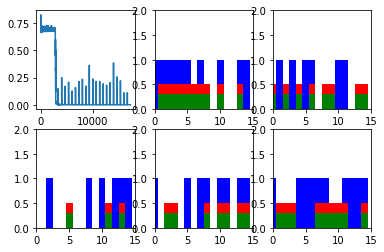

New data, epoch 26
Step 0 Loss 0.198919


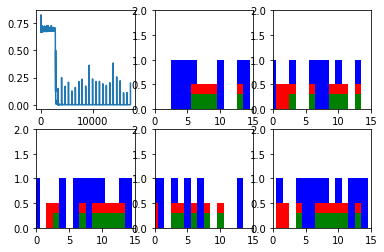

Step 100 Loss 0.00014129


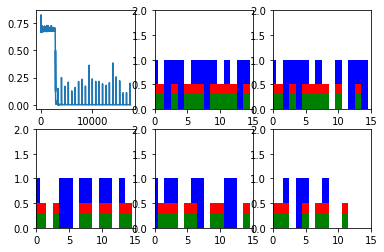

Step 200 Loss 0.000109327


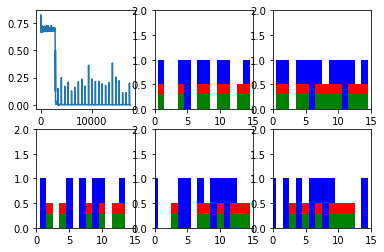

Step 300 Loss 9.85456e-05


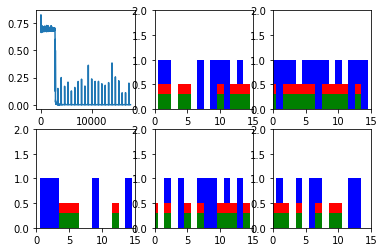

Step 400 Loss 0.000104601


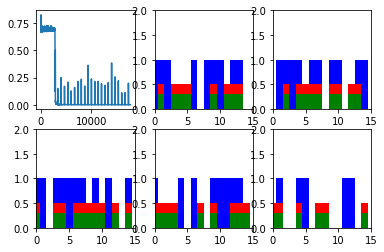

Step 500 Loss 9.51804e-05


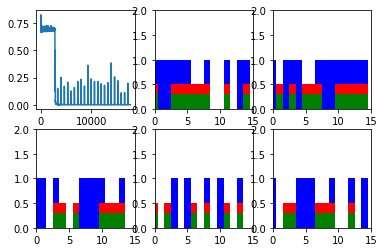

Step 600 Loss 7.69877e-05


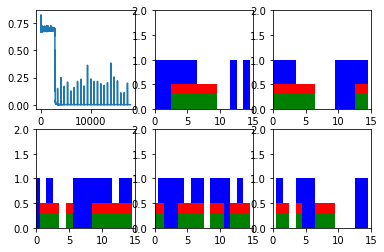

New data, epoch 27
Step 0 Loss 0.190107


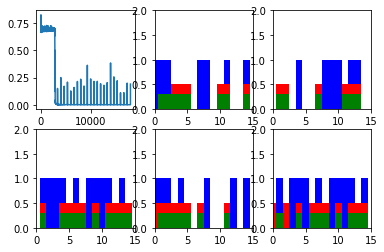

Step 100 Loss 9.73054e-05


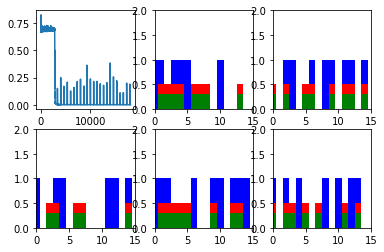

Step 200 Loss 9.13204e-05


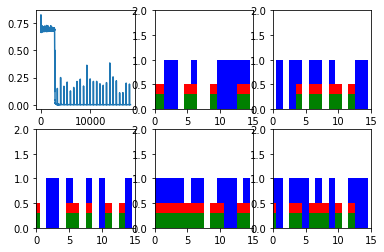

Step 300 Loss 9.56271e-05


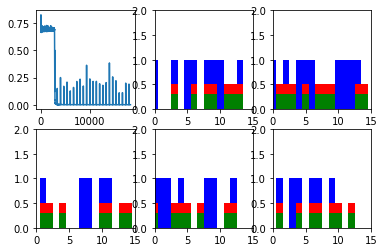

Step 400 Loss 9.74531e-05


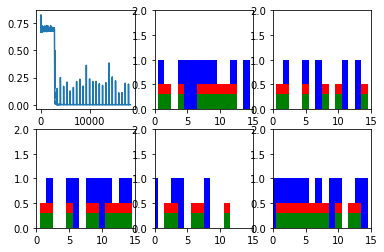

Step 500 Loss 8.58069e-05


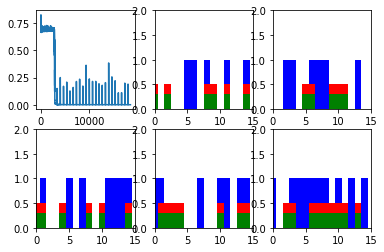

Step 600 Loss 8.78142e-05


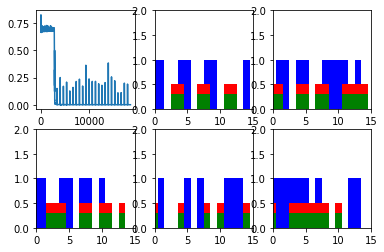

New data, epoch 28
Step 0 Loss 0.187039


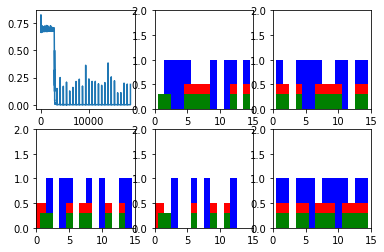

Step 100 Loss 9.42638e-05


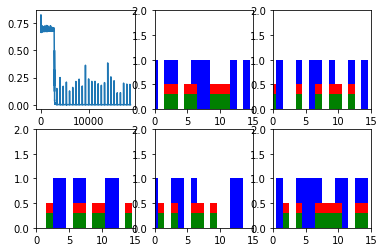

Step 200 Loss 8.64322e-05


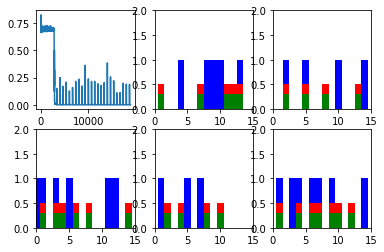

Step 300 Loss 8.66752e-05


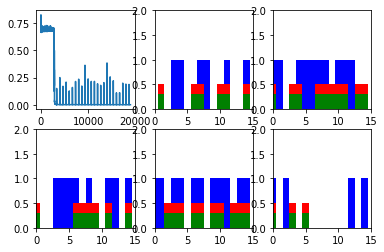

Step 400 Loss 8.13149e-05


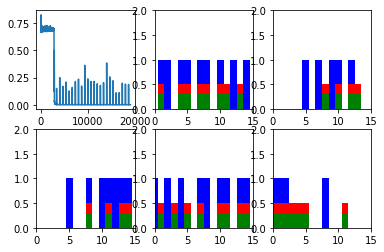

Step 500 Loss 8.64228e-05


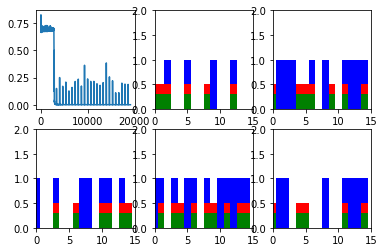

Step 600 Loss 9.1373e-05


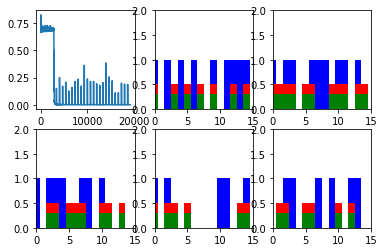

New data, epoch 29
Step 0 Loss 0.287949


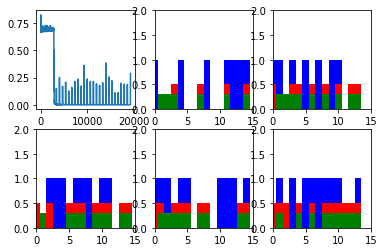

Step 100 Loss 8.46841e-05


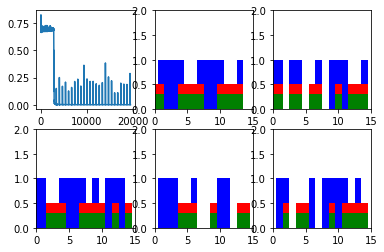

Step 200 Loss 7.13743e-05


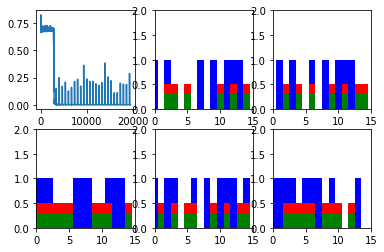

Step 300 Loss 8.37181e-05


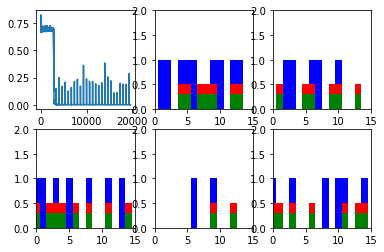

Step 400 Loss 8.1258e-05


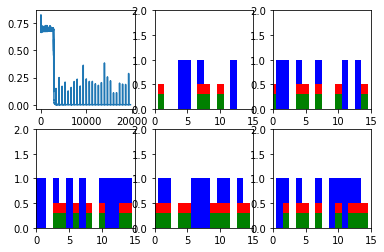

Step 500 Loss 8.54406e-05


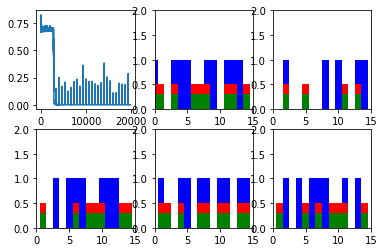

Step 600 Loss 7.019e-05


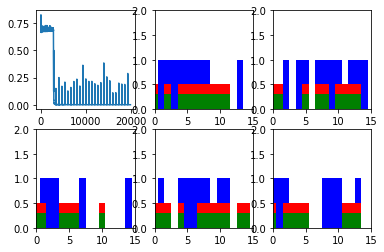

New data, epoch 30
Step 0 Loss 0.113391


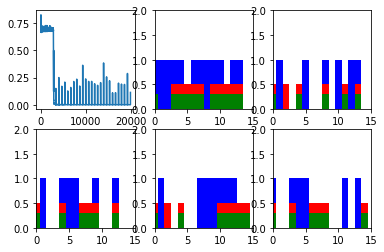

Step 100 Loss 7.40539e-05


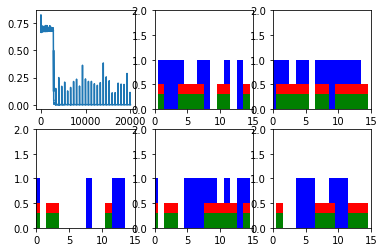

Step 200 Loss 7.30765e-05


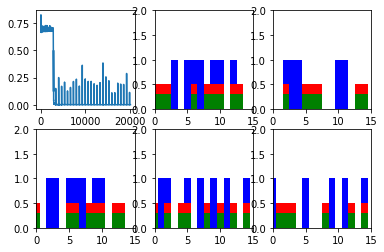

Step 300 Loss 7.6015e-05


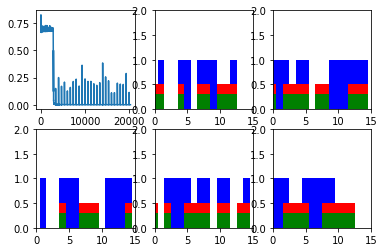

Step 400 Loss 6.60279e-05


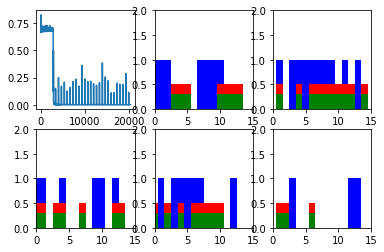

Step 500 Loss 7.79095e-05


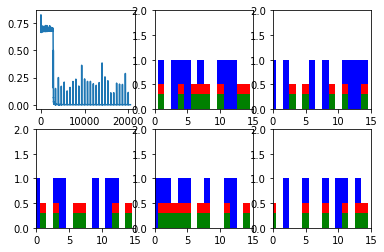

Step 600 Loss 6.64315e-05


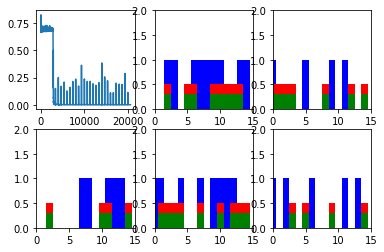

New data, epoch 31
Step 0 Loss 0.129273


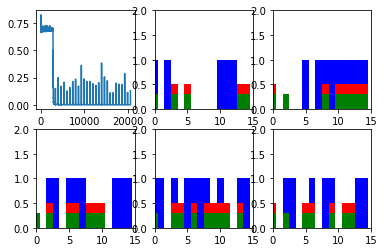

Step 100 Loss 7.56681e-05


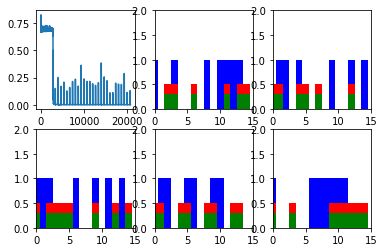

Step 200 Loss 8.03694e-05


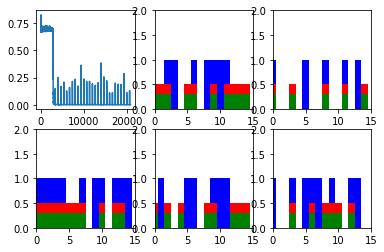

Step 300 Loss 7.54186e-05


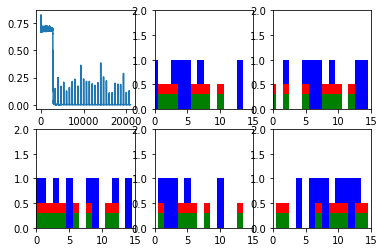

Step 400 Loss 7.37501e-05


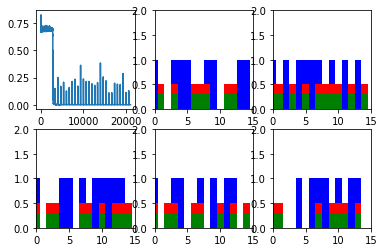

Step 500 Loss 7.18394e-05


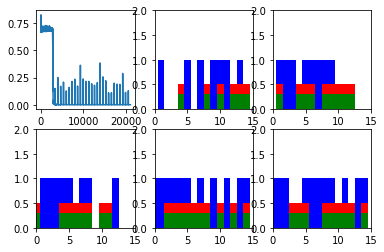

Step 600 Loss 6.91026e-05


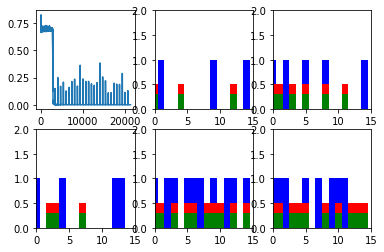

New data, epoch 32
Step 0 Loss 0.246623


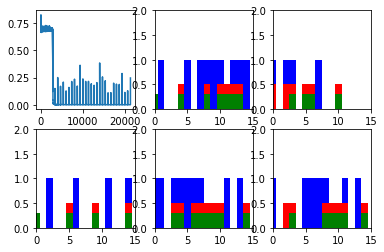

Step 100 Loss 7.29282e-05


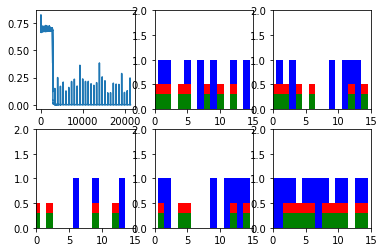

Step 200 Loss 7.48416e-05


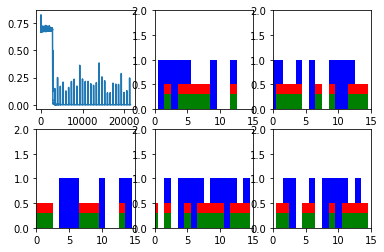

Step 300 Loss 7.92522e-05


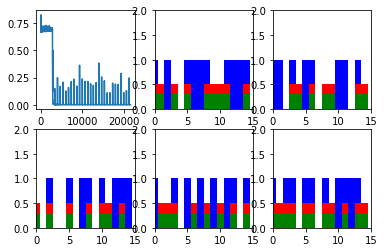

Step 400 Loss 6.70863e-05


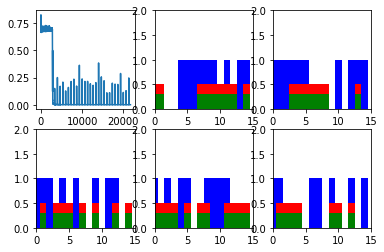

Step 500 Loss 6.35387e-05


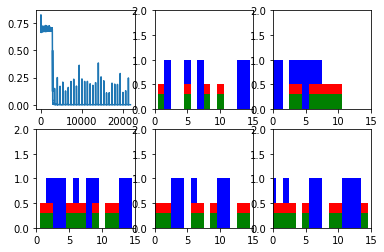

Step 600 Loss 7.64628e-05


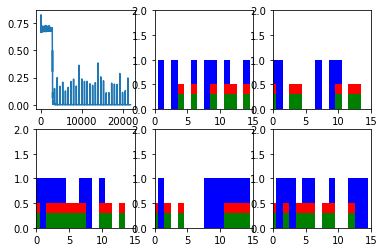

New data, epoch 33
Step 0 Loss 0.280034


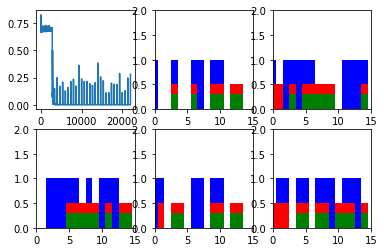

Step 100 Loss 6.38963e-05


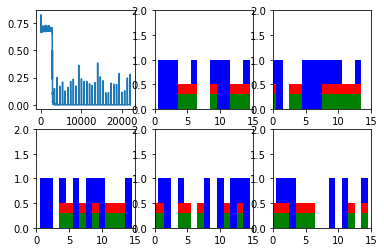

Step 200 Loss 6.87297e-05


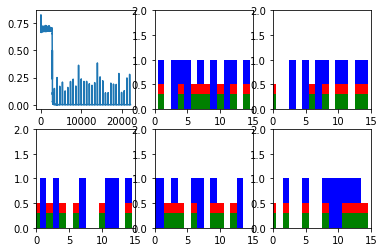

Step 300 Loss 6.60833e-05


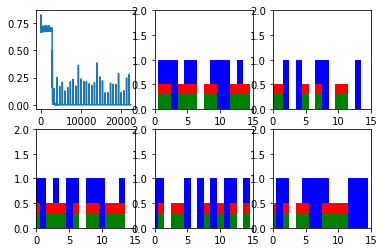

Step 400 Loss 5.67669e-05


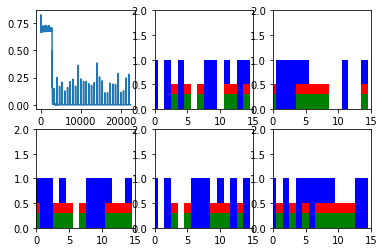

Step 500 Loss 5.99518e-05


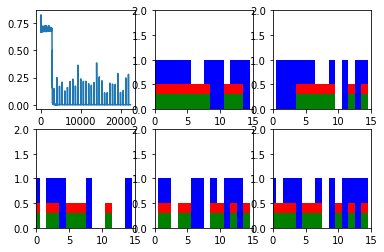

Step 600 Loss 6.53523e-05


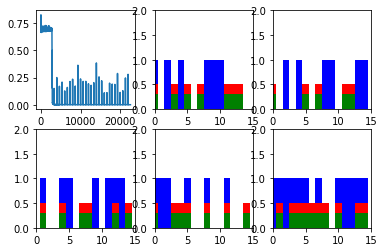

New data, epoch 34
Step 0 Loss 0.130826


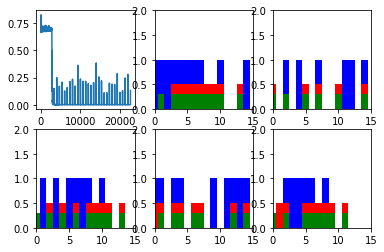

Step 100 Loss 6.13138e-05


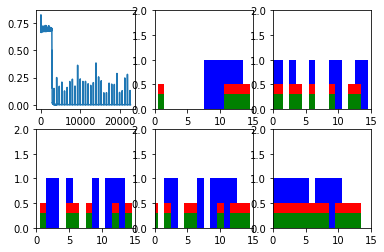

Step 200 Loss 5.91969e-05


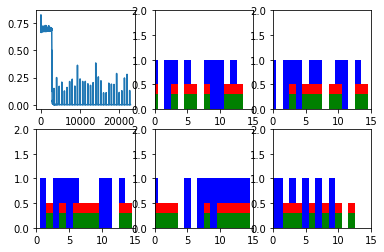

Step 300 Loss 6.68923e-05


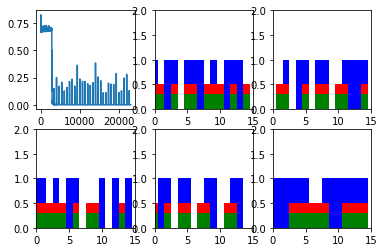

Step 400 Loss 5.87916e-05


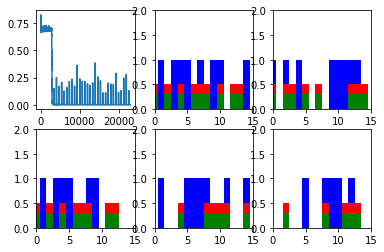

Step 500 Loss 5.81065e-05


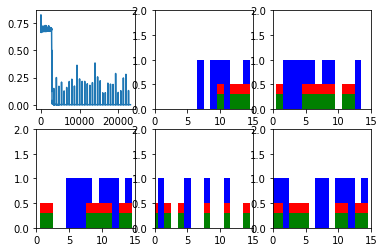

Step 600 Loss 5.99089e-05


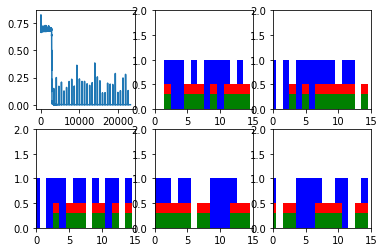

New data, epoch 35
Step 0 Loss 0.253754


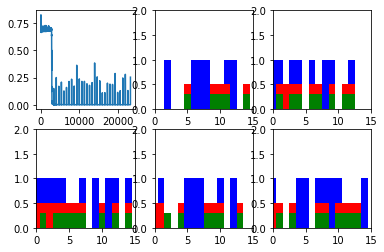

Step 100 Loss 7.31195e-05


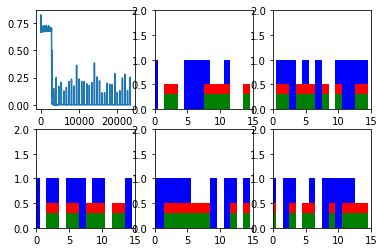

Step 200 Loss 6.89956e-05


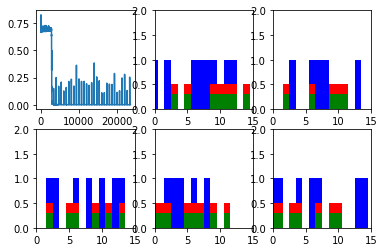

Step 300 Loss 7.42084e-05


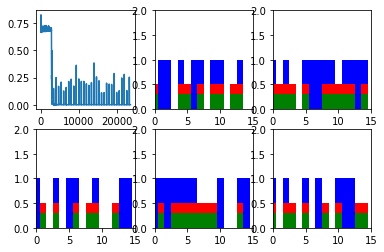

Step 400 Loss 6.08315e-05


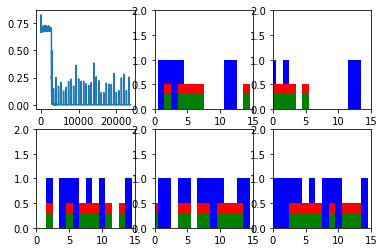

Step 500 Loss 6.27819e-05


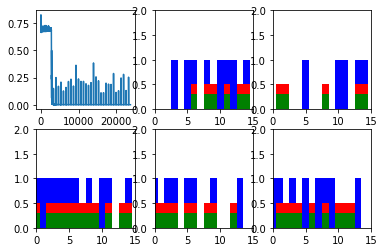

Step 600 Loss 6.24389e-05


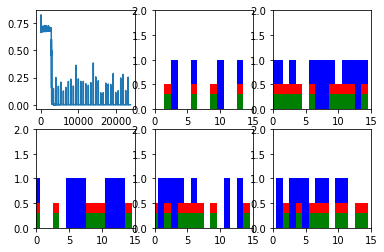

New data, epoch 36
Step 0 Loss 0.329403


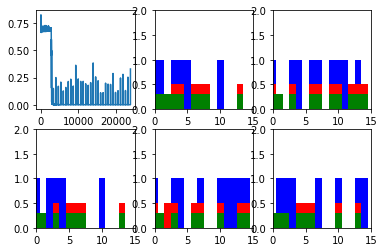

Step 100 Loss 7.8866e-05


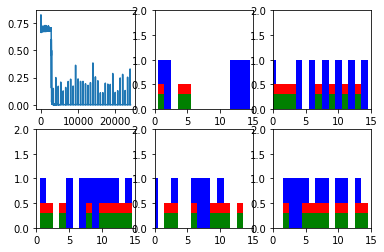

Step 200 Loss 6.60332e-05


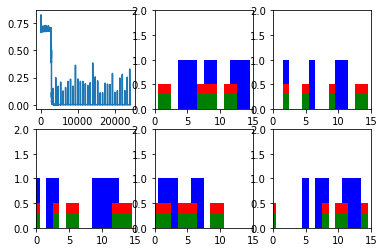

Step 300 Loss 7.98411e-05


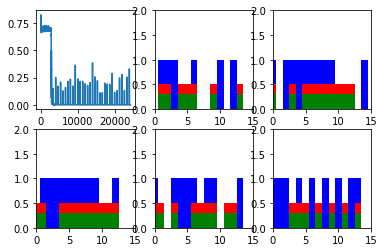

Step 400 Loss 8.07528e-05


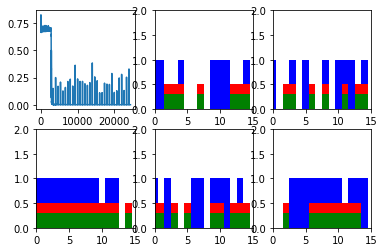

Step 500 Loss 8.45349e-05


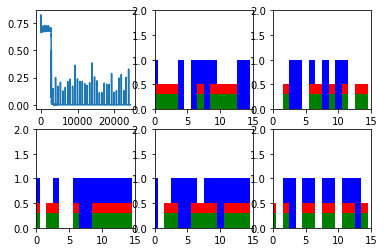

Step 600 Loss 8.46362e-05


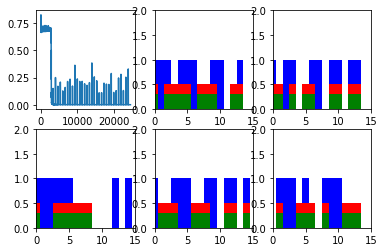

New data, epoch 37
Step 0 Loss 0.428847


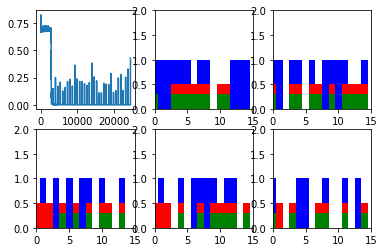

Step 100 Loss 6.2984e-05


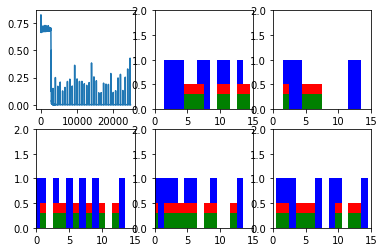

Step 200 Loss 6.40093e-05


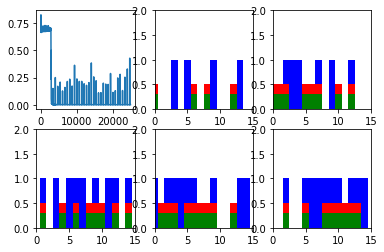

Step 300 Loss 5.95258e-05


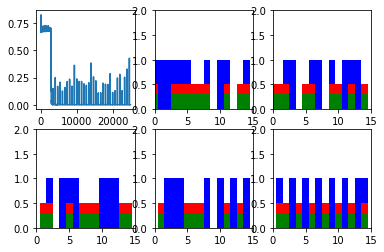

Step 400 Loss 6.96992e-05


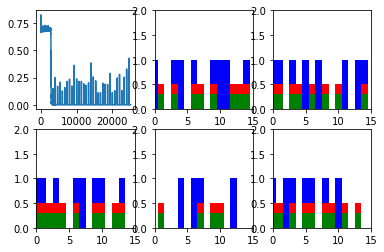

Step 500 Loss 6.10738e-05


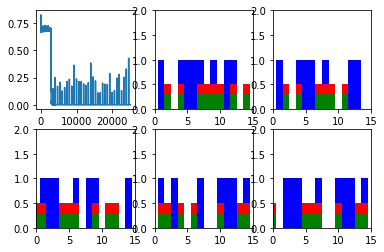

Step 600 Loss 5.8898e-05


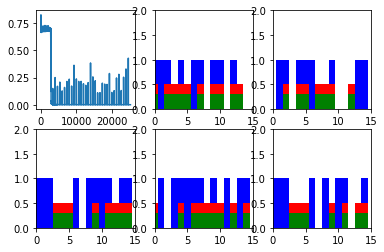

New data, epoch 38
Step 0 Loss 0.125905


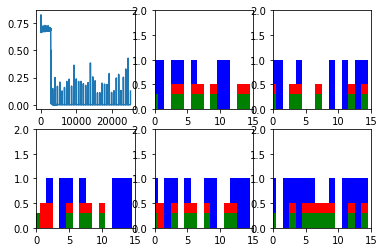

Step 100 Loss 6.12073e-05


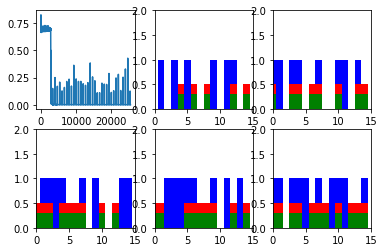

Step 200 Loss 5.37359e-05


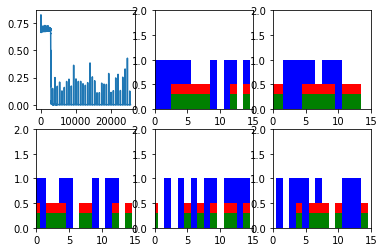

Step 300 Loss 5.63585e-05


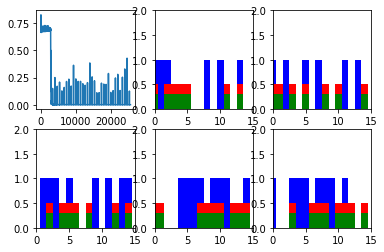

Step 400 Loss 6.52155e-05


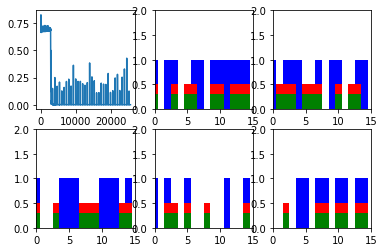

Step 500 Loss 6.14776e-05


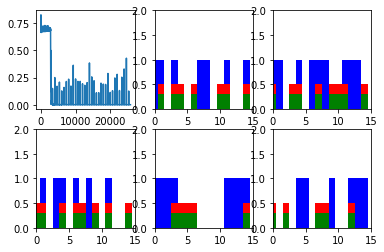

Step 600 Loss 5.47325e-05


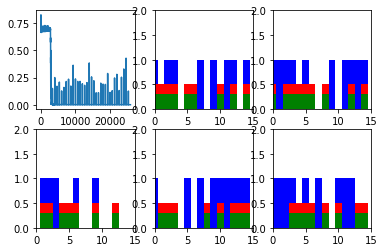

New data, epoch 39
Step 0 Loss 0.171506


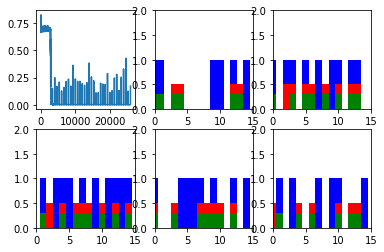

Step 100 Loss 5.84624e-05


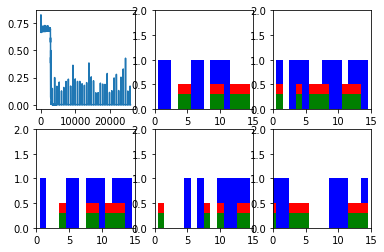

Step 200 Loss 5.98435e-05


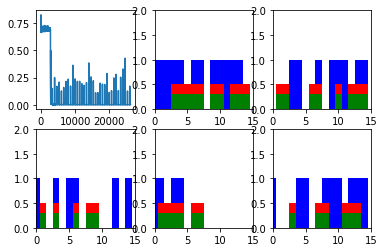

Step 300 Loss 5.63343e-05


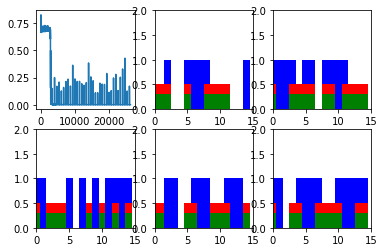

Step 400 Loss 5.82608e-05


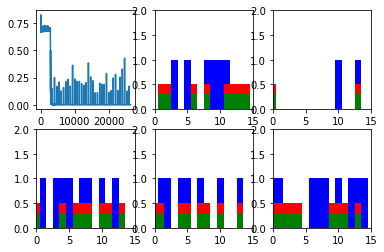

Step 500 Loss 5.9839e-05


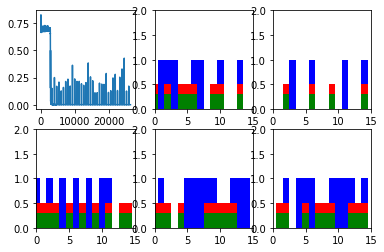

Step 600 Loss 5.21705e-05


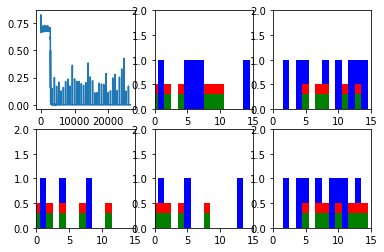

New data, epoch 40
Step 0 Loss 0.214367


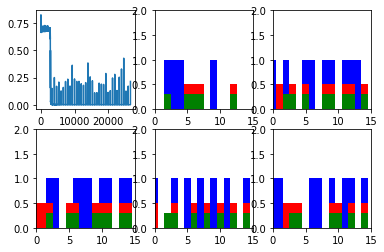

Step 100 Loss 5.62264e-05


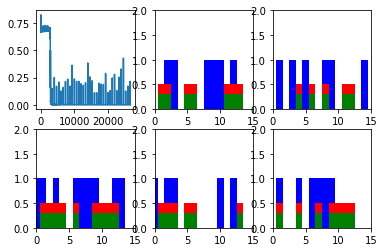

Step 200 Loss 5.03554e-05


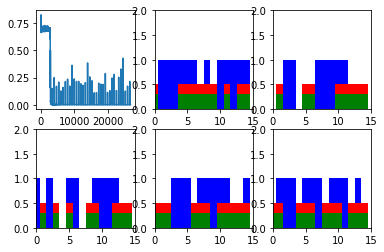

Step 300 Loss 5.55637e-05


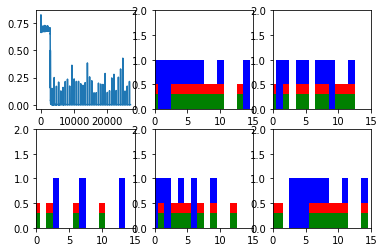

Step 400 Loss 5.07702e-05


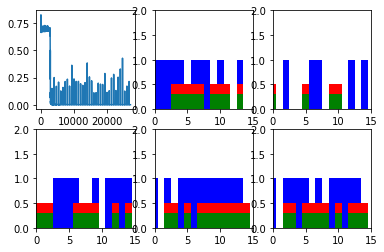

Step 500 Loss 5.11024e-05


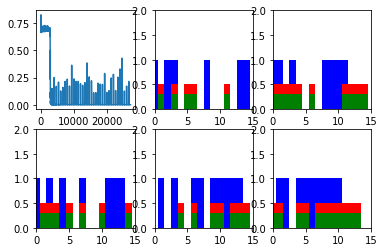

Step 600 Loss 5.73438e-05


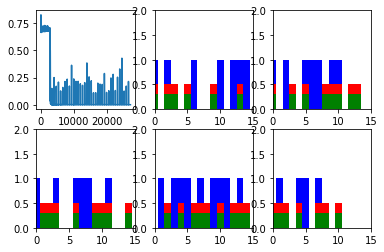

New data, epoch 41
Step 0 Loss 0.198291


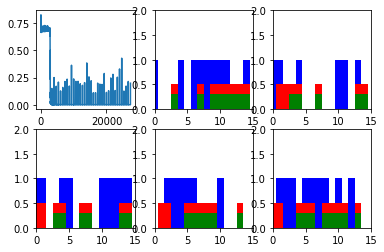

Step 100 Loss 7.03159e-05


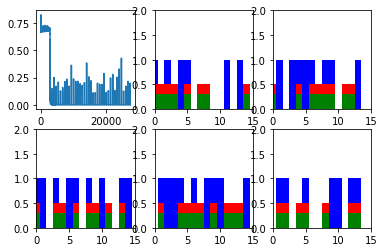

Step 200 Loss 5.58193e-05


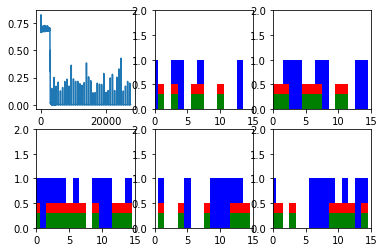

Step 300 Loss 7.20762e-05


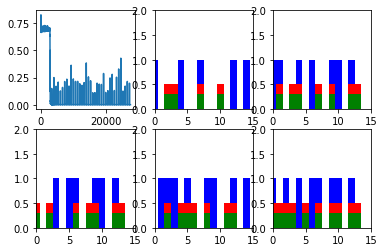

Step 400 Loss 6.73414e-05


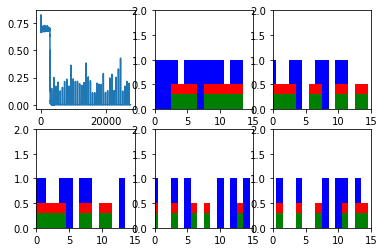

Step 500 Loss 5.74595e-05


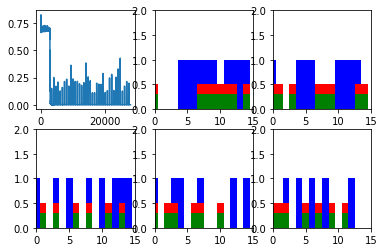

Step 600 Loss 6.90263e-05


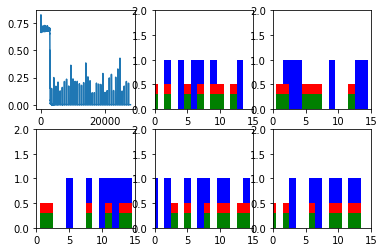

New data, epoch 42
Step 0 Loss 0.262905


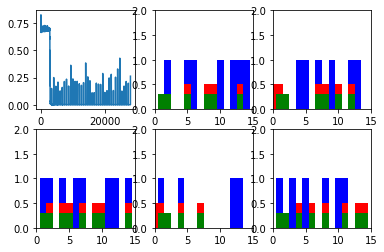

Step 100 Loss 6.11898e-05


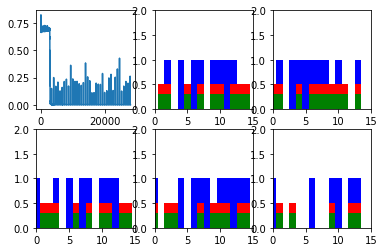

Step 200 Loss 6.15616e-05


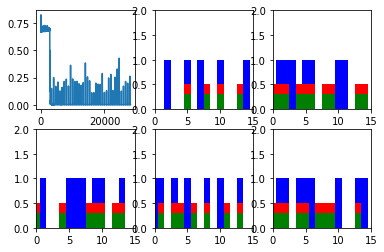

Step 300 Loss 5.59956e-05


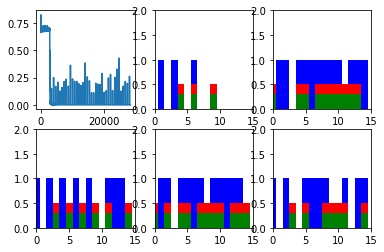

Step 400 Loss 6.09736e-05


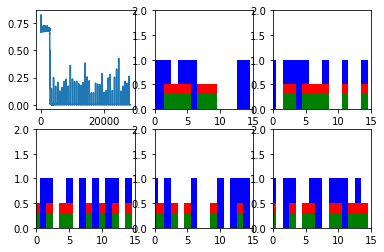

Step 500 Loss 5.20922e-05


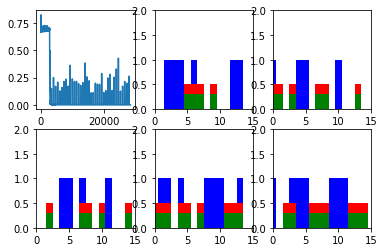

Step 600 Loss 5.83922e-05


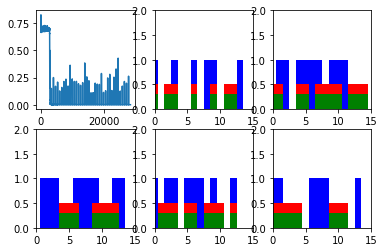

New data, epoch 43
Step 0 Loss 0.206061


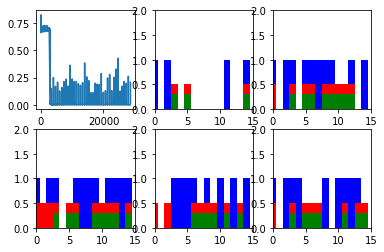

Step 100 Loss 5.73928e-05


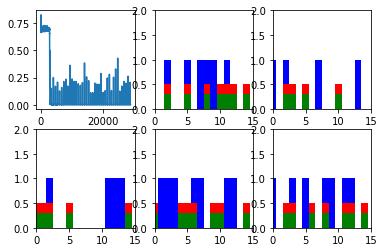

Step 200 Loss 5.50994e-05


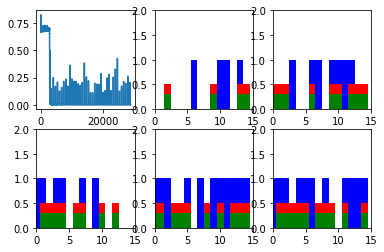

Step 300 Loss 6.05969e-05


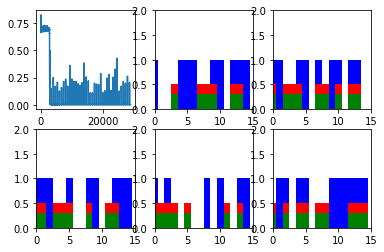

Step 400 Loss 5.05889e-05


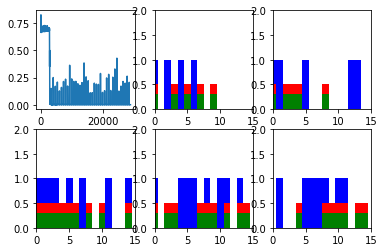

Step 500 Loss 4.90296e-05


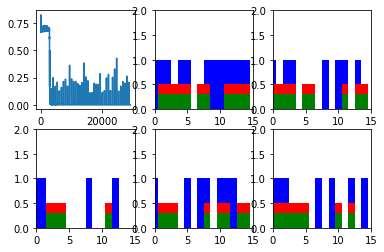

Step 600 Loss 5.97181e-05


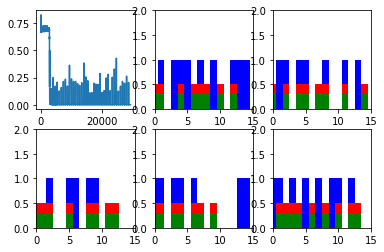

New data, epoch 44
Step 0 Loss 0.129374


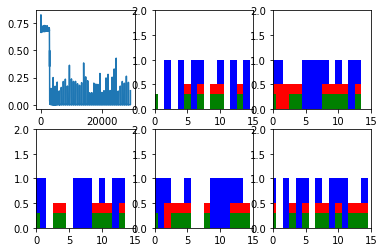

Step 100 Loss 5.49085e-05


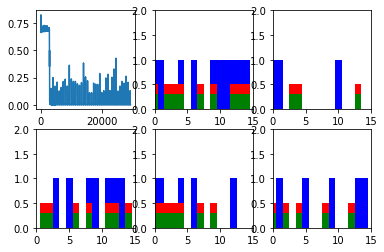

Step 200 Loss 5.5051e-05


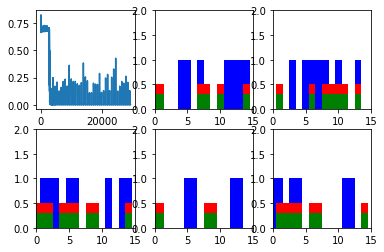

Step 300 Loss 5.36545e-05


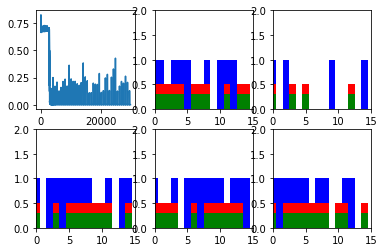

Step 400 Loss 6.55236e-05


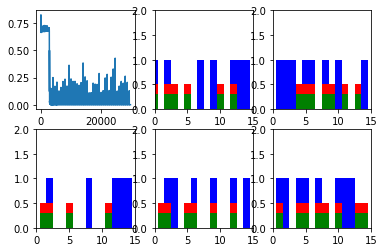

Step 500 Loss 5.10543e-05


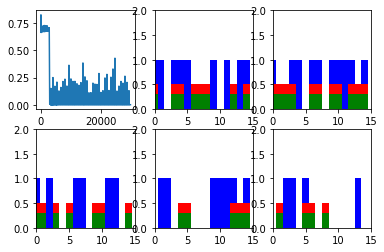

Step 600 Loss 6.21083e-05


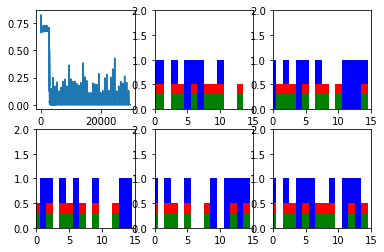

New data, epoch 45
Step 0 Loss 0.109633


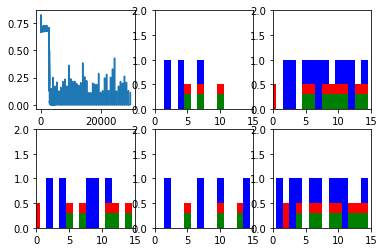

Step 100 Loss 6.6976e-05


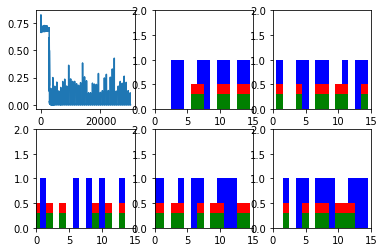

Step 200 Loss 5.27489e-05


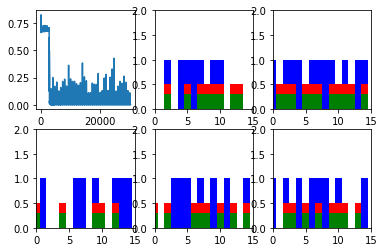

Step 300 Loss 5.36434e-05


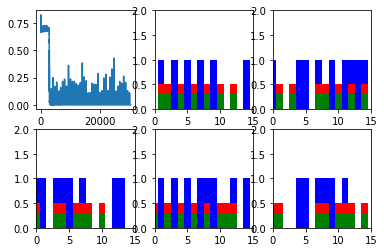

Step 400 Loss 5.59606e-05


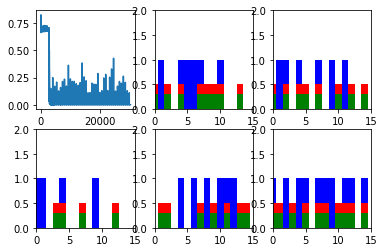

Step 500 Loss 5.08875e-05


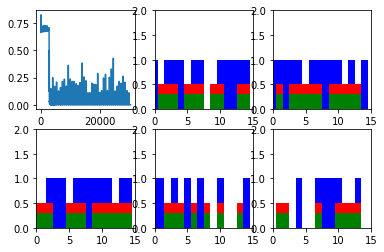

Step 600 Loss 4.95097e-05


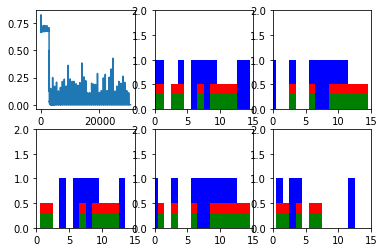

New data, epoch 46
Step 0 Loss 0.0974417


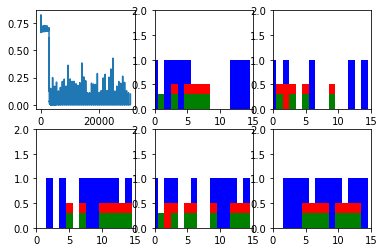

Step 100 Loss 5.06206e-05


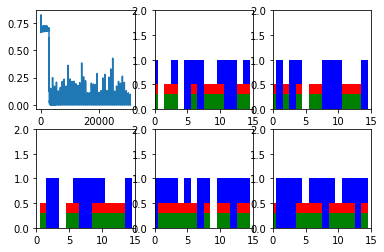

Step 200 Loss 5.24897e-05


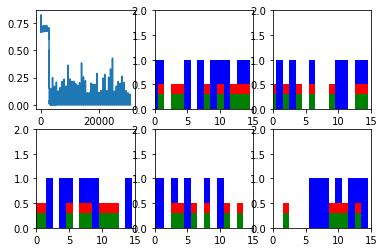

Step 300 Loss 5.67236e-05


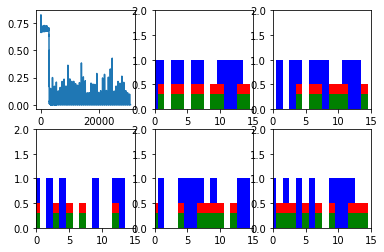

Step 400 Loss 4.91185e-05


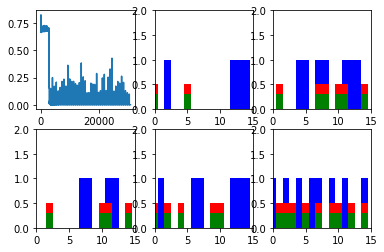

Step 500 Loss 4.69206e-05


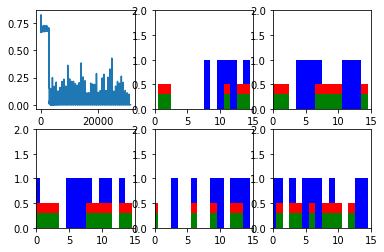

Step 600 Loss 5.12389e-05


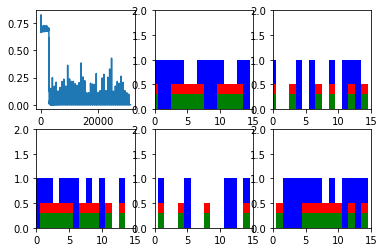

New data, epoch 47
Step 0 Loss 0.329365


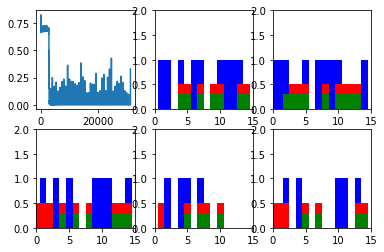

Step 100 Loss 4.98786e-05


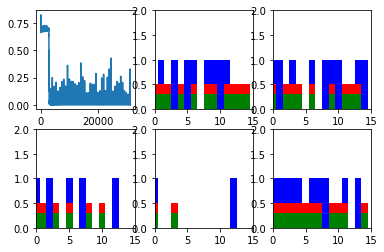

Step 200 Loss 5.6892e-05


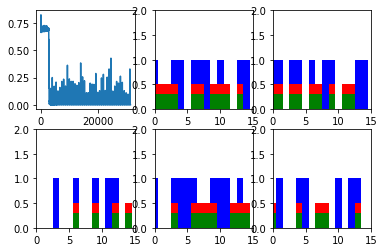

Step 300 Loss 4.74627e-05


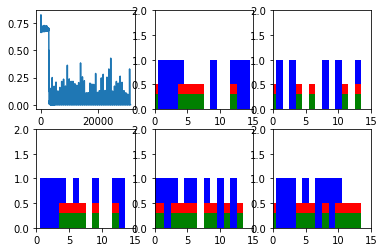

Step 400 Loss 5.0646e-05


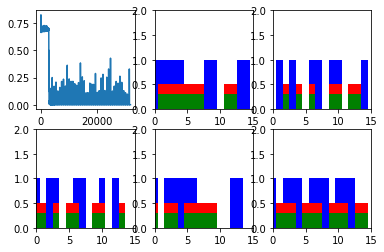

Step 500 Loss 5.94431e-05


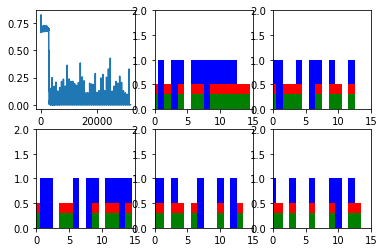

Step 600 Loss 4.78202e-05


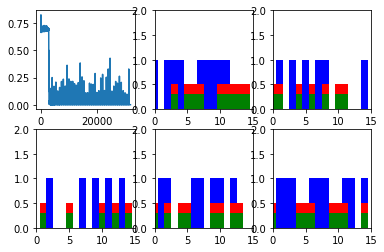

New data, epoch 48
Step 0 Loss 0.175336


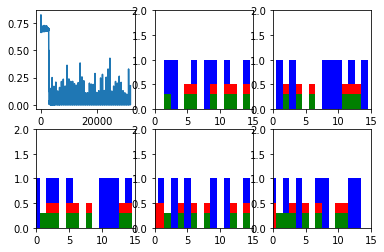

Step 100 Loss 5.21306e-05


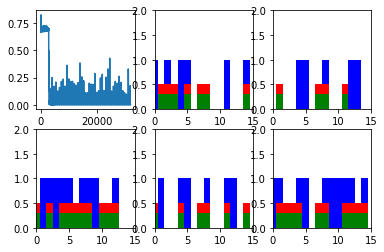

Step 200 Loss 4.80316e-05


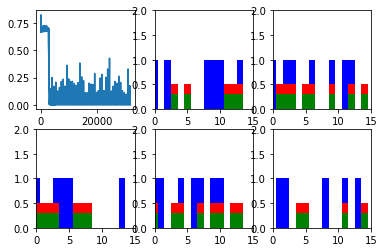

Step 300 Loss 5.00343e-05


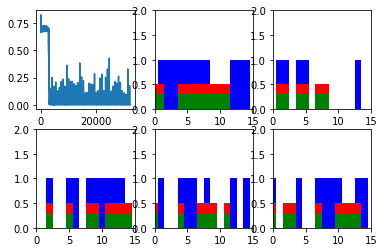

Step 400 Loss 5.19081e-05


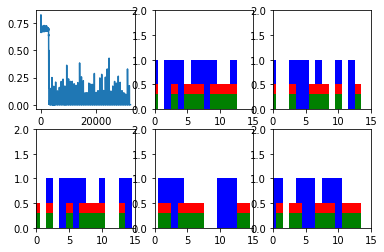

Step 500 Loss 4.92159e-05


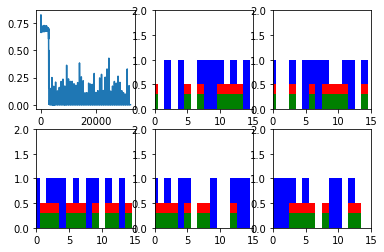

Step 600 Loss 4.9772e-05


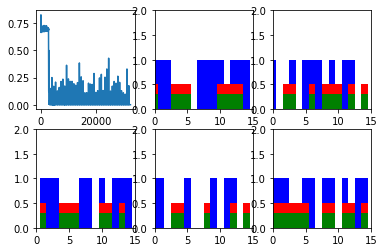

New data, epoch 49
Step 0 Loss 0.16541


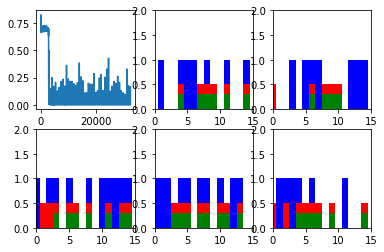

Step 100 Loss 4.80778e-05


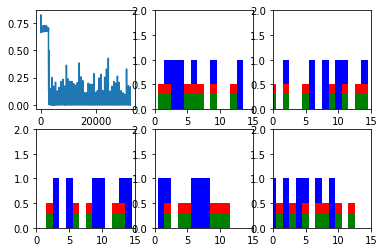

Step 200 Loss 4.64965e-05


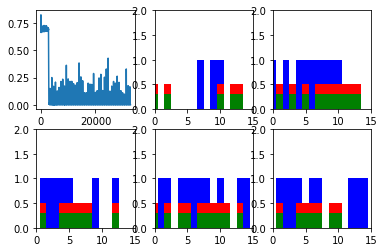

Step 300 Loss 4.6188e-05


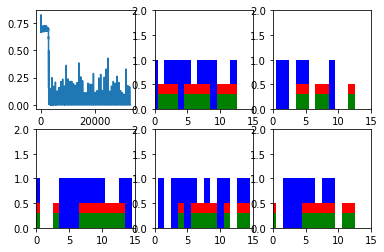

Step 400 Loss 4.46702e-05


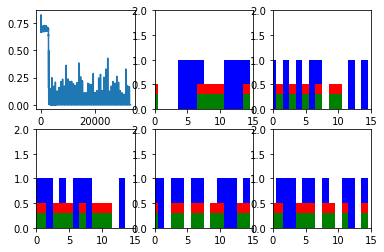

Step 500 Loss 4.49213e-05


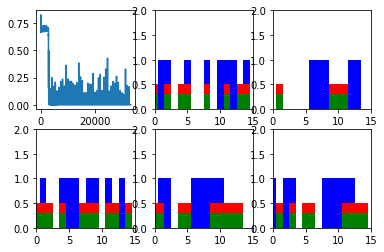

Step 600 Loss 5.13995e-05


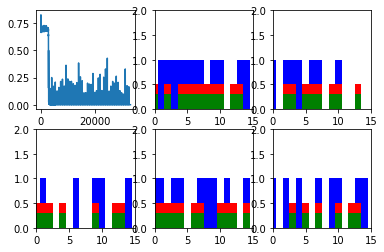

New data, epoch 50
Step 0 Loss 0.0983884


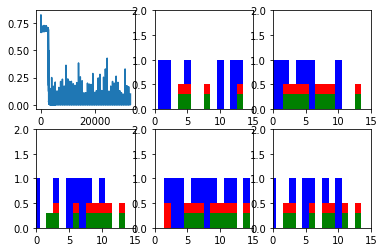

Step 100 Loss 4.4025e-05


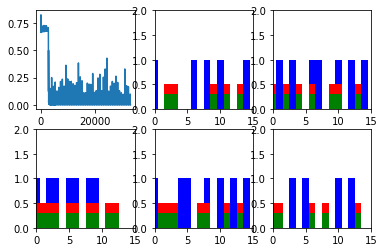

Step 200 Loss 4.49437e-05


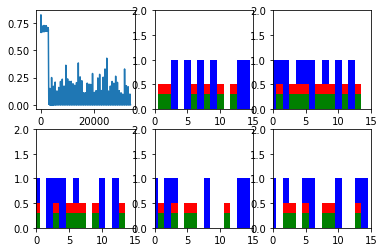

Step 300 Loss 4.29045e-05


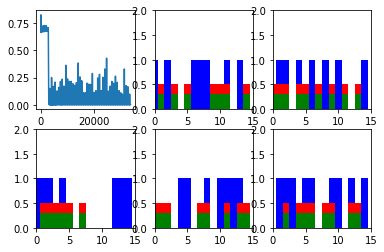

Step 400 Loss 4.4265e-05


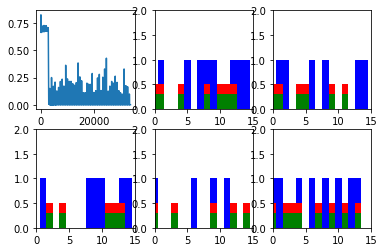

Step 500 Loss 4.18649e-05


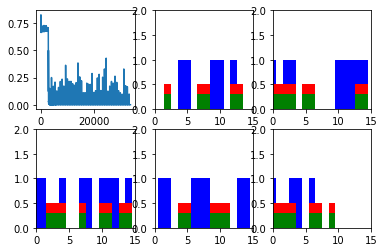

Step 600 Loss 4.12388e-05


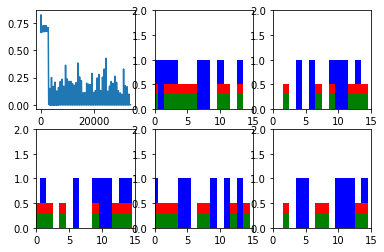

New data, epoch 51
Step 0 Loss 0.273125


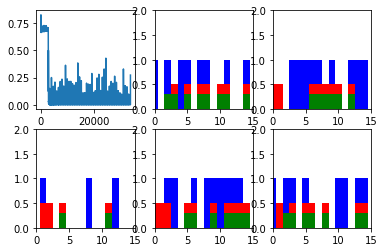

Step 100 Loss 4.65267e-05


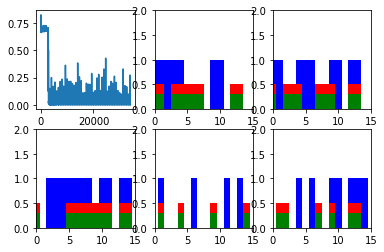

Step 200 Loss 4.1053e-05


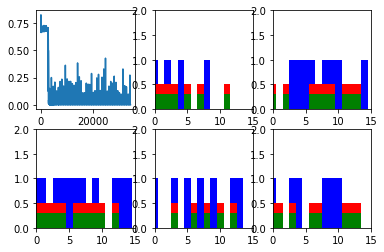

Step 300 Loss 4.54062e-05


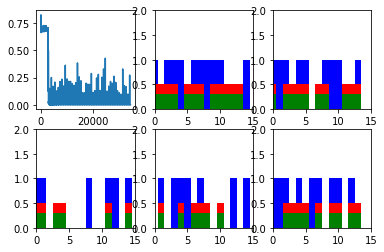

Step 400 Loss 4.76806e-05


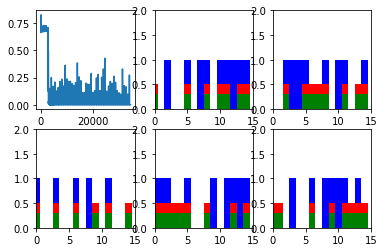

Step 500 Loss 4.40394e-05


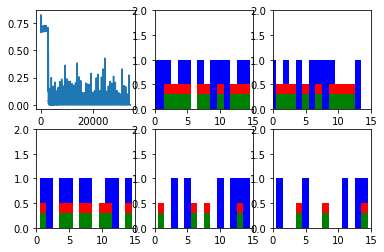

Step 600 Loss 4.07604e-05


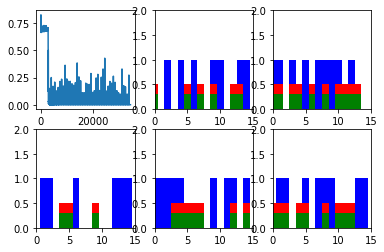

New data, epoch 52
Step 0 Loss 0.157544


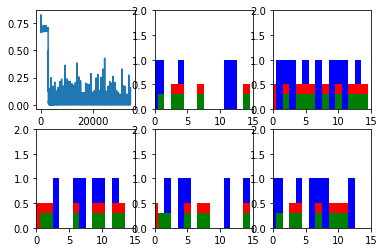

Step 100 Loss 4.75025e-05


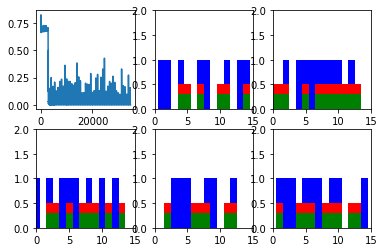

Step 200 Loss 4.61801e-05


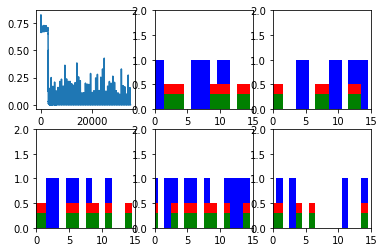

Step 300 Loss 4.32828e-05


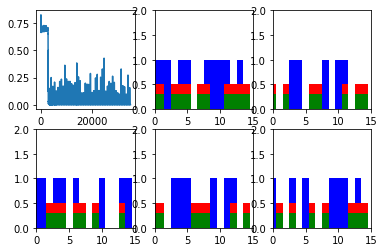

Step 400 Loss 4.74309e-05


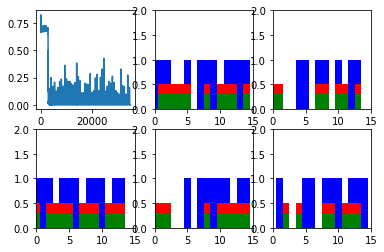

Step 500 Loss 3.93969e-05


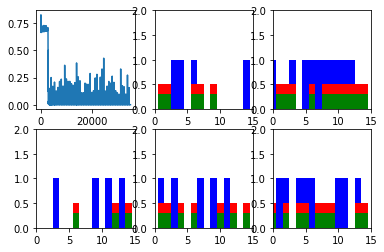

Step 600 Loss 4.51582e-05


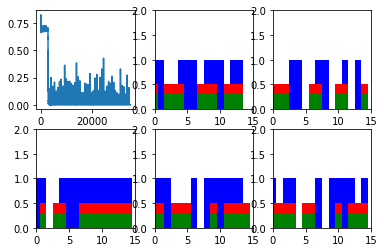

New data, epoch 53
Step 0 Loss 0.157676


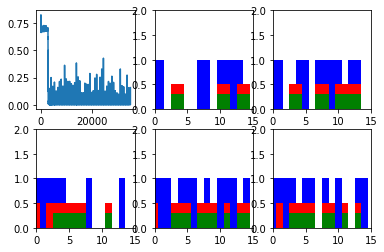

Step 100 Loss 4.28282e-05


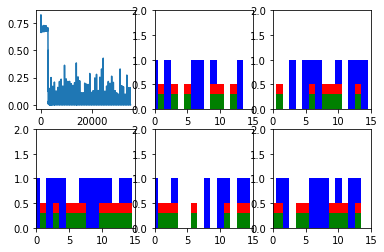

Step 200 Loss 4.47513e-05


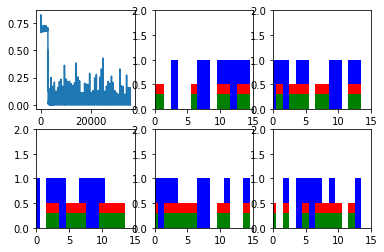

Step 300 Loss 3.84288e-05


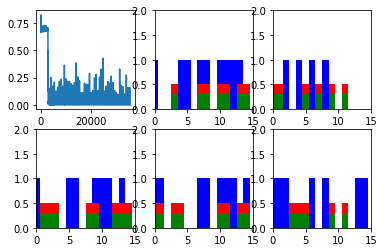

Step 400 Loss 4.50167e-05


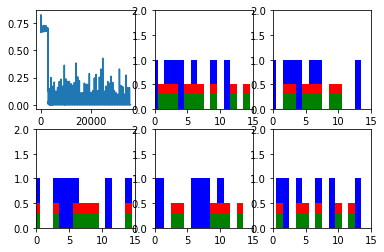

Step 500 Loss 3.80283e-05


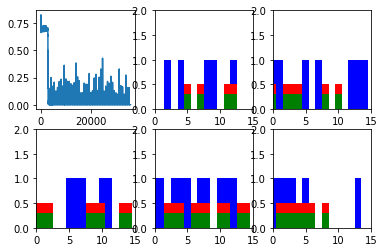

Step 600 Loss 3.95128e-05


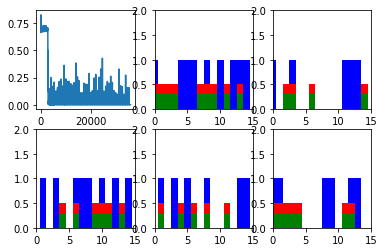

New data, epoch 54
Step 0 Loss 0.147658


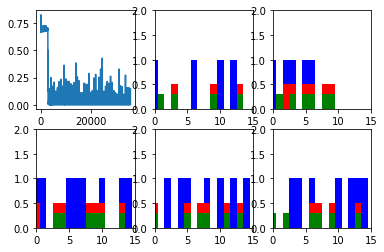

Step 100 Loss 4.57908e-05


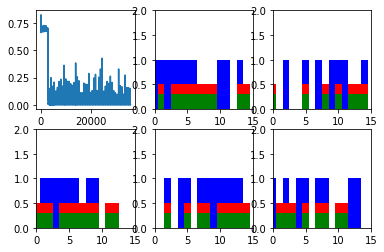

Step 200 Loss 4.72466e-05


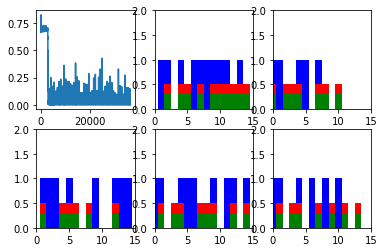

Step 300 Loss 4.46973e-05


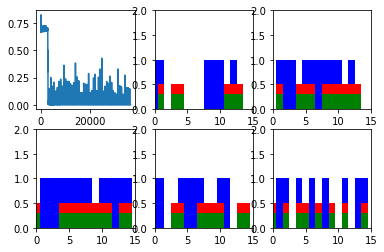

Step 400 Loss 5.02203e-05


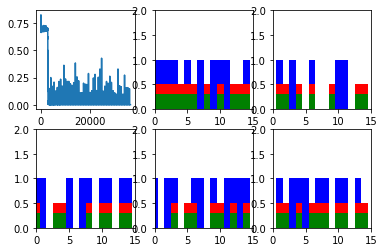

Step 500 Loss 4.16345e-05


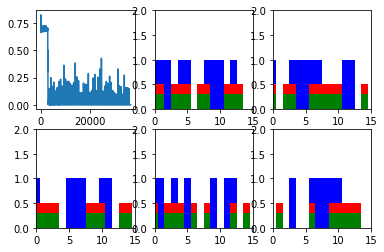

Step 600 Loss 4.07955e-05


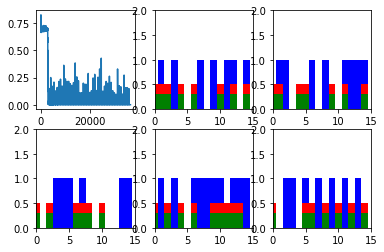

New data, epoch 55
Step 0 Loss 0.152835


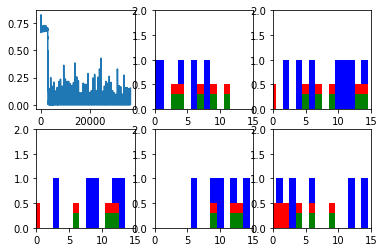

Step 100 Loss 4.30666e-05


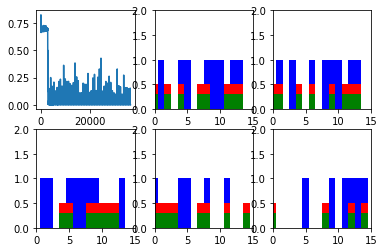

Step 200 Loss 3.4608e-05


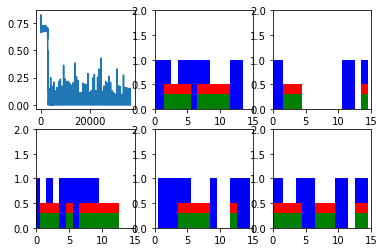

Step 300 Loss 4.06969e-05


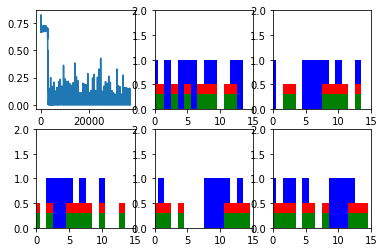

Step 400 Loss 3.73687e-05


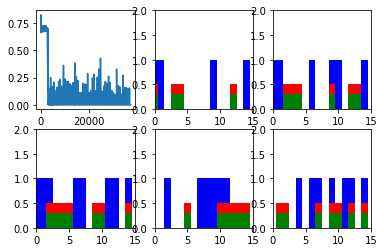

Step 500 Loss 4.33257e-05


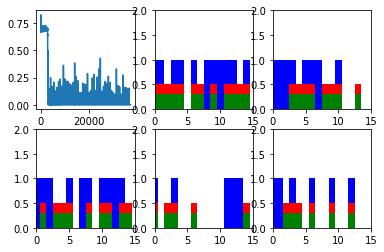

Step 600 Loss 3.91791e-05


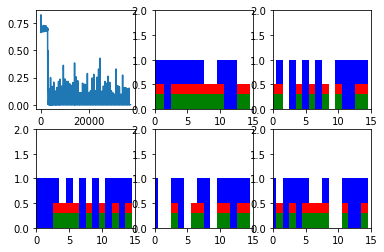

New data, epoch 56
Step 0 Loss 0.179615


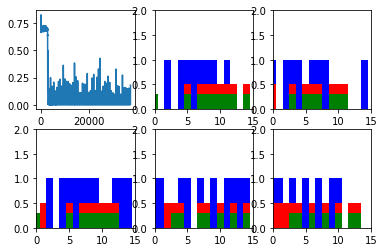

Step 100 Loss 4.00752e-05


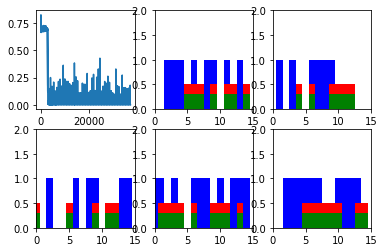

Step 200 Loss 5.18345e-05


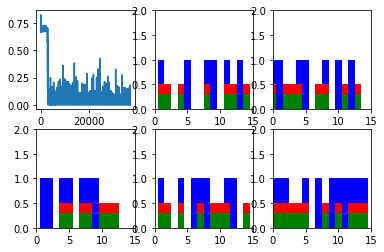

Step 300 Loss 3.97319e-05


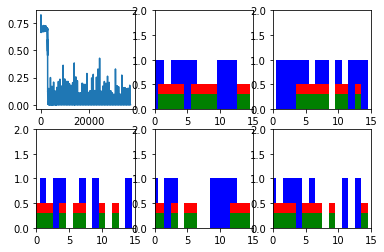

Step 400 Loss 4.10207e-05


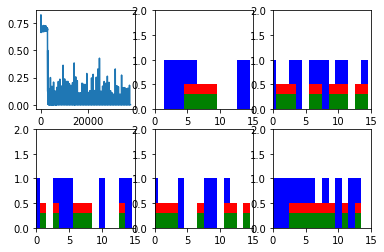

Step 500 Loss 5.04312e-05


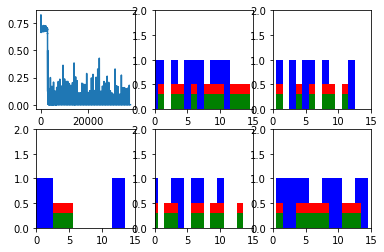

Step 600 Loss 4.51626e-05


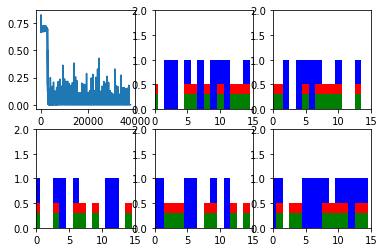

New data, epoch 57
Step 0 Loss 0.297635


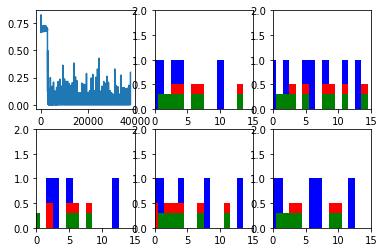

Step 100 Loss 4.28027e-05


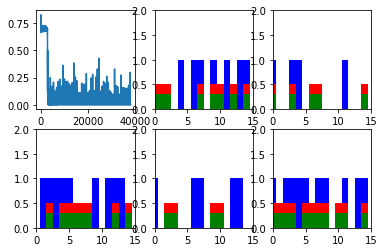

Step 200 Loss 4.37326e-05


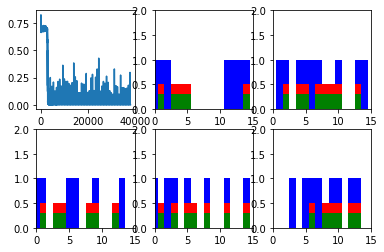

Step 300 Loss 4.73658e-05


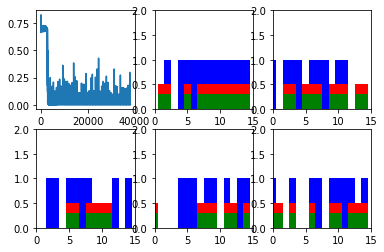

Step 400 Loss 4.30665e-05


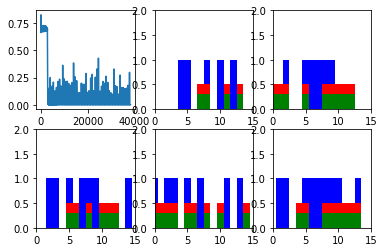

Step 500 Loss 4.5174e-05


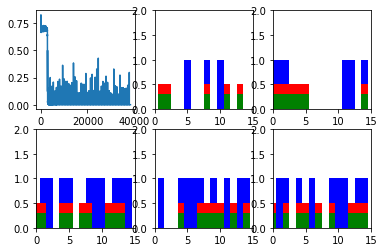

Step 600 Loss 4.29632e-05


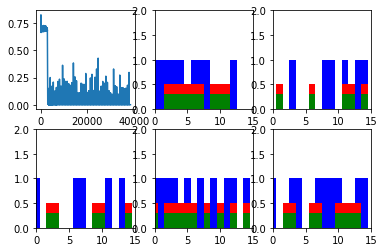

New data, epoch 58
Step 0 Loss 0.0623497


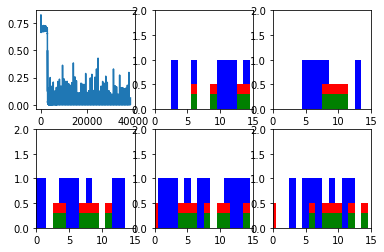

Step 100 Loss 4.72972e-05


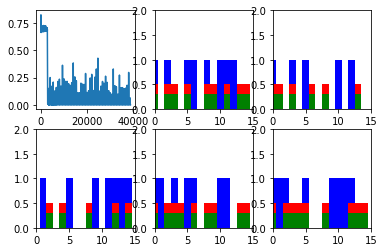

Step 200 Loss 4.34257e-05


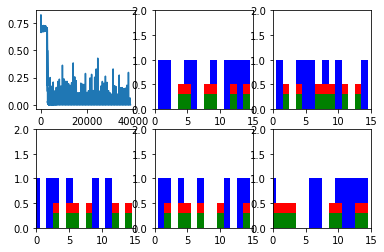

Step 300 Loss 3.45173e-05


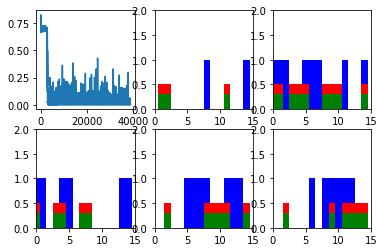

Step 400 Loss 3.97433e-05


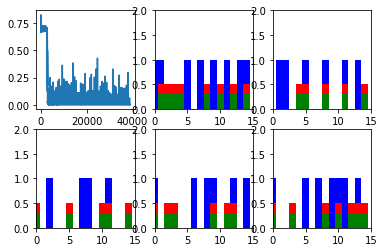

Step 500 Loss 4.88693e-05


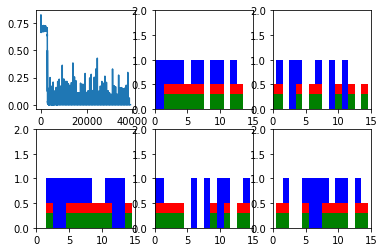

Step 600 Loss 3.97019e-05


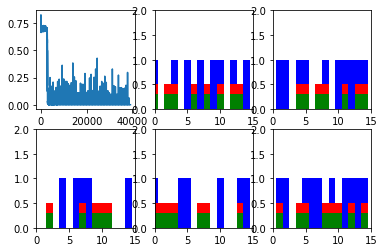

New data, epoch 59
Step 0 Loss 0.167232


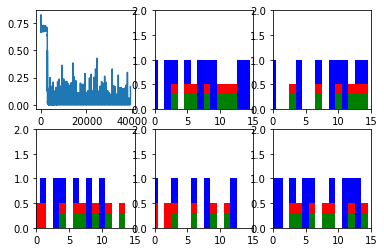

Step 100 Loss 4.21447e-05


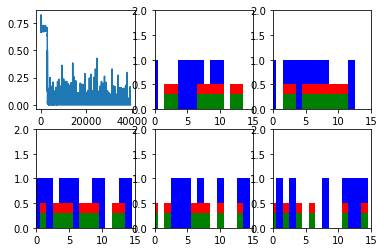

Step 200 Loss 4.17792e-05


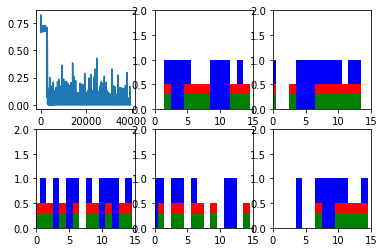

Step 300 Loss 4.43254e-05


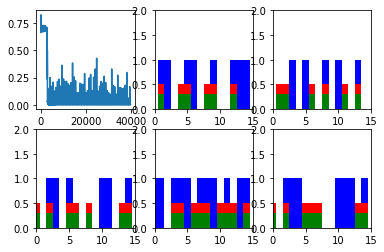

Step 400 Loss 4.21702e-05


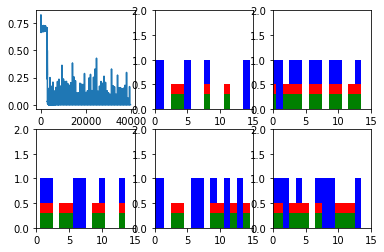

Step 500 Loss 3.74465e-05


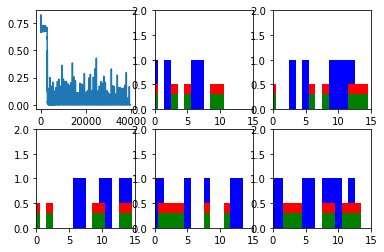

Step 600 Loss 3.93205e-05


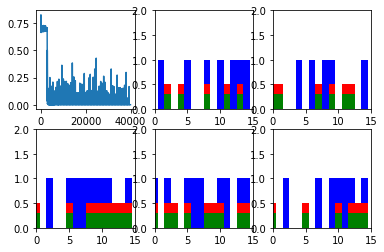

New data, epoch 60
Step 0 Loss 0.262192


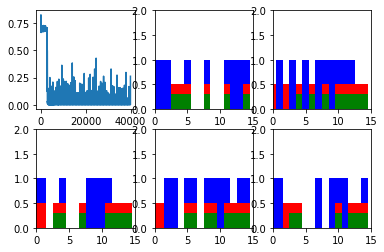

Step 100 Loss 4.2906e-05


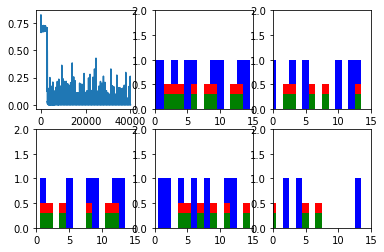

Step 200 Loss 3.73019e-05


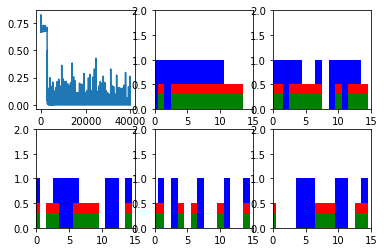

Step 300 Loss 3.53963e-05


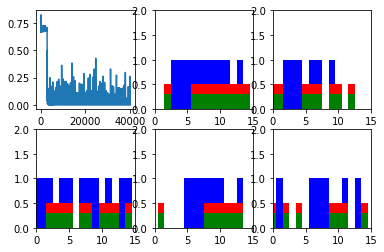

Step 400 Loss 3.91138e-05


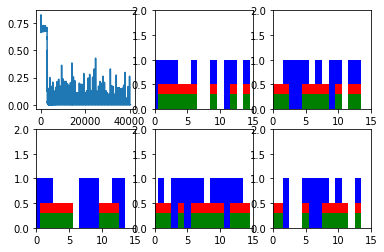

Step 500 Loss 3.93061e-05


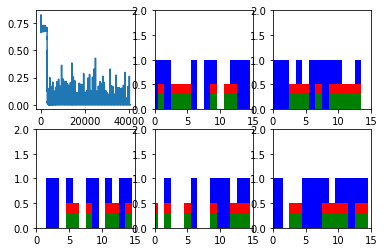

Step 600 Loss 3.861e-05


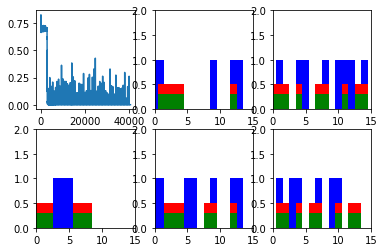

New data, epoch 61
Step 0 Loss 0.162671


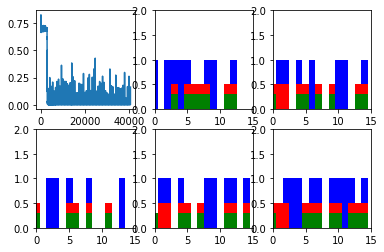

Step 100 Loss 4.02852e-05


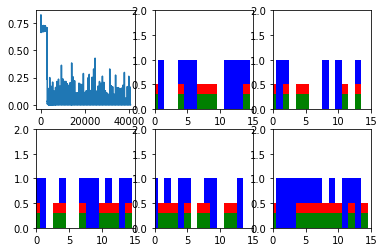

Step 200 Loss 3.40247e-05


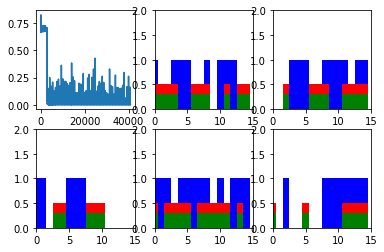

Step 300 Loss 4.28329e-05


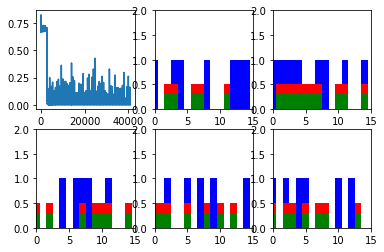

Step 400 Loss 3.88818e-05


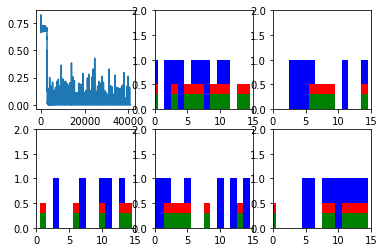

Step 500 Loss 4.14168e-05


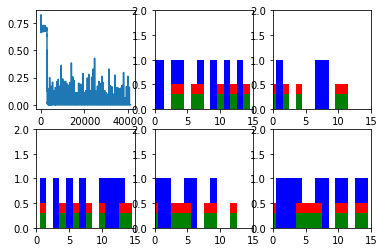

Step 600 Loss 4.18396e-05


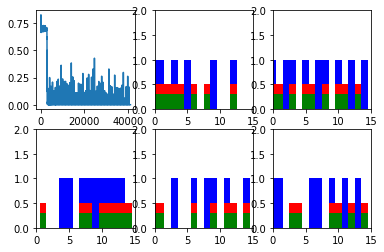

New data, epoch 62
Step 0 Loss 0.274888


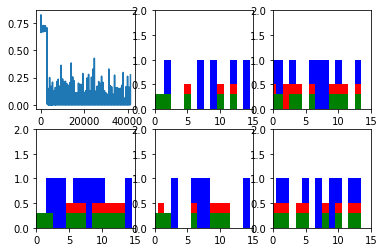

Step 100 Loss 3.74912e-05


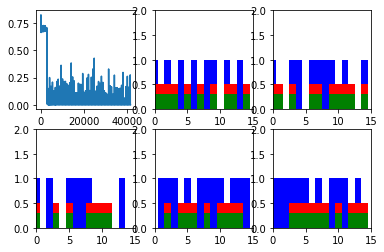

Step 200 Loss 4.00722e-05


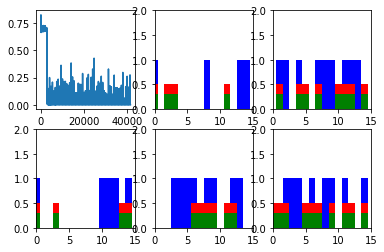

Step 300 Loss 3.71812e-05


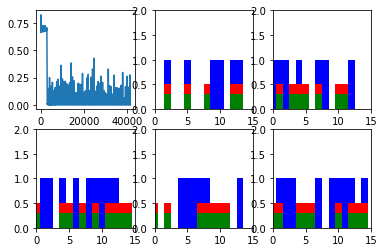

Step 400 Loss 3.56855e-05


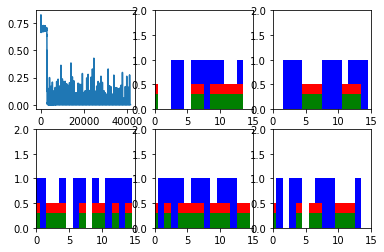

Step 500 Loss 3.99086e-05


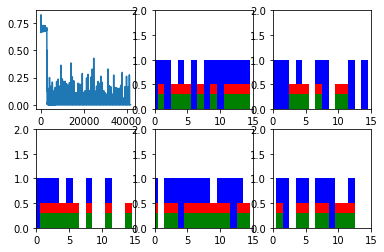

Step 600 Loss 3.89168e-05


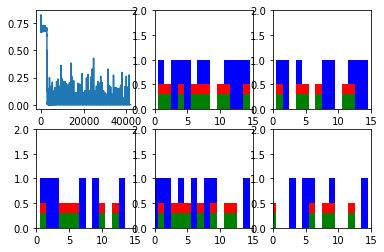

New data, epoch 63
Step 0 Loss 0.174333


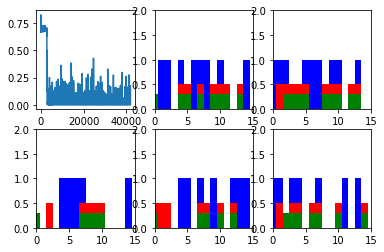

Step 100 Loss 3.86386e-05


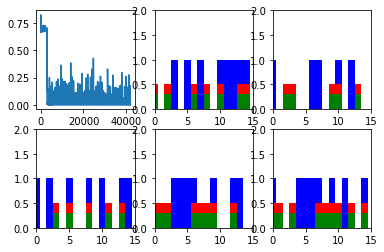

Step 200 Loss 3.84479e-05


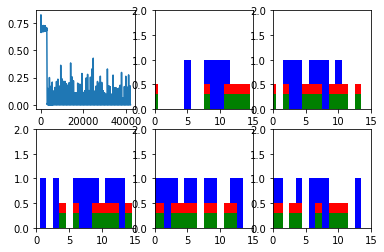

Step 300 Loss 3.49146e-05


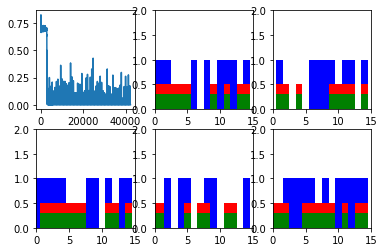

Step 400 Loss 3.86927e-05


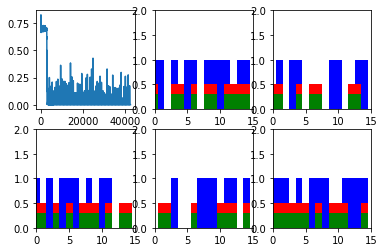

Step 500 Loss 3.85496e-05


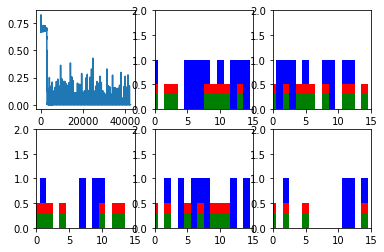

Step 600 Loss 3.68395e-05


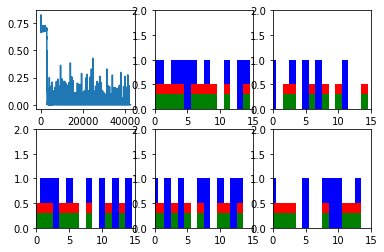

New data, epoch 64
Step 0 Loss 0.159229


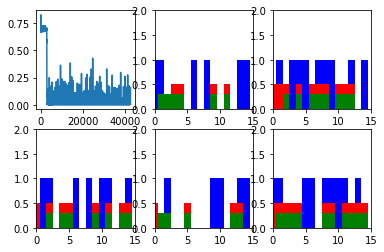

Step 100 Loss 3.7391e-05


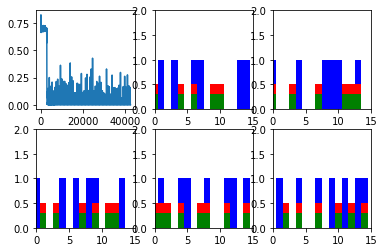

Step 200 Loss 3.68236e-05


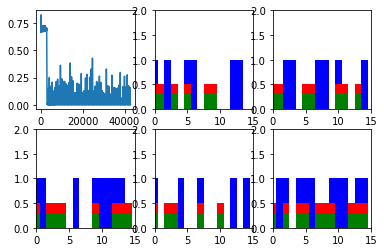

Step 300 Loss 3.48242e-05


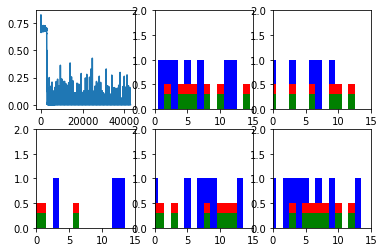

Step 400 Loss 3.55807e-05


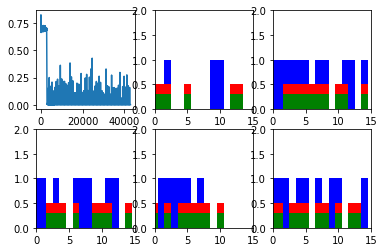

Step 500 Loss 3.22573e-05


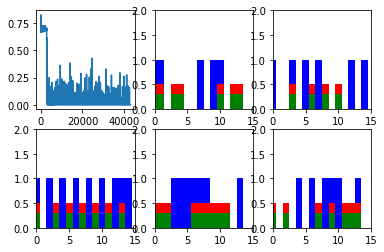

Step 600 Loss 3.53788e-05


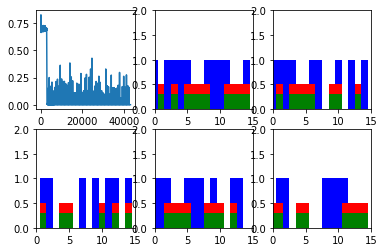

New data, epoch 65
Step 0 Loss 0.153294


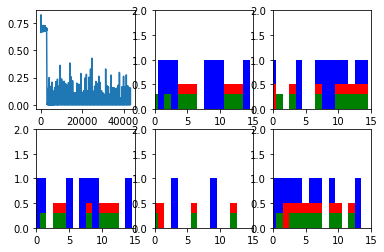

Step 100 Loss 3.76484e-05


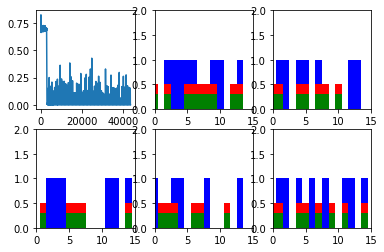

Step 200 Loss 3.7898e-05


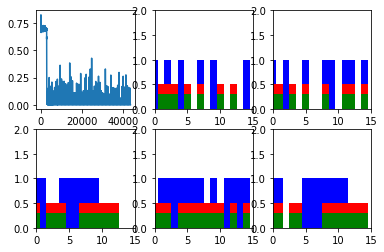

Step 300 Loss 3.587e-05


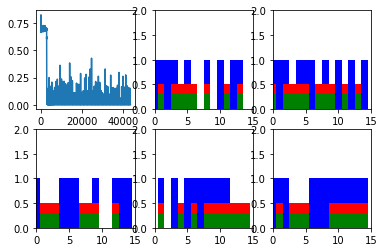

Step 400 Loss 3.7979e-05


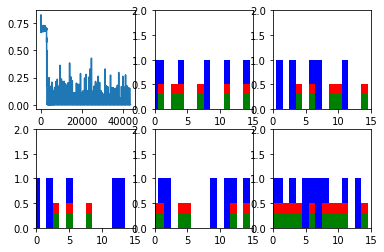

Step 500 Loss 3.69603e-05


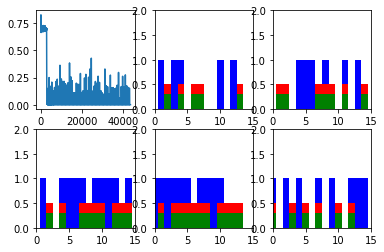

Step 600 Loss 3.95525e-05


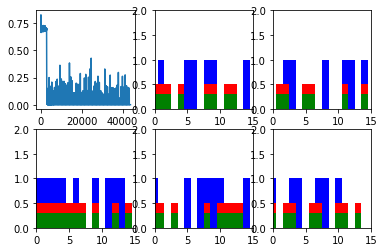

New data, epoch 66
Step 0 Loss 0.277687


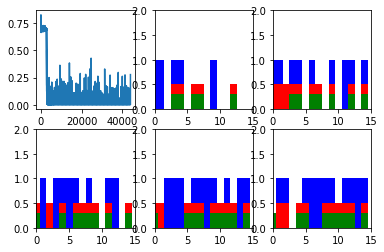

Step 100 Loss 3.76196e-05


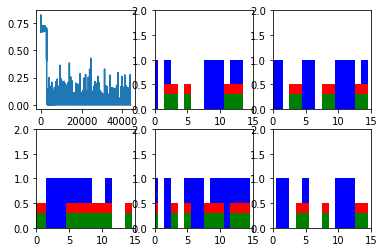

Step 200 Loss 3.93124e-05


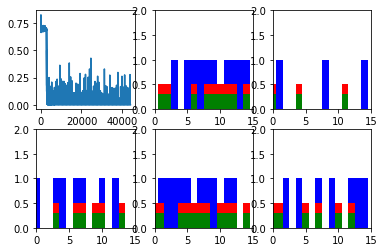

Step 300 Loss 3.60638e-05


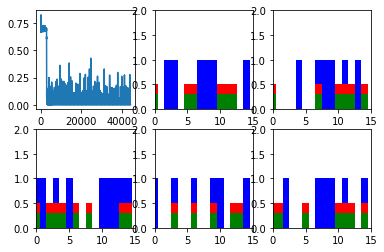

Step 400 Loss 3.42742e-05


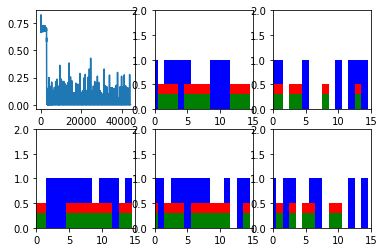

Step 500 Loss 3.98417e-05


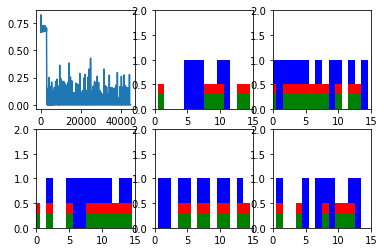

Step 600 Loss 3.81347e-05


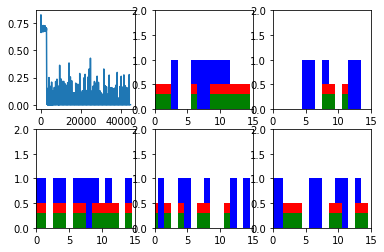

New data, epoch 67
Step 0 Loss 0.212033


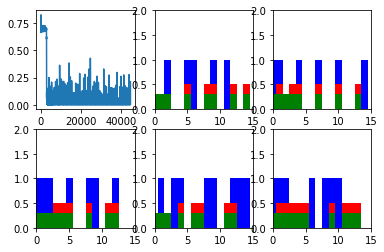

Step 100 Loss 3.4306e-05


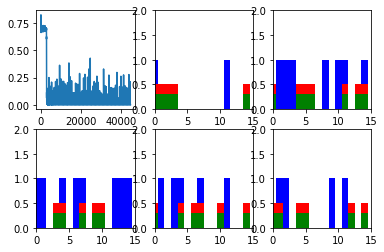

Step 200 Loss 3.74132e-05


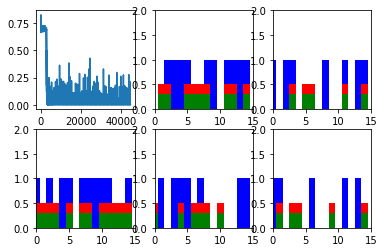

Step 300 Loss 4.08462e-05


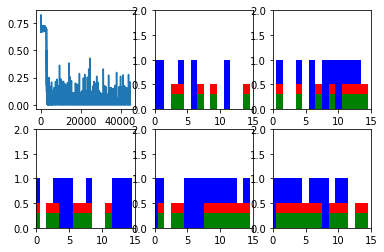

Step 400 Loss 3.83207e-05


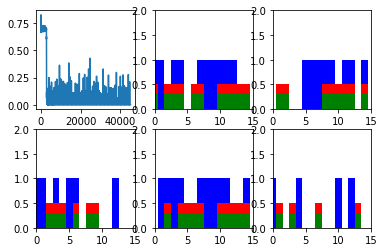

Step 500 Loss 4.00007e-05


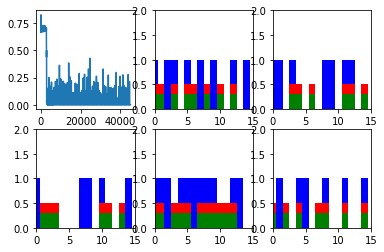

Step 600 Loss 3.95604e-05


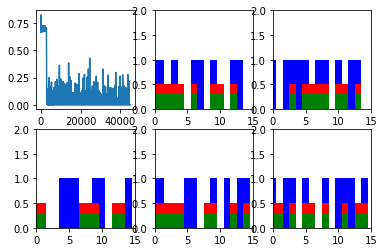

New data, epoch 68
Step 0 Loss 0.147029


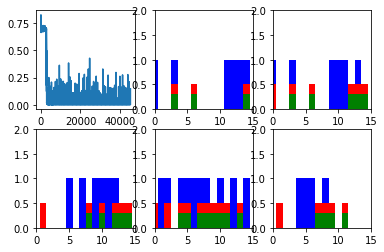

Step 100 Loss 3.59256e-05


KeyboardInterrupt: 

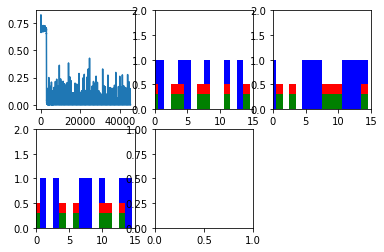

In [47]:
num_epochs = 100
total_series_length = 50000
truncated_backprop_length = 15
state_size = 4
num_classes = 2
echo_step = 3
batch_size = 5
num_batches = total_series_length//batch_size//truncated_backprop_length

def generateData():
    x = np.array(np.random.choice(2, total_series_length, p=[0.5, 0.5]))
    y = np.roll(x, echo_step)
    y[0:echo_step] = 0

    x = x.reshape((batch_size, -1))  # The first index changing slowest, subseries as rows
    y = y.reshape((batch_size, -1))

    return (x, y)

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.int32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
current_state = init_state
states_series = []
for current_input in inputs_series:
    current_input = tf.reshape(current_input, [batch_size, 1])
    input_and_state_concatenated = tf.concat([current_input, current_state], 1)  # Increasing number of columns

    next_state = tf.tanh(tf.matmul(input_and_state_concatenated, W) + b)  # Broadcasted addition
    states_series.append(next_state)
    current_state = next_state

logits_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits, labels=labels) for logits, labels in zip(logits_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdagradOptimizer(0.3).minimize(total_loss)

def plot(loss_list, predictions_series, batchX, batchY):
    plt.subplot(2, 3, 1)
    plt.cla()
    plt.plot(loss_list)

    for batch_series_idx in range(5):
        one_hot_output_series = np.array(predictions_series)[:, batch_series_idx, :]
        single_output_series = np.array([(1 if out[0] < 0.5 else 0) for out in one_hot_output_series])

        plt.subplot(2, 3, batch_series_idx + 2)
        plt.cla()
        plt.axis([0, truncated_backprop_length, 0, 2])
        left_offset = range(truncated_backprop_length)
        plt.bar(left_offset, batchX[batch_series_idx, :], width=1, color="blue")
        plt.bar(left_offset, batchY[batch_series_idx, :] * 0.5, width=1, color="red")
        plt.bar(left_offset, single_output_series * 0.3, width=1, color="green")

    plt.draw()
    plt.pause(0.0001)


with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData()
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx)

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x[:,start_idx:end_idx]
            batchY = y[:,start_idx:end_idx]

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if batch_idx%100 == 0:
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)

plt.ioff()
plt.show()


### Just positive VS negative change

/usr/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':
/usr/lib/python3.6/site-packages/pandas/core/frame.py:2554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._where(-key, value, inplace=True)
/usr/lib/python3.6/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
 

New data, epoch 0
Step 0 Loss 0.688651


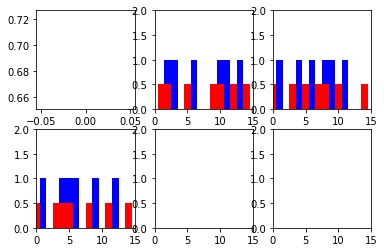

New data, epoch 1
Step 0 Loss 0.703553


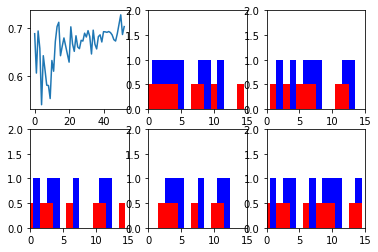

New data, epoch 2
Step 0 Loss 0.682272


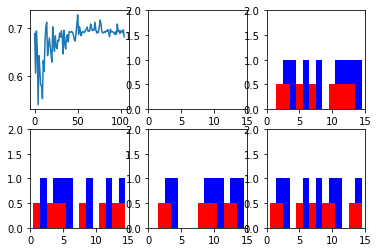

New data, epoch 3
Step 0 Loss 0.647137


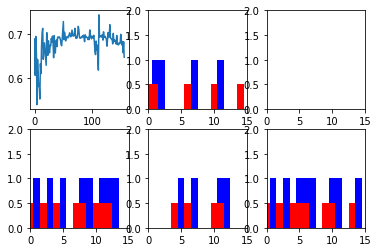

New data, epoch 4
Step 0 Loss 0.681994


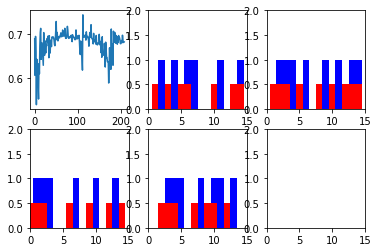

New data, epoch 5
Step 0 Loss 0.666775


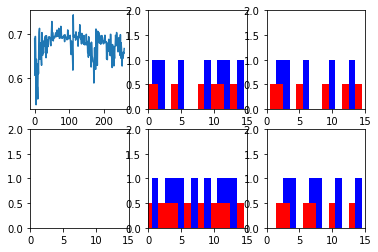

New data, epoch 6
Step 0 Loss 0.662122


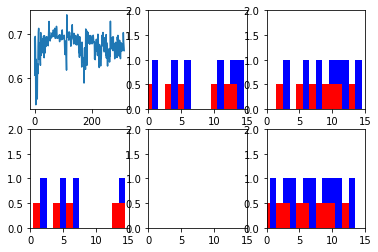

New data, epoch 7
Step 0 Loss 0.700937


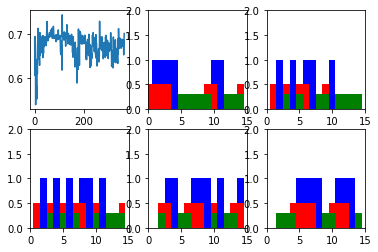

New data, epoch 8
Step 0 Loss 0.678576


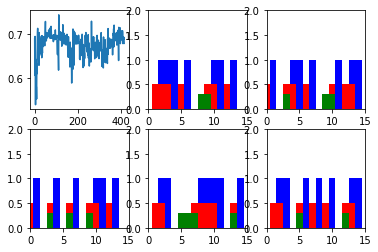

New data, epoch 9
Step 0 Loss 0.692793


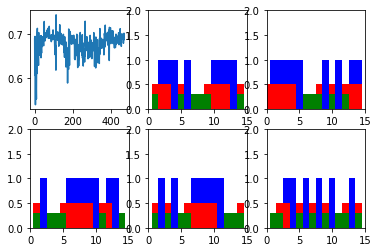

New data, epoch 10
Step 0 Loss 0.763882


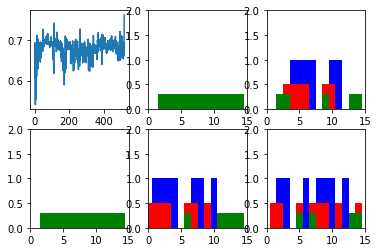

New data, epoch 11
Step 0 Loss 0.686622


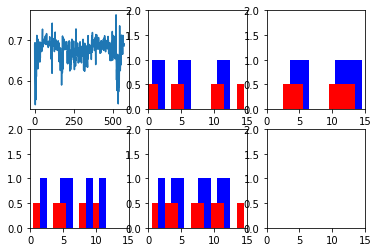

New data, epoch 12
Step 0 Loss 0.69399


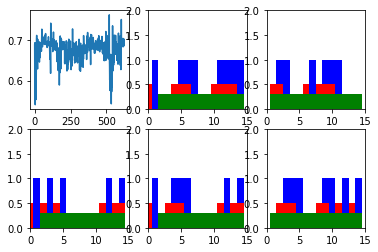

New data, epoch 13
Step 0 Loss 0.676118


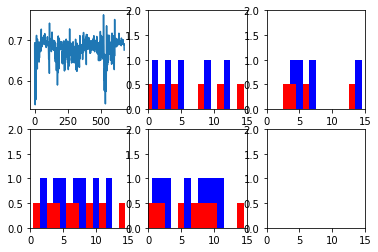

New data, epoch 14
Step 0 Loss 0.660869


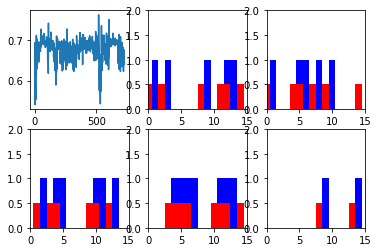

New data, epoch 15
Step 0 Loss 0.682332


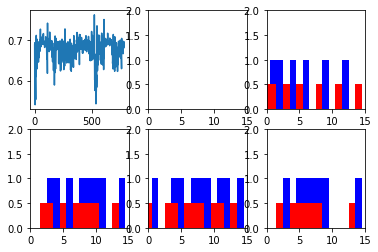

New data, epoch 16
Step 0 Loss 0.692244


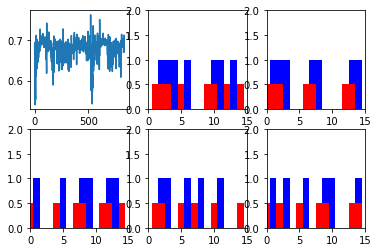

New data, epoch 17
Step 0 Loss 0.690432


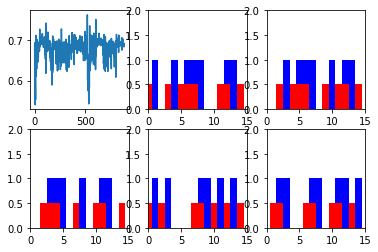

New data, epoch 18
Step 0 Loss 0.71652


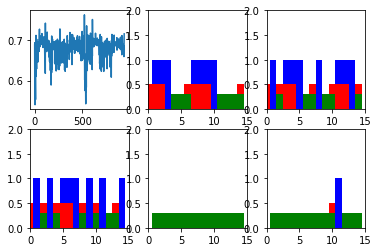

New data, epoch 19
Step 0 Loss 0.768196


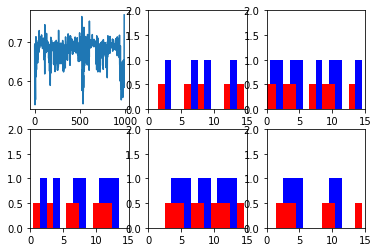

New data, epoch 20
Step 0 Loss 0.659284


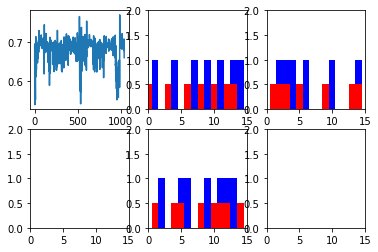

New data, epoch 21
Step 0 Loss 0.653266


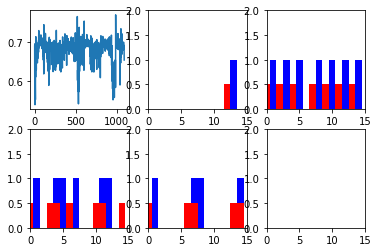

New data, epoch 22
Step 0 Loss 0.685036


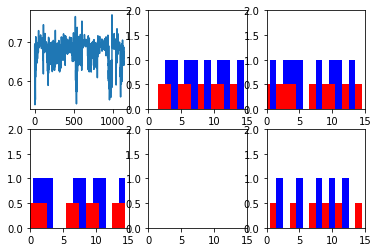

New data, epoch 23
Step 0 Loss 0.692917


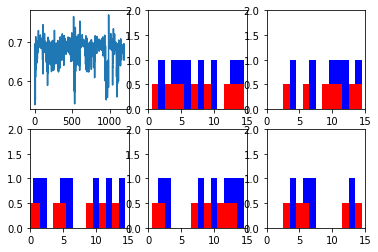

New data, epoch 24
Step 0 Loss 0.720361


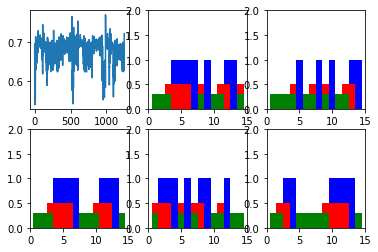

New data, epoch 25
Step 0 Loss 0.689174


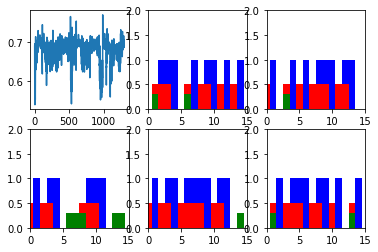

New data, epoch 26
Step 0 Loss 0.713192


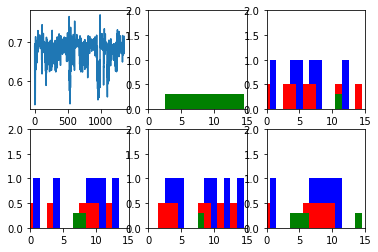

New data, epoch 27
Step 0 Loss 0.681037


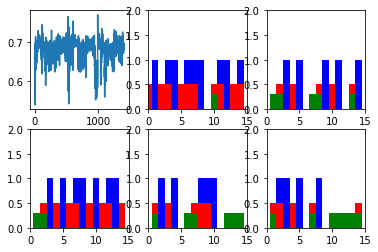

New data, epoch 28
Step 0 Loss 0.668937


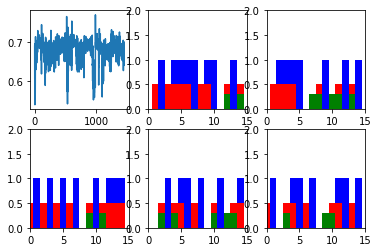

New data, epoch 29
Step 0 Loss 0.750305


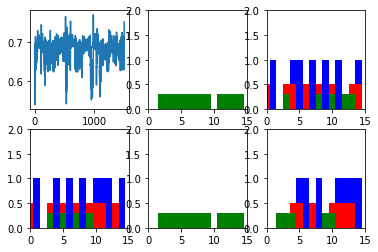

New data, epoch 30
Step 0 Loss 0.689371


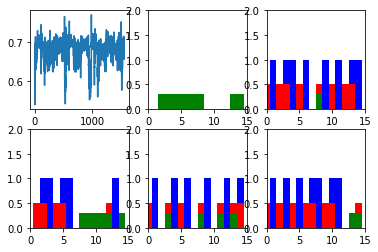

New data, epoch 31
Step 0 Loss 0.710388


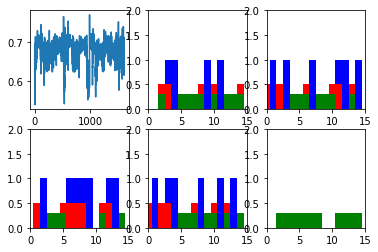

New data, epoch 32
Step 0 Loss 0.65209


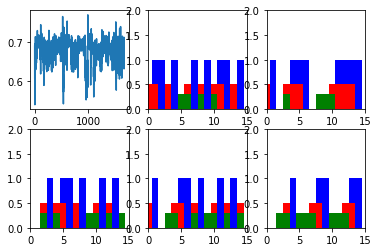

New data, epoch 33
Step 0 Loss 0.707098


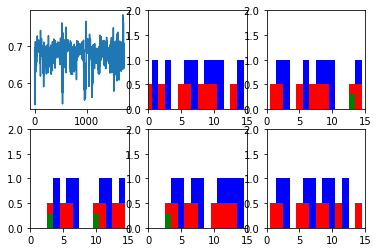

New data, epoch 34
Step 0 Loss 0.708937


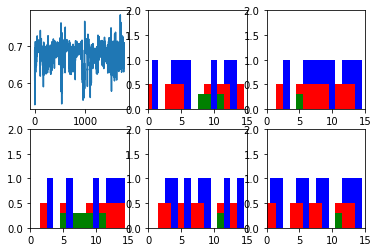

New data, epoch 35
Step 0 Loss 0.684338


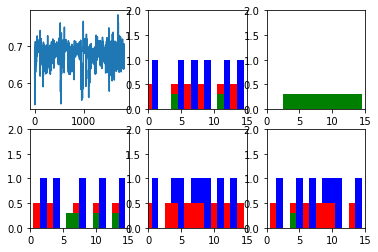

New data, epoch 36
Step 0 Loss 0.675641


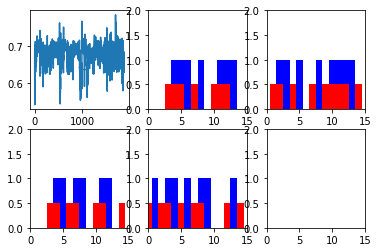

New data, epoch 37
Step 0 Loss 0.699673


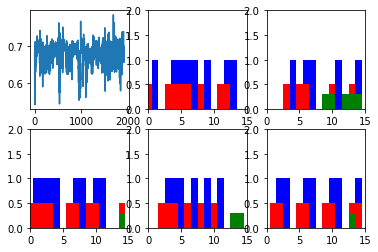

New data, epoch 38
Step 0 Loss 0.712538


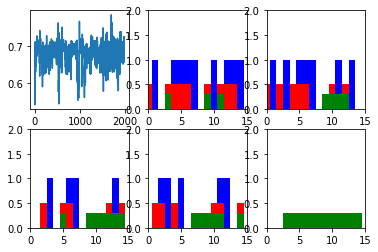

New data, epoch 39
Step 0 Loss 0.737899


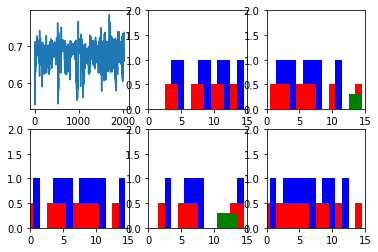

New data, epoch 40
Step 0 Loss 0.692259


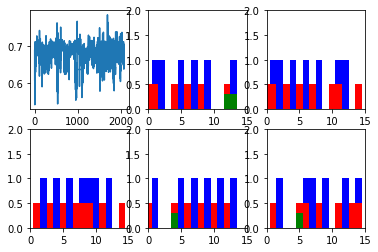

New data, epoch 41
Step 0 Loss 0.67525


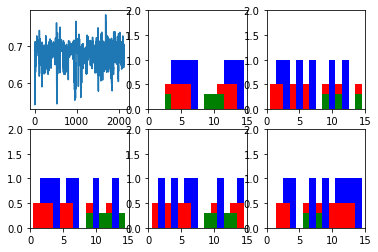

New data, epoch 42
Step 0 Loss 0.737057


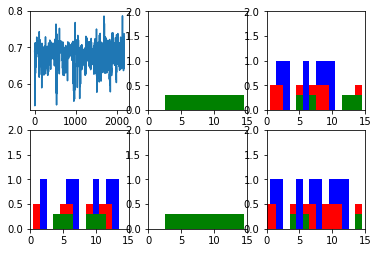

New data, epoch 43
Step 0 Loss 0.627574


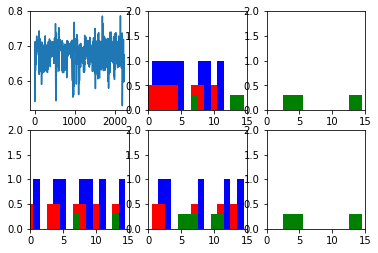

New data, epoch 44
Step 0 Loss 0.693871


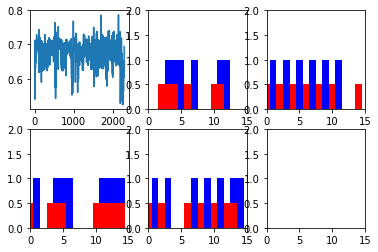

New data, epoch 45
Step 0 Loss 0.753191


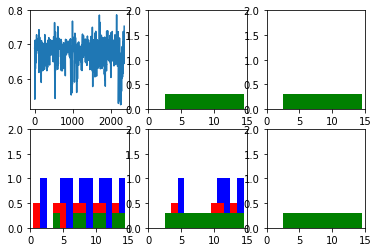

New data, epoch 46
Step 0 Loss 0.718243


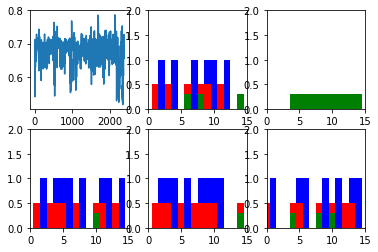

New data, epoch 47
Step 0 Loss 0.714982


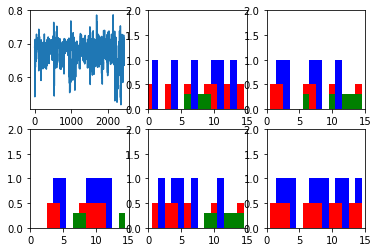

New data, epoch 48
Step 0 Loss 0.711421


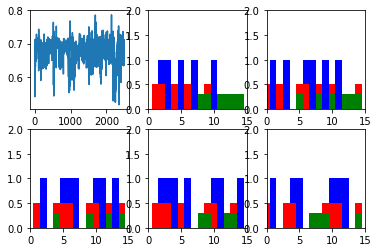

New data, epoch 49
Step 0 Loss 0.734983


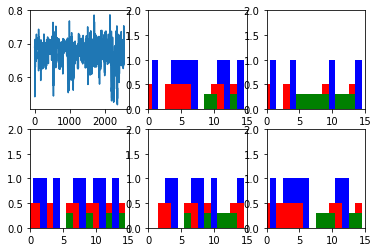

New data, epoch 50
Step 0 Loss 0.736686


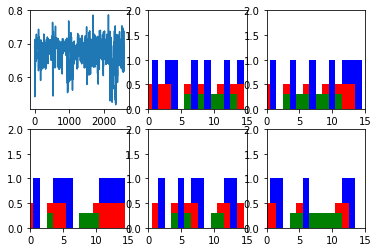

New data, epoch 51
Step 0 Loss 0.754521


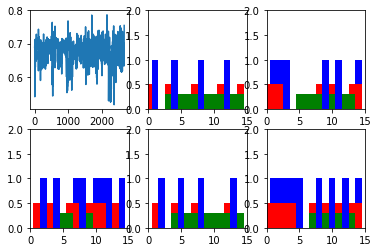

New data, epoch 52
Step 0 Loss 0.684933


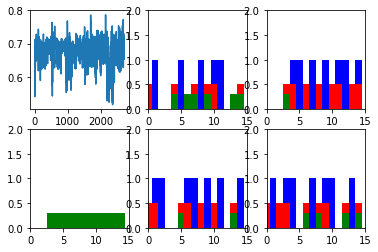

New data, epoch 53
Step 0 Loss 0.690902


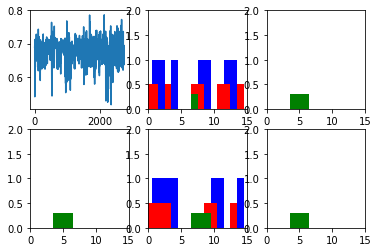

New data, epoch 54
Step 0 Loss 0.704511


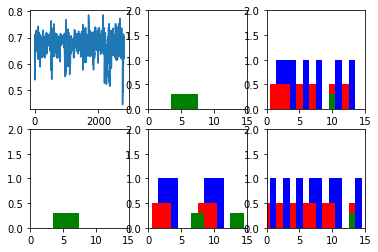

New data, epoch 55
Step 0 Loss 0.728586


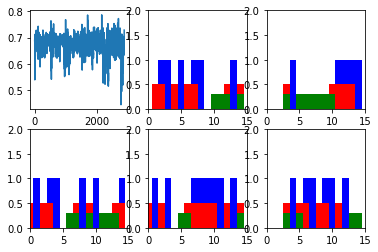

New data, epoch 56
Step 0 Loss 0.752615


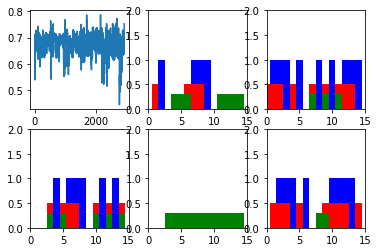

New data, epoch 57
Step 0 Loss 0.718343


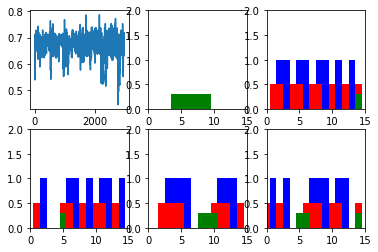

New data, epoch 58
Step 0 Loss 0.697361


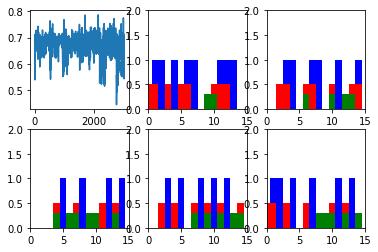

New data, epoch 59
Step 0 Loss 0.779351


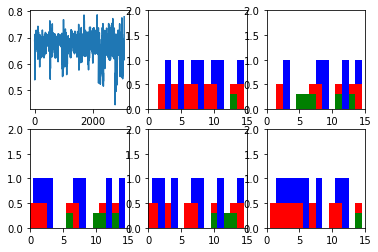

New data, epoch 60
Step 0 Loss 0.656758


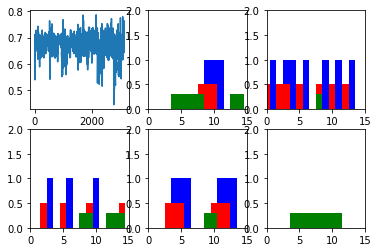

New data, epoch 61
Step 0 Loss 0.697823


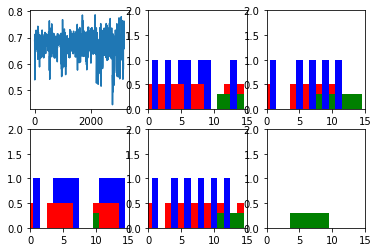

New data, epoch 62
Step 0 Loss 0.759359


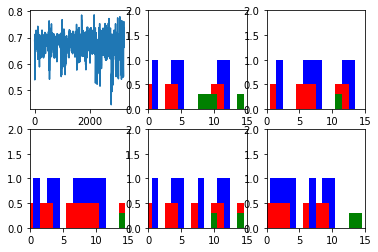

New data, epoch 63
Step 0 Loss 0.812452


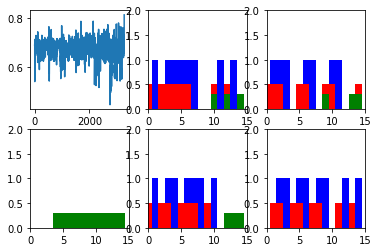

New data, epoch 64
Step 0 Loss 0.71972


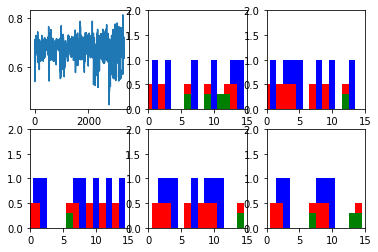

New data, epoch 65
Step 0 Loss 0.71014


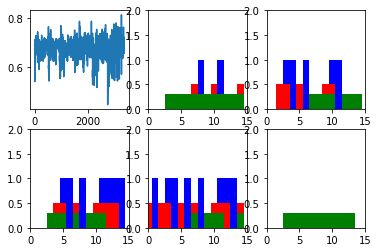

New data, epoch 66
Step 0 Loss 0.701607


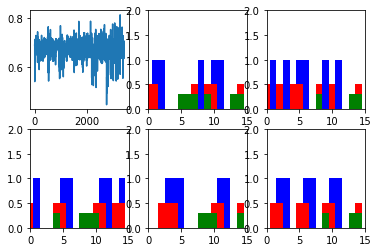

New data, epoch 67
Step 0 Loss 0.707425


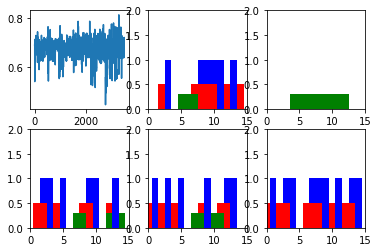

New data, epoch 68
Step 0 Loss 0.731151


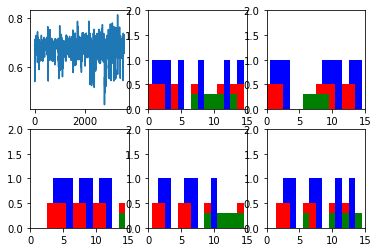

New data, epoch 69
Step 0 Loss 0.706935


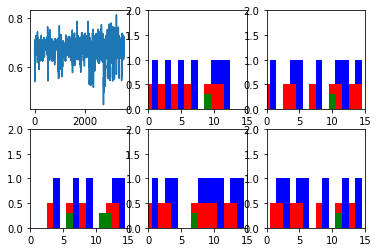

New data, epoch 70
Step 0 Loss 0.688771


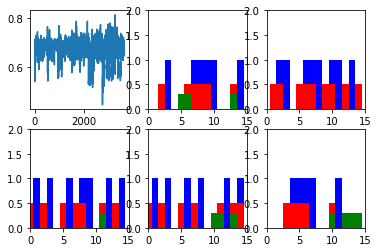

New data, epoch 71
Step 0 Loss 0.724364


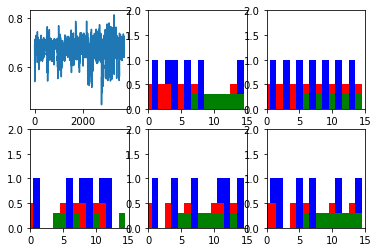

New data, epoch 72
Step 0 Loss 0.699067


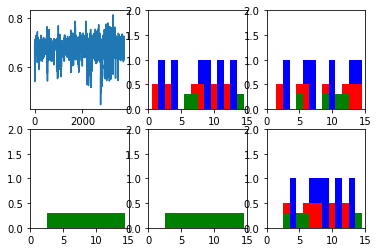

New data, epoch 73
Step 0 Loss 0.676318


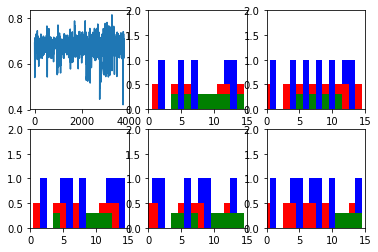

New data, epoch 74
Step 0 Loss 0.742083


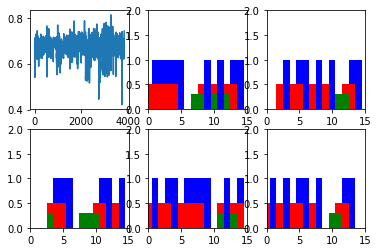

New data, epoch 75
Step 0 Loss 0.670185


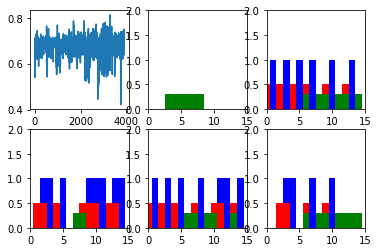

New data, epoch 76
Step 0 Loss 0.734505


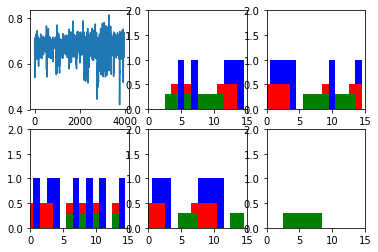

New data, epoch 77
Step 0 Loss 0.713285


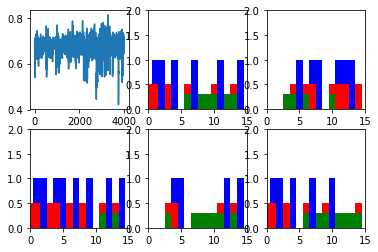

New data, epoch 78
Step 0 Loss 0.645568


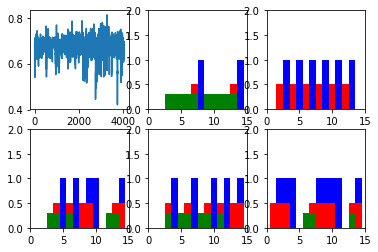

New data, epoch 79
Step 0 Loss 0.723325


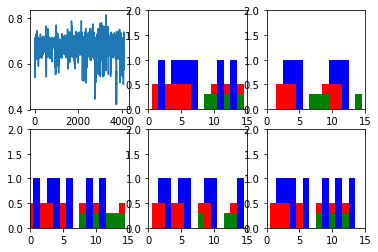

New data, epoch 80
Step 0 Loss 0.64991


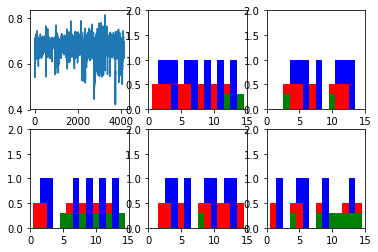

New data, epoch 81
Step 0 Loss 0.649407


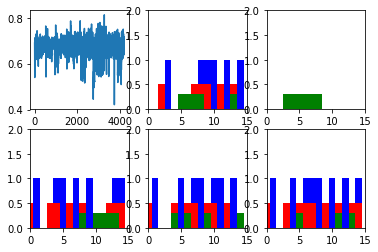

New data, epoch 82
Step 0 Loss 0.65691


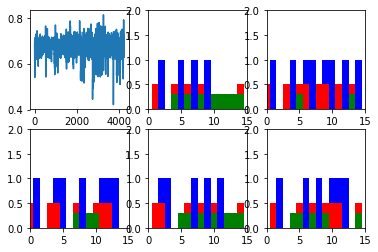

New data, epoch 83
Step 0 Loss 0.704069


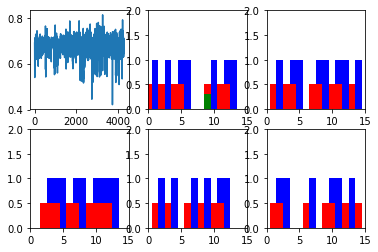

New data, epoch 84
Step 0 Loss 0.75034


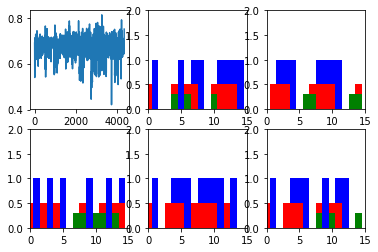

New data, epoch 85
Step 0 Loss 0.659055


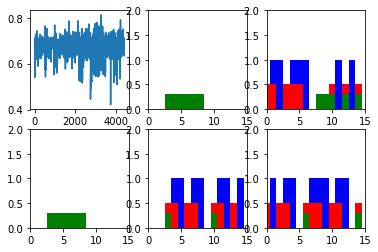

New data, epoch 86
Step 0 Loss 0.606165


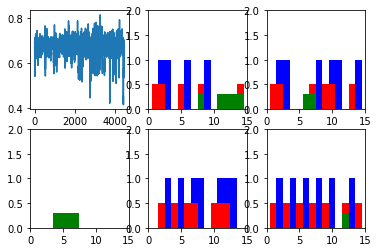

New data, epoch 87
Step 0 Loss 0.675941


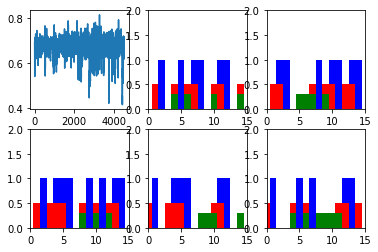

New data, epoch 88
Step 0 Loss 0.685041


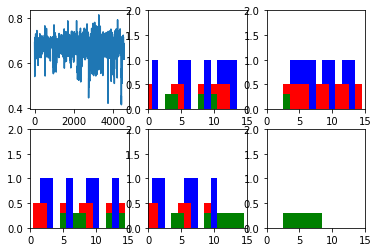

New data, epoch 89
Step 0 Loss 0.601873


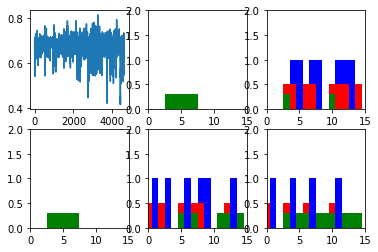

New data, epoch 90
Step 0 Loss 0.635592


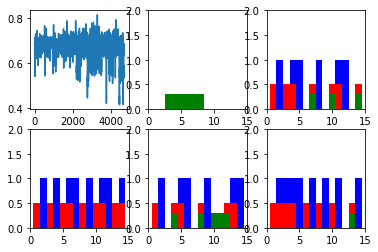

New data, epoch 91
Step 0 Loss 0.672312


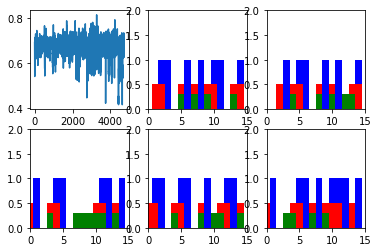

New data, epoch 92
Step 0 Loss 0.677269


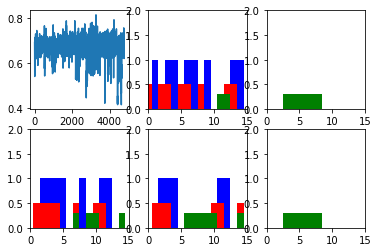

New data, epoch 93
Step 0 Loss 0.67816


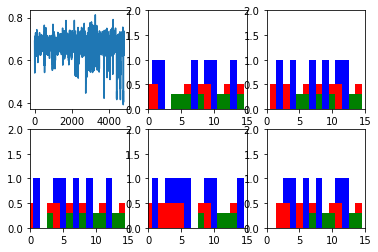

New data, epoch 94
Step 0 Loss 0.694885


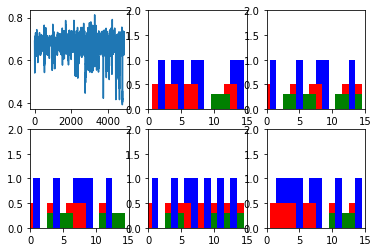

New data, epoch 95
Step 0 Loss 0.642528


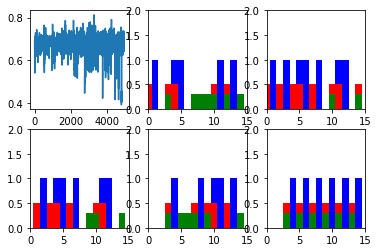

New data, epoch 96
Step 0 Loss 0.678725


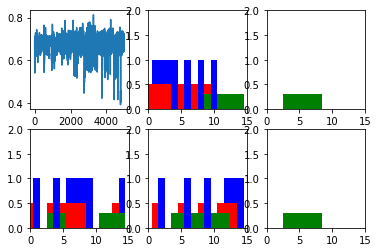

New data, epoch 97
Step 0 Loss 0.72193


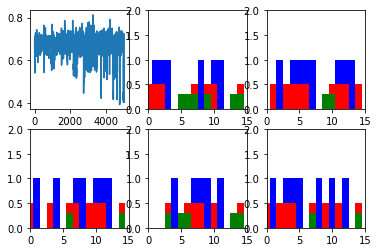

New data, epoch 98
Step 0 Loss 0.68554


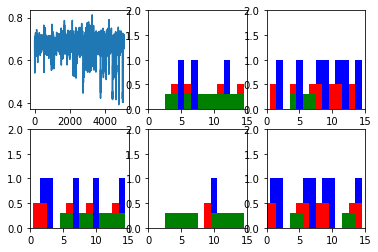

New data, epoch 99
Step 0 Loss 0.712797


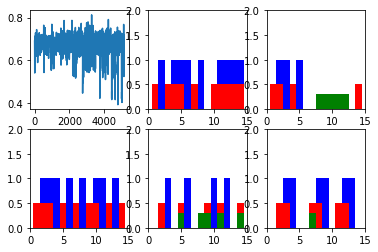

In [43]:
num_epochs = 100
total_series_length = trn.shape[1]
truncated_backprop_length = 15
state_size = 4
num_classes = 2
echo_step = 3
batch_size = 5
num_batches = total_series_length//truncated_backprop_length

def generateData(data, batch_size):
    x = data.iloc[np.random.choice(data.shape[0], size=(batch_size,)), :]
    x[x > 0] = 1
    x[x <= 0] = 0
    y = x.T.shift(-1).T
    return (x, y)

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.int32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
current_state = init_state
states_series = []
for current_input in inputs_series:
    current_input = tf.reshape(current_input, [batch_size, 1])
    input_and_state_concatenated = tf.concat([current_input, current_state], 1)  # Increasing number of columns

    next_state = tf.tanh(tf.matmul(input_and_state_concatenated, W) + b)  # Broadcasted addition
    states_series.append(next_state)
    current_state = next_state

logits_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits, labels=labels) for logits, labels in zip(logits_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdagradOptimizer(0.3).minimize(total_loss)

def plot(loss_list, predictions_series, batchX, batchY):
    plt.subplot(2, 3, 1)
    plt.cla()
    plt.plot(loss_list)

    for batch_series_idx in range(5):
        one_hot_output_series = np.array(predictions_series)[:, batch_series_idx, :]
        single_output_series = np.array([(1 if out[0] < 0.5 else 0) for out in one_hot_output_series])

        plt.subplot(2, 3, batch_series_idx + 2)
        plt.cla()
        plt.axis([0, truncated_backprop_length, 0, 2])
        left_offset = range(truncated_backprop_length)
        plt.bar(left_offset, batchX[batch_series_idx, :], width=1, color="blue")
        plt.bar(left_offset, batchY[batch_series_idx, :] * 0.5, width=1, color="red")
        plt.bar(left_offset, single_output_series * 0.3, width=1, color="green")

    plt.draw()
    plt.pause(0.0001)


with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx)

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if batch_idx%100 == 0:
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)

plt.ioff()
plt.show()


### Changing optimizer

/usr/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':
/usr/lib/python3.6/site-packages/pandas/core/frame.py:2554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._where(-key, value, inplace=True)
/usr/lib/python3.6/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
 

New data, epoch 0
Step 0 Loss 0.801291


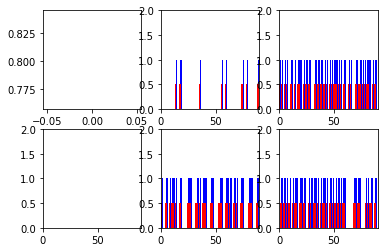

New data, epoch 1
Step 0 Loss nan


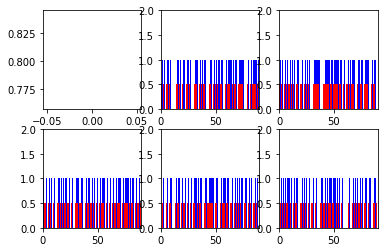

New data, epoch 2
Step 0 Loss nan


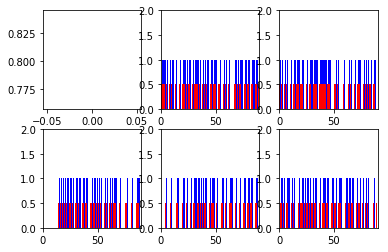

New data, epoch 3
Step 0 Loss nan


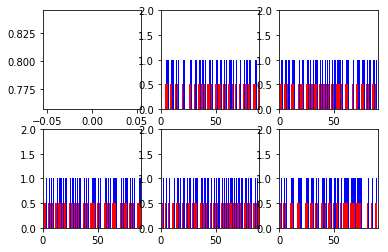

New data, epoch 4
Step 0 Loss nan


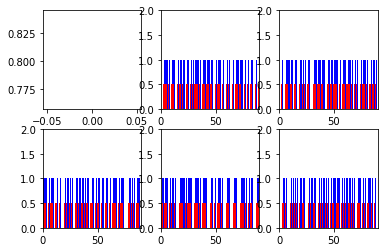

New data, epoch 5
Step 0 Loss nan


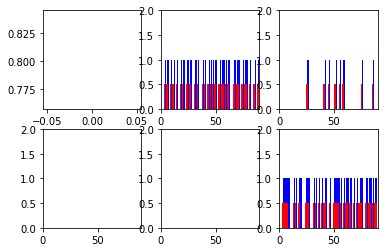

New data, epoch 6
Step 0 Loss nan


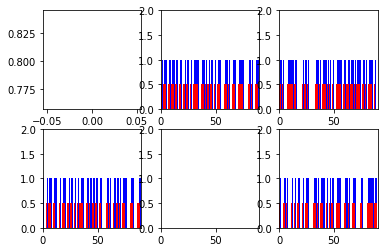

New data, epoch 7
Step 0 Loss nan


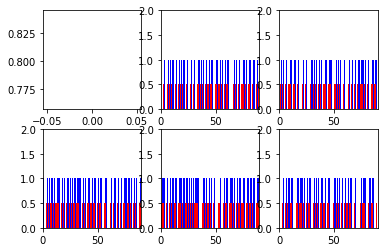

New data, epoch 8
Step 0 Loss nan


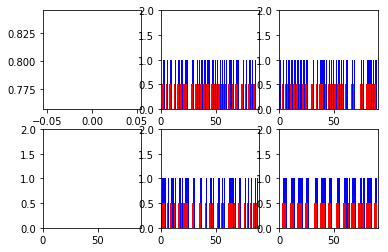

New data, epoch 9
Step 0 Loss nan


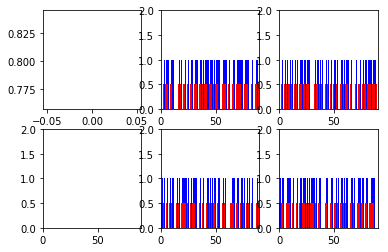

New data, epoch 10
Step 0 Loss nan


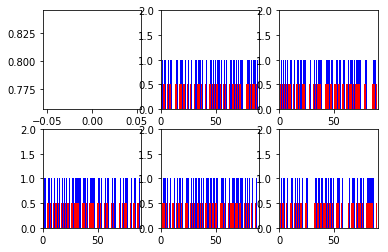

New data, epoch 11
Step 0 Loss nan


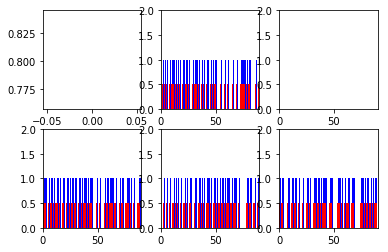

New data, epoch 12
Step 0 Loss nan


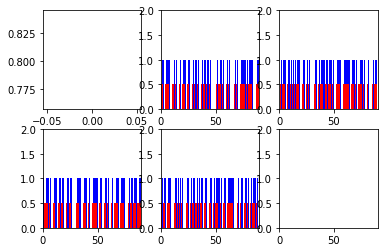

New data, epoch 13
Step 0 Loss nan


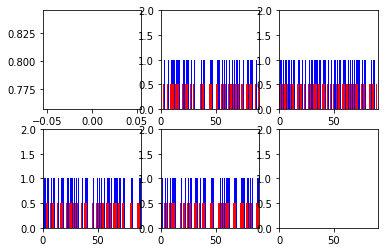

New data, epoch 14
Step 0 Loss nan


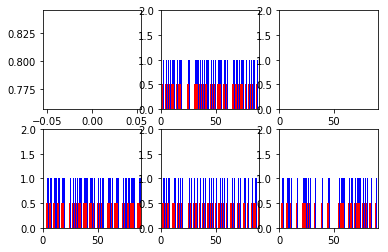

New data, epoch 15
Step 0 Loss nan


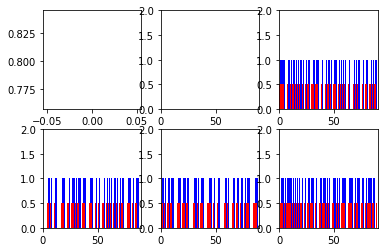

New data, epoch 16
Step 0 Loss nan


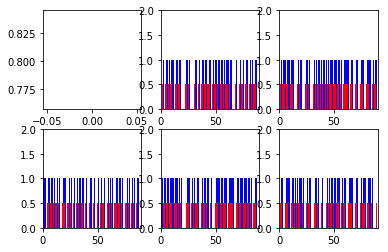

New data, epoch 17
Step 0 Loss nan


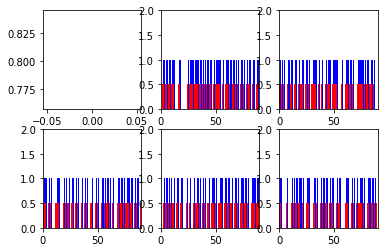

New data, epoch 18
Step 0 Loss nan


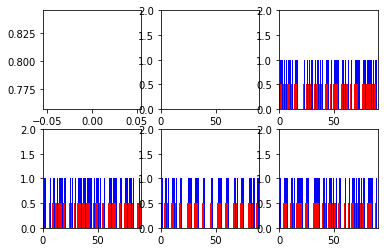

New data, epoch 19
Step 0 Loss nan


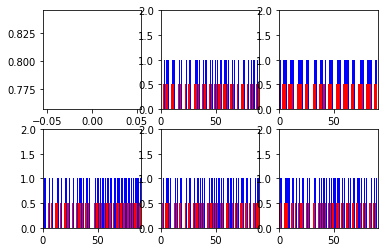

New data, epoch 20
Step 0 Loss nan


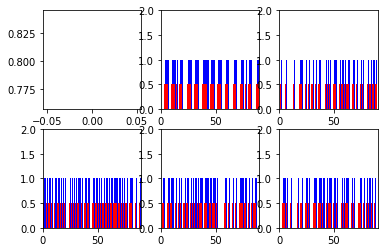

New data, epoch 21
Step 0 Loss nan


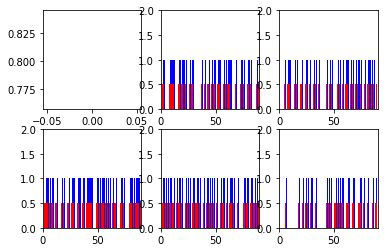

New data, epoch 22
Step 0 Loss nan


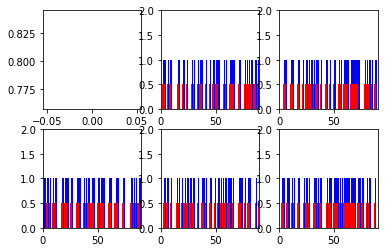

New data, epoch 23
Step 0 Loss nan


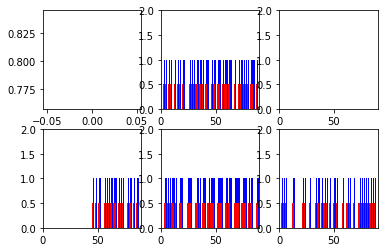

New data, epoch 24
Step 0 Loss nan


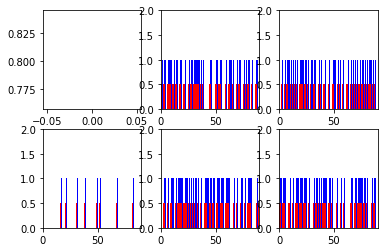

New data, epoch 25
Step 0 Loss nan


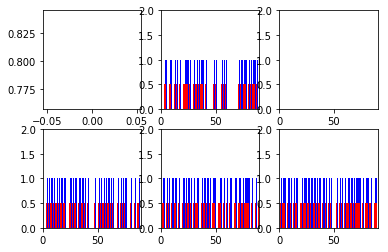

New data, epoch 26
Step 0 Loss nan


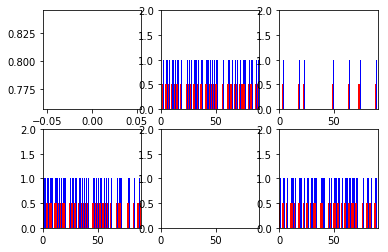

New data, epoch 27
Step 0 Loss nan


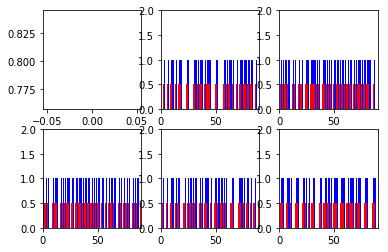

New data, epoch 28
Step 0 Loss nan


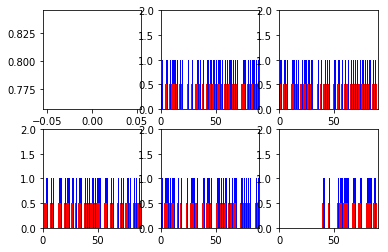

New data, epoch 29
Step 0 Loss nan


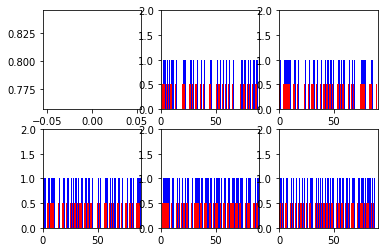

New data, epoch 30
Step 0 Loss nan


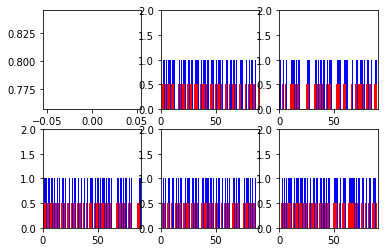

New data, epoch 31
Step 0 Loss nan


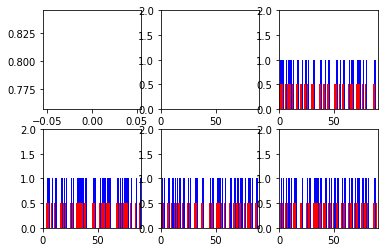

New data, epoch 32
Step 0 Loss nan


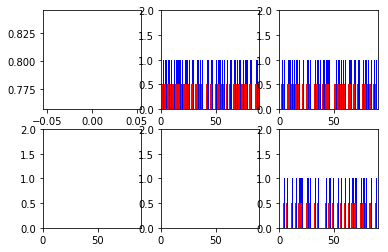

New data, epoch 33
Step 0 Loss nan


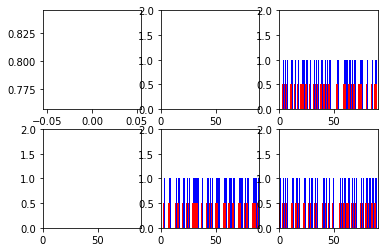

New data, epoch 34
Step 0 Loss nan


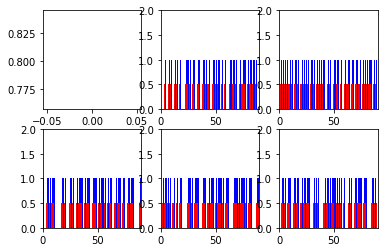

New data, epoch 35
Step 0 Loss nan


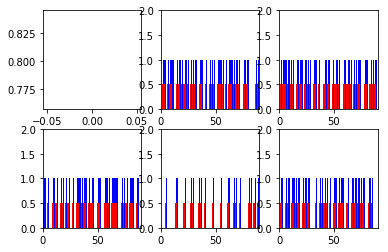

New data, epoch 36
Step 0 Loss nan


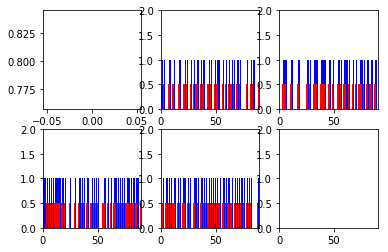

New data, epoch 37
Step 0 Loss nan


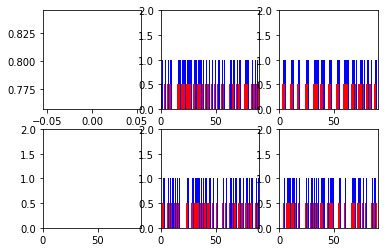

New data, epoch 38
Step 0 Loss nan


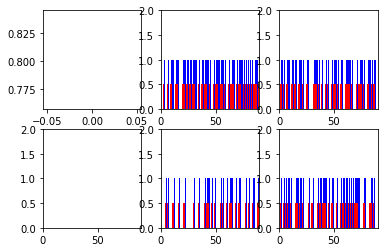

New data, epoch 39
Step 0 Loss nan


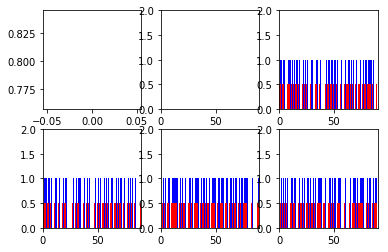

New data, epoch 40
Step 0 Loss nan


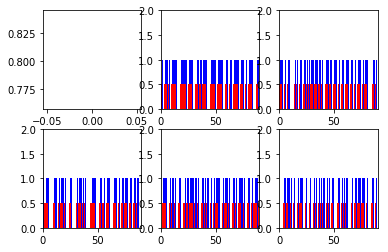

New data, epoch 41
Step 0 Loss nan


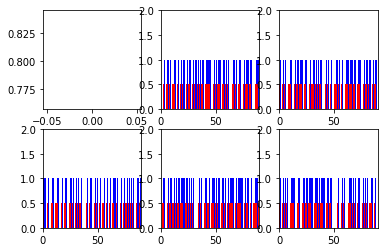

New data, epoch 42
Step 0 Loss nan


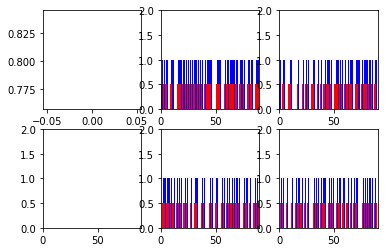

New data, epoch 43
Step 0 Loss nan


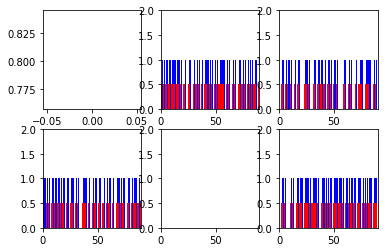

New data, epoch 44
Step 0 Loss nan


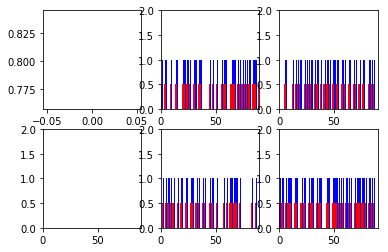

New data, epoch 45
Step 0 Loss nan


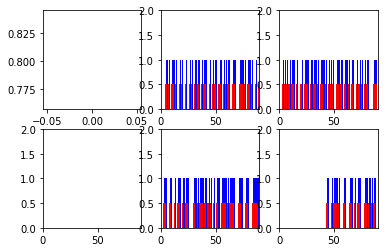

New data, epoch 46
Step 0 Loss nan


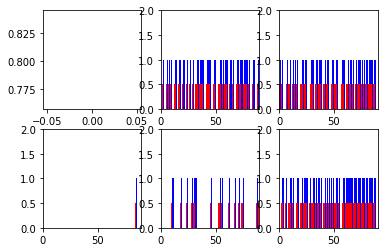

New data, epoch 47
Step 0 Loss nan


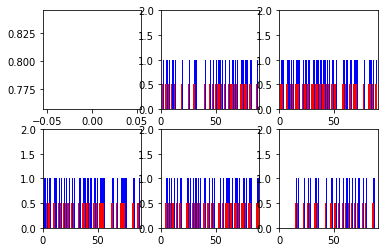

New data, epoch 48
Step 0 Loss nan


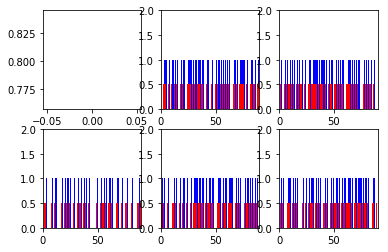

New data, epoch 49
Step 0 Loss nan


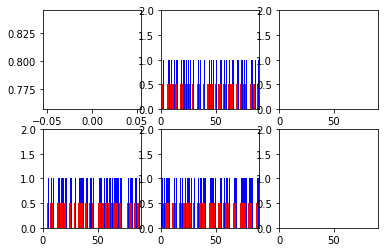

New data, epoch 50
Step 0 Loss nan


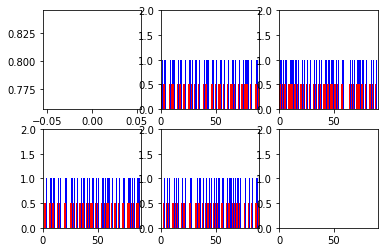

New data, epoch 51
Step 0 Loss nan


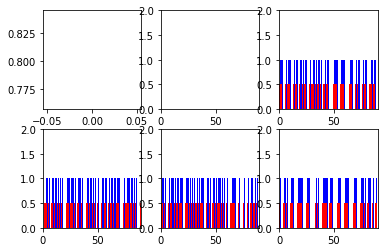

New data, epoch 52
Step 0 Loss nan


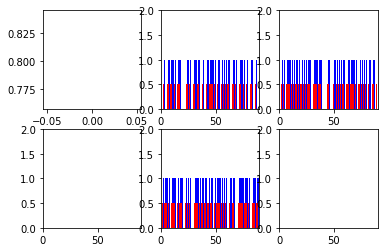

New data, epoch 53
Step 0 Loss nan


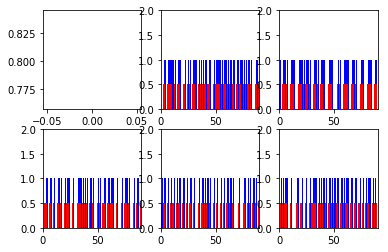

New data, epoch 54
Step 0 Loss nan


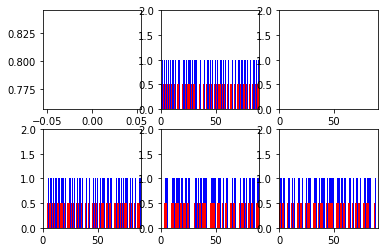

New data, epoch 55
Step 0 Loss nan


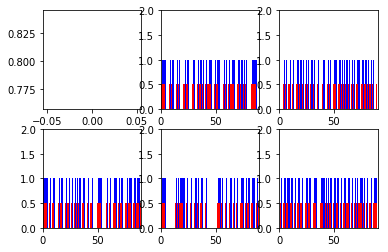

New data, epoch 56
Step 0 Loss nan


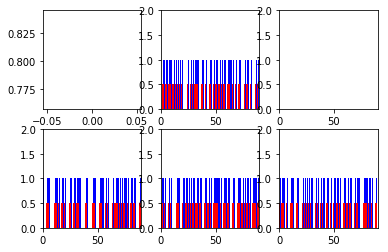

New data, epoch 57
Step 0 Loss nan


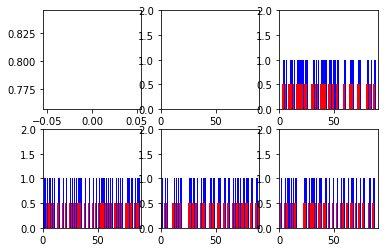

New data, epoch 58
Step 0 Loss nan


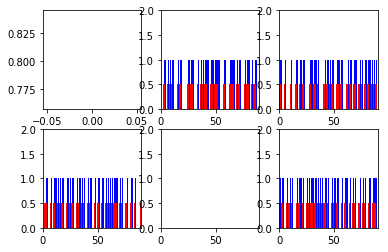

New data, epoch 59
Step 0 Loss nan


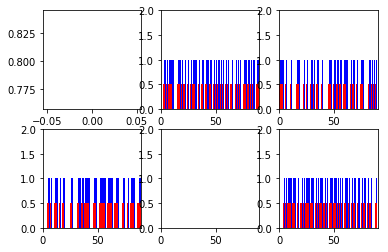

New data, epoch 60
Step 0 Loss nan


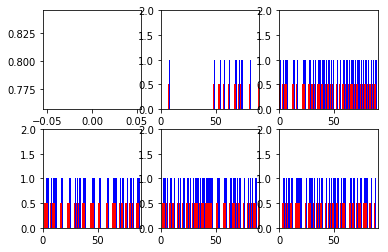

New data, epoch 61
Step 0 Loss nan


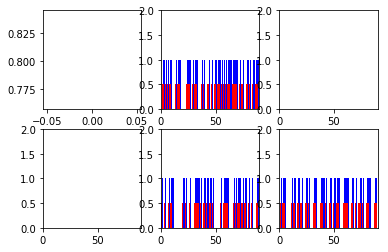

New data, epoch 62
Step 0 Loss nan


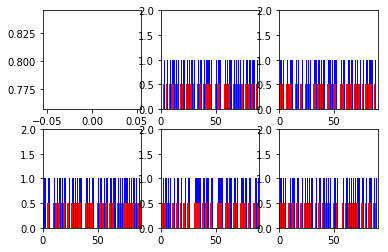

New data, epoch 63
Step 0 Loss nan


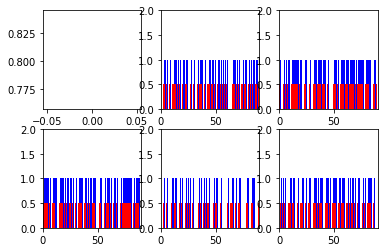

New data, epoch 64
Step 0 Loss nan


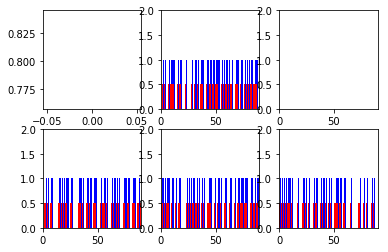

New data, epoch 65
Step 0 Loss nan


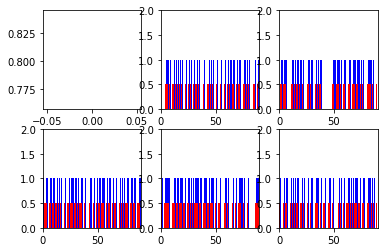

New data, epoch 66
Step 0 Loss nan


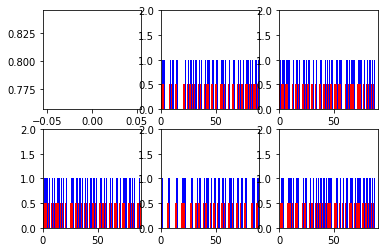

New data, epoch 67
Step 0 Loss nan


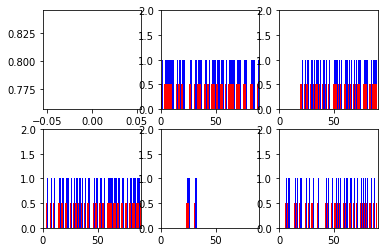

New data, epoch 68
Step 0 Loss nan


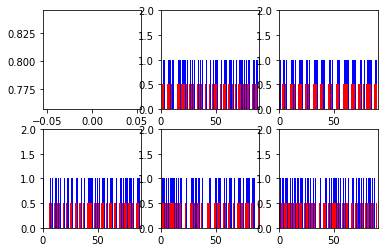

New data, epoch 69
Step 0 Loss nan


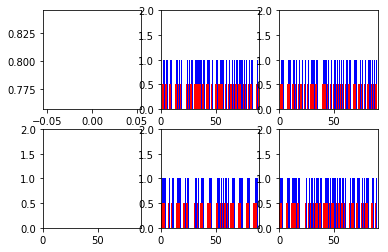

New data, epoch 70
Step 0 Loss nan


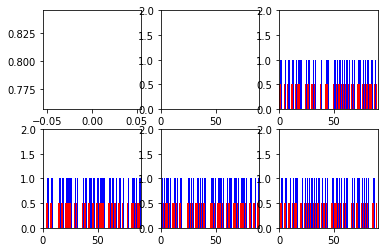

New data, epoch 71
Step 0 Loss nan


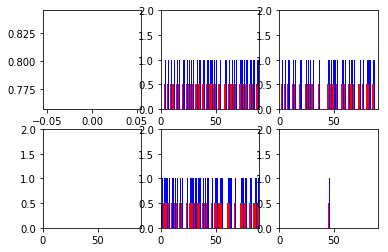

New data, epoch 72
Step 0 Loss nan


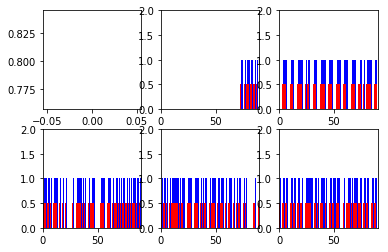

New data, epoch 73
Step 0 Loss nan


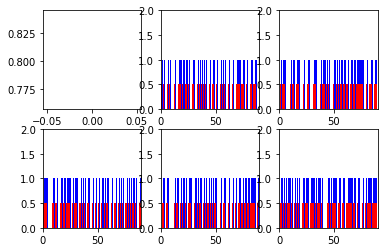

New data, epoch 74
Step 0 Loss nan


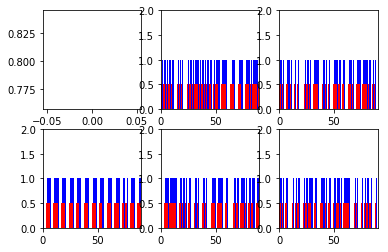

New data, epoch 75
Step 0 Loss nan


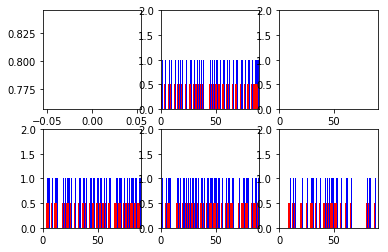

New data, epoch 76
Step 0 Loss nan


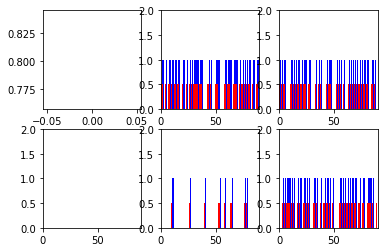

New data, epoch 77
Step 0 Loss nan


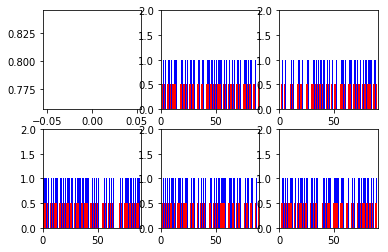

New data, epoch 78
Step 0 Loss nan


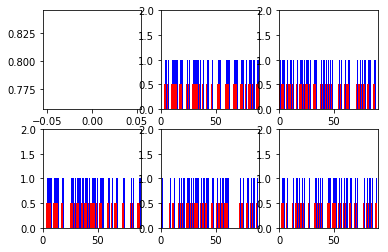

New data, epoch 79
Step 0 Loss nan


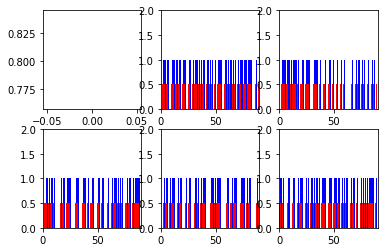

New data, epoch 80
Step 0 Loss nan


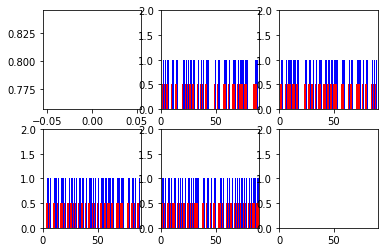

New data, epoch 81
Step 0 Loss nan


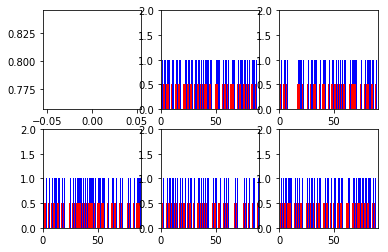

New data, epoch 82
Step 0 Loss nan


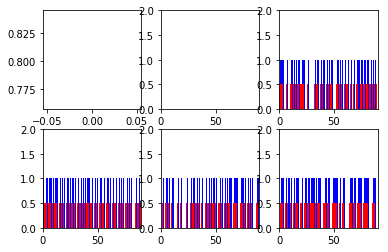

New data, epoch 83
Step 0 Loss nan


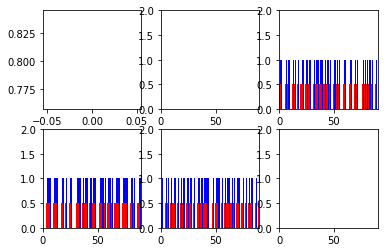

New data, epoch 84
Step 0 Loss nan


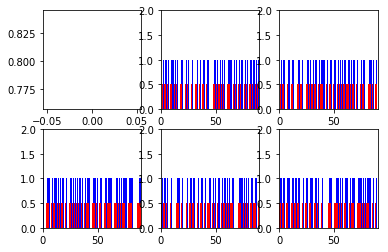

New data, epoch 85
Step 0 Loss nan


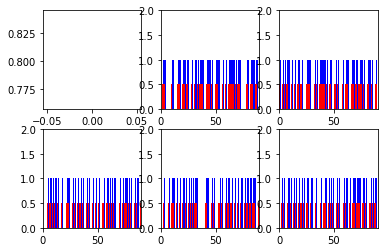

New data, epoch 86
Step 0 Loss nan


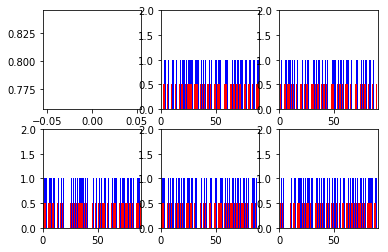

New data, epoch 87
Step 0 Loss nan


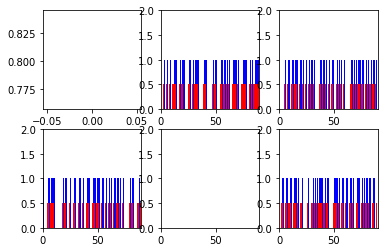

New data, epoch 88
Step 0 Loss nan


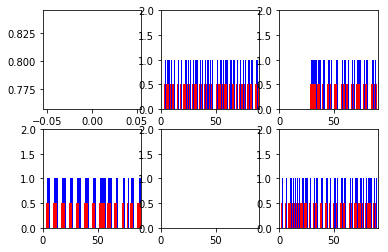

New data, epoch 89
Step 0 Loss nan


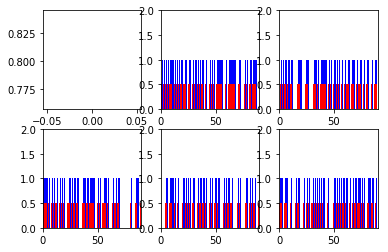

New data, epoch 90
Step 0 Loss nan


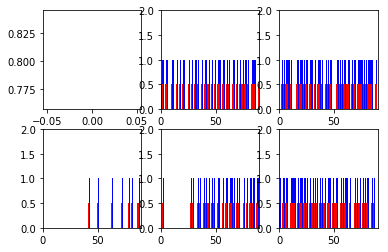

New data, epoch 91
Step 0 Loss nan


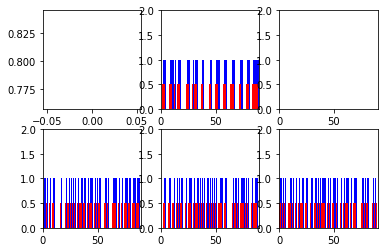

New data, epoch 92
Step 0 Loss nan


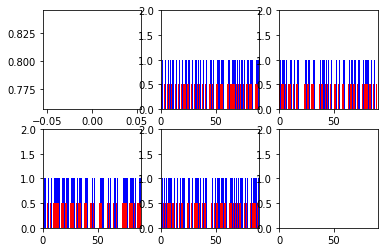

New data, epoch 93
Step 0 Loss nan


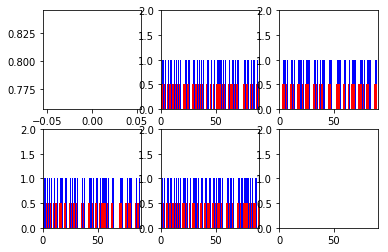

New data, epoch 94
Step 0 Loss nan


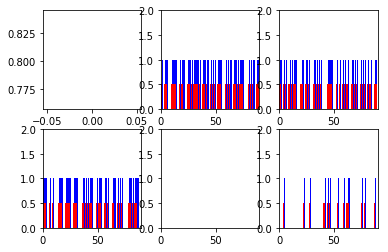

New data, epoch 95
Step 0 Loss nan


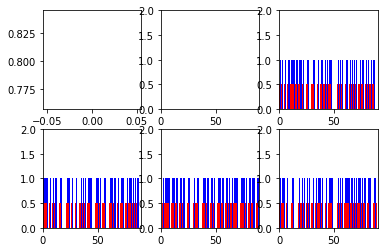

New data, epoch 96
Step 0 Loss nan


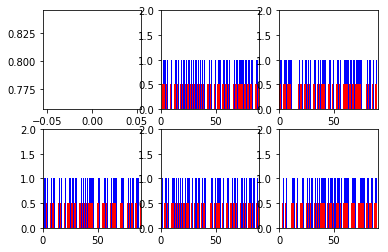

New data, epoch 97
Step 0 Loss nan


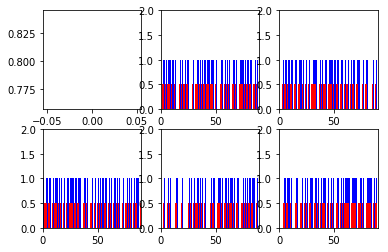

New data, epoch 98
Step 0 Loss nan


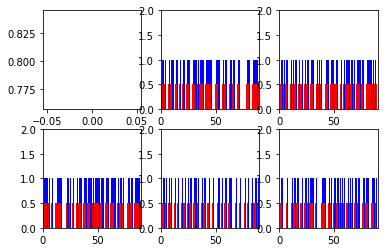

New data, epoch 99
Step 0 Loss nan


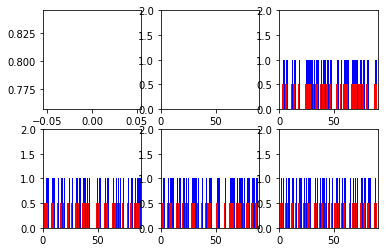

In [44]:
num_epochs = 100
total_series_length = trn.shape[1]
truncated_backprop_length = 90
state_size = 15
num_classes = 2
echo_step = 3
batch_size = 10
num_batches = total_series_length//truncated_backprop_length

def generateData(data, batch_size):
    x = data.iloc[np.random.choice(data.shape[0], size=(batch_size,)), :]
    x[x > 0] = 1
    x[x <= 0] = 0
    y = x.T.shift(-1).T
    return (x, y)

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.int32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
current_state = init_state
states_series = []
for current_input in inputs_series:
    current_input = tf.reshape(current_input, [batch_size, 1])
    input_and_state_concatenated = tf.concat([current_input, current_state], 1)  # Increasing number of columns

    next_state = tf.tanh(tf.matmul(input_and_state_concatenated, W) + b)  # Broadcasted addition
    states_series.append(next_state)
    current_state = next_state

logits_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits, labels=labels) for logits, labels in zip(logits_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdagradOptimizer(0.3).minimize(total_loss)

def plot(loss_list, predictions_series, batchX, batchY):
    plt.subplot(2, 3, 1)
    plt.cla()
    plt.plot(loss_list)

    for batch_series_idx in range(5):
        one_hot_output_series = np.array(predictions_series)[:, batch_series_idx, :]
        single_output_series = np.array([(1 if out[0] < 0.5 else 0) for out in one_hot_output_series])

        plt.subplot(2, 3, batch_series_idx + 2)
        plt.cla()
        plt.axis([0, truncated_backprop_length, 0, 2])
        left_offset = range(truncated_backprop_length)
        plt.bar(left_offset, batchX[batch_series_idx, :], width=1, color="blue")
        plt.bar(left_offset, batchY[batch_series_idx, :] * 0.5, width=1, color="red")
        plt.bar(left_offset, single_output_series * 0.3, width=1, color="green")

    plt.draw()
    plt.pause(0.0001)


with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx)

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if batch_idx%100 == 0:
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)

plt.ioff()
plt.show()


### 30 day trunc backprop len

/usr/lib/python3.6/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if sys.path[0] == '':
/usr/lib/python3.6/site-packages/pandas/core/frame.py:2554: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._where(-key, value, inplace=True)
/usr/lib/python3.6/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
 

New data, epoch 0
Step 0 Loss 1.43689


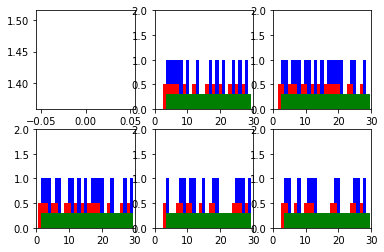

New data, epoch 1
Step 0 Loss nan


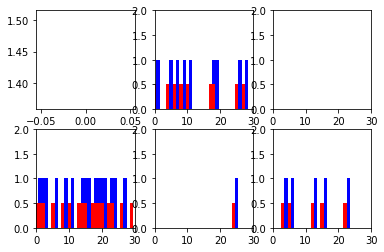

New data, epoch 2
Step 0 Loss nan


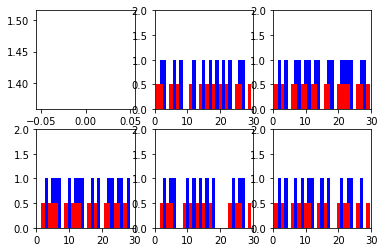

New data, epoch 3
Step 0 Loss nan


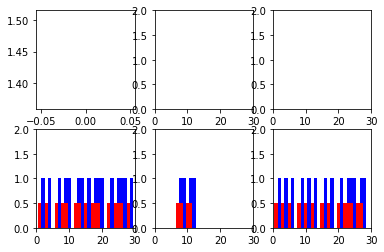

New data, epoch 4
Step 0 Loss nan


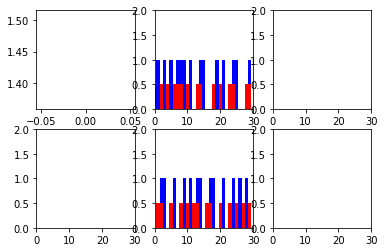

New data, epoch 5
Step 0 Loss nan


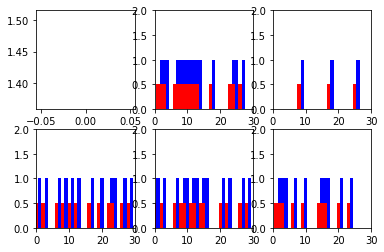

New data, epoch 6
Step 0 Loss nan


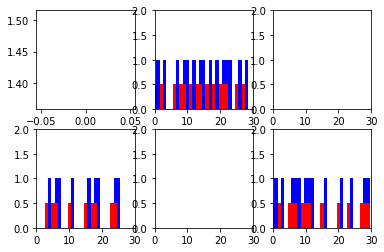

New data, epoch 7
Step 0 Loss nan


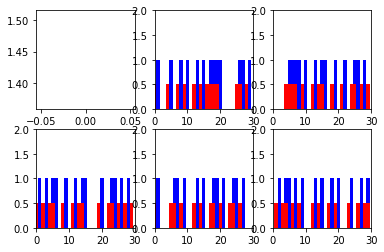

New data, epoch 8
Step 0 Loss nan


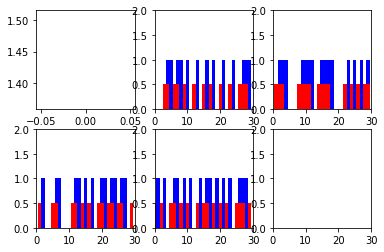

New data, epoch 9
Step 0 Loss nan


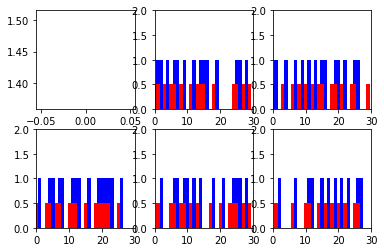

New data, epoch 10
Step 0 Loss nan


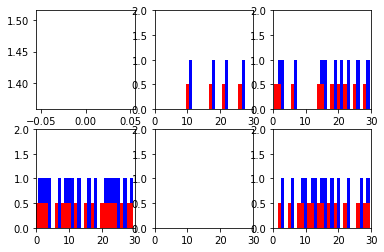

New data, epoch 11
Step 0 Loss nan


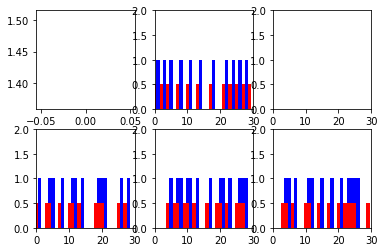

New data, epoch 12
Step 0 Loss nan


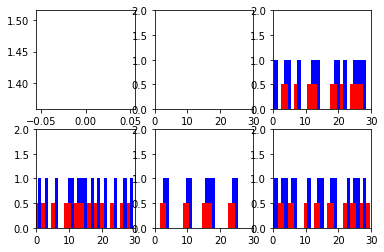

New data, epoch 13
Step 0 Loss nan


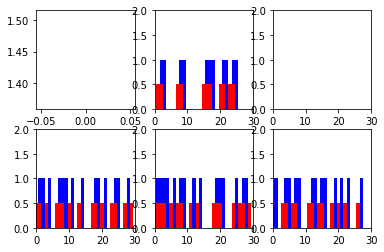

New data, epoch 14
Step 0 Loss nan


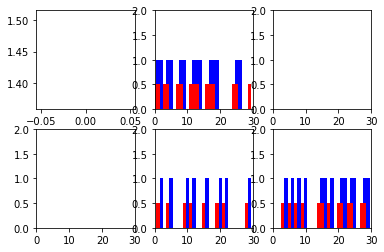

New data, epoch 15
Step 0 Loss nan


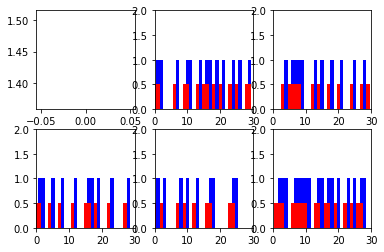

New data, epoch 16
Step 0 Loss nan


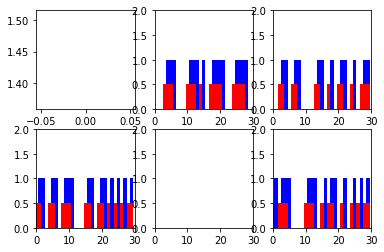

New data, epoch 17
Step 0 Loss nan


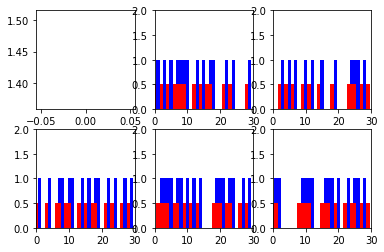

New data, epoch 18
Step 0 Loss nan


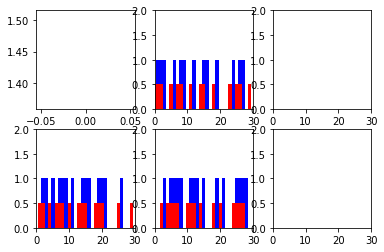

New data, epoch 19
Step 0 Loss nan


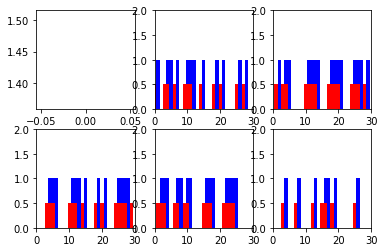

New data, epoch 20
Step 0 Loss nan


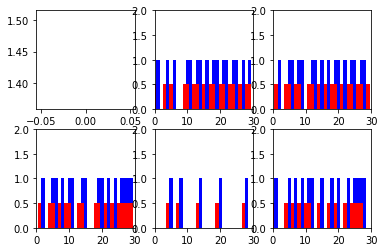

New data, epoch 21
Step 0 Loss nan


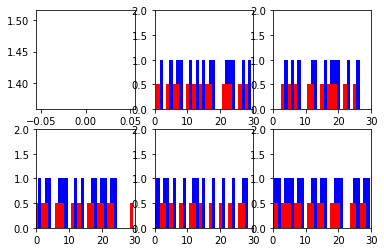

New data, epoch 22
Step 0 Loss nan


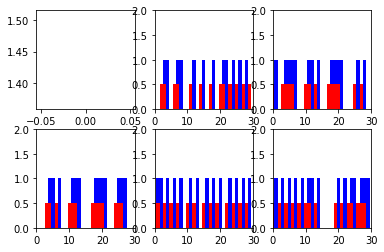

New data, epoch 23
Step 0 Loss nan


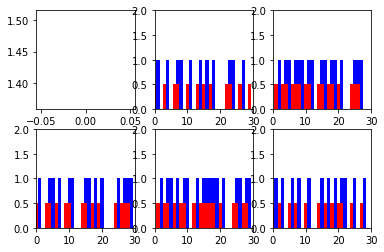

New data, epoch 24
Step 0 Loss nan


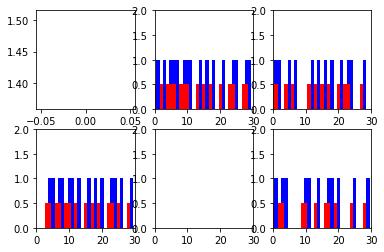

New data, epoch 25
Step 0 Loss nan


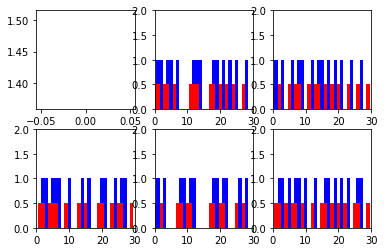

New data, epoch 26
Step 0 Loss nan


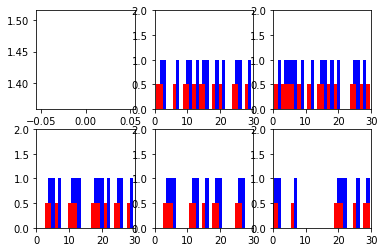

New data, epoch 27
Step 0 Loss nan


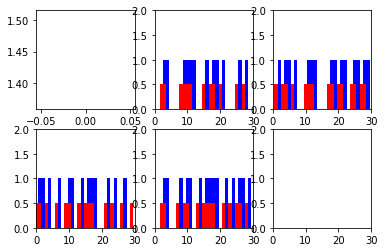

New data, epoch 28
Step 0 Loss nan


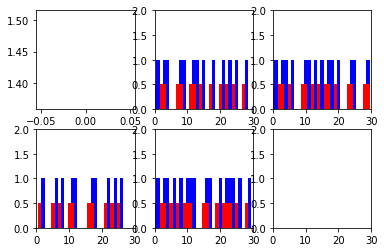

New data, epoch 29
Step 0 Loss nan


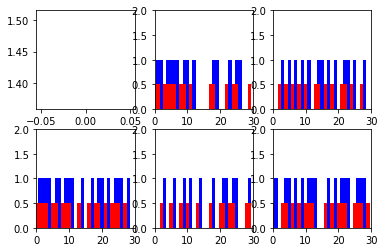

New data, epoch 30
Step 0 Loss nan


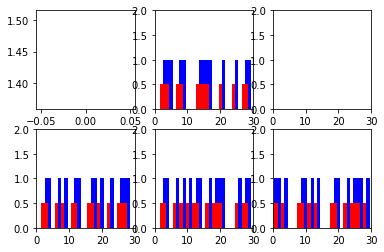

New data, epoch 31
Step 0 Loss nan


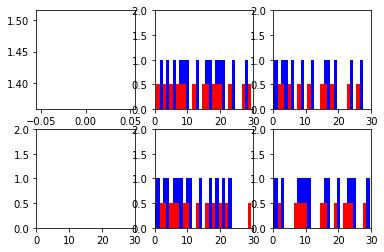

New data, epoch 32
Step 0 Loss nan


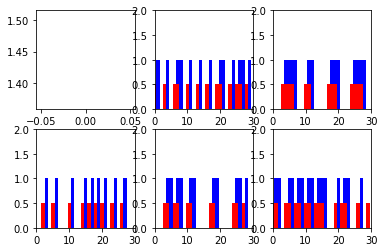

New data, epoch 33
Step 0 Loss nan


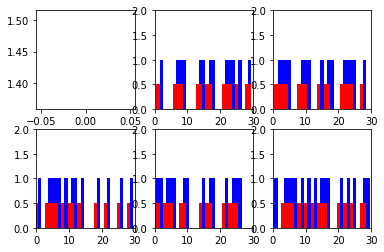

New data, epoch 34
Step 0 Loss nan


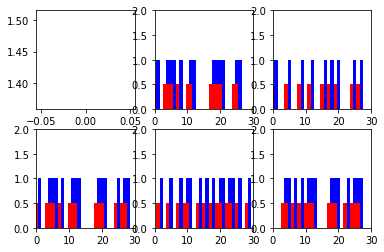

New data, epoch 35
Step 0 Loss nan


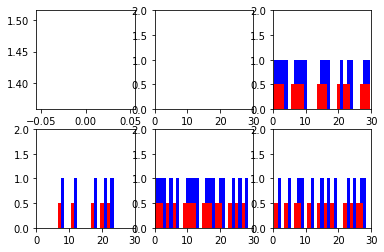

New data, epoch 36
Step 0 Loss nan


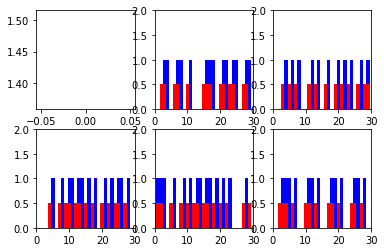

New data, epoch 37
Step 0 Loss nan


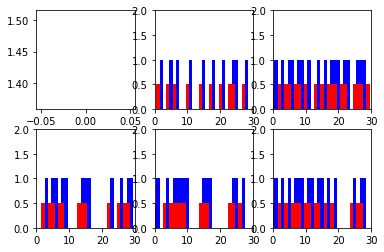

New data, epoch 38
Step 0 Loss nan


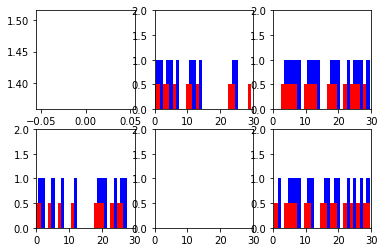

New data, epoch 39
Step 0 Loss nan


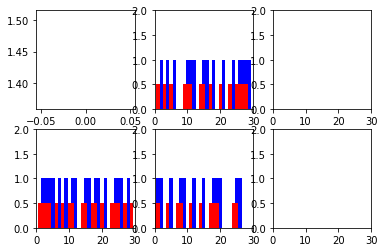

New data, epoch 40
Step 0 Loss nan


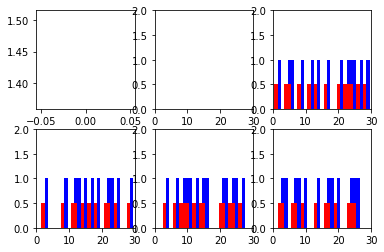

New data, epoch 41
Step 0 Loss nan


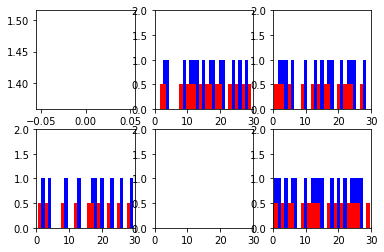

New data, epoch 42
Step 0 Loss nan


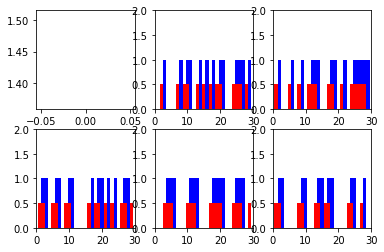

New data, epoch 43
Step 0 Loss nan


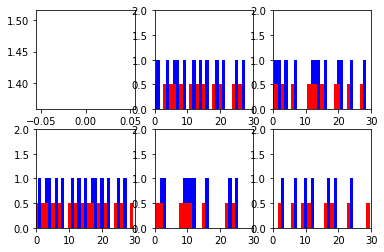

New data, epoch 44
Step 0 Loss nan


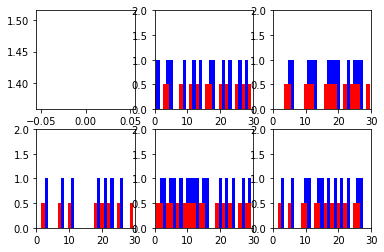

New data, epoch 45
Step 0 Loss nan


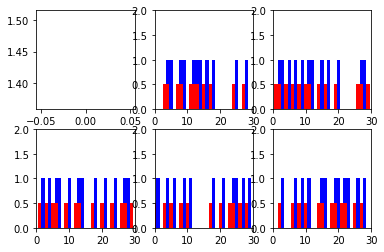

New data, epoch 46
Step 0 Loss nan


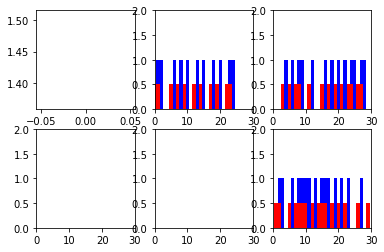

New data, epoch 47
Step 0 Loss nan


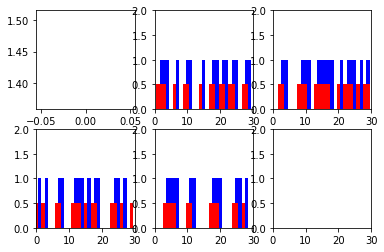

New data, epoch 48
Step 0 Loss nan


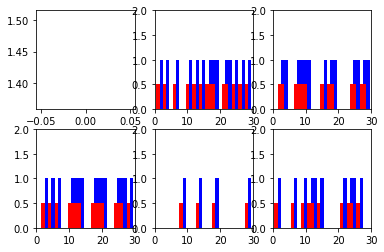

New data, epoch 49
Step 0 Loss nan


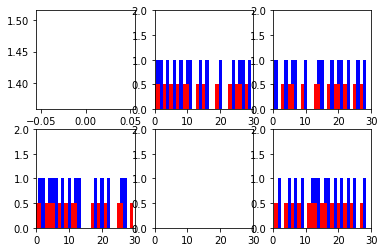

New data, epoch 50
Step 0 Loss nan


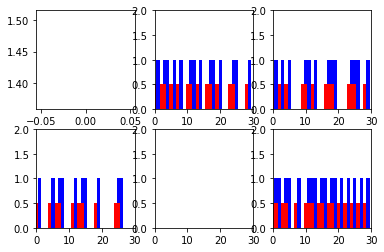

New data, epoch 51
Step 0 Loss nan


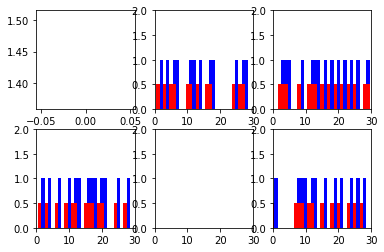

New data, epoch 52
Step 0 Loss nan


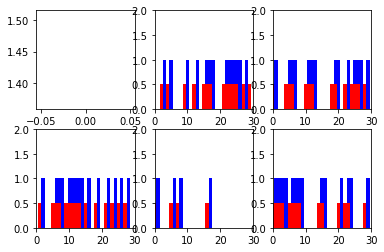

New data, epoch 53
Step 0 Loss nan


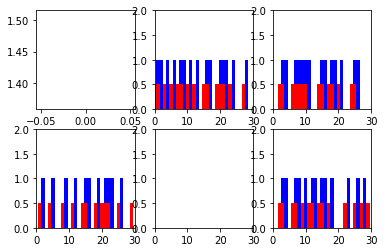

New data, epoch 54
Step 0 Loss nan


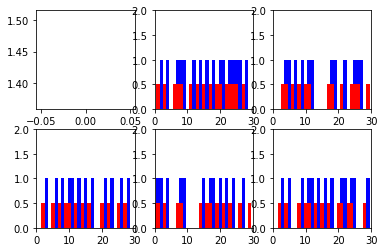

New data, epoch 55
Step 0 Loss nan


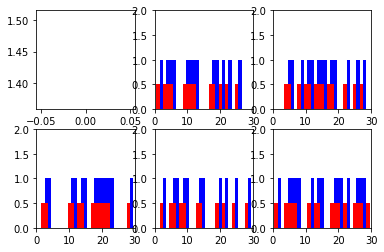

New data, epoch 56
Step 0 Loss nan


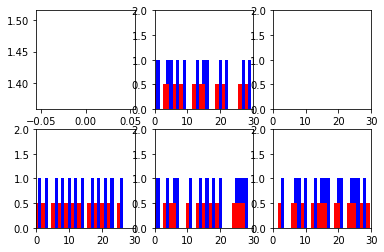

New data, epoch 57
Step 0 Loss nan


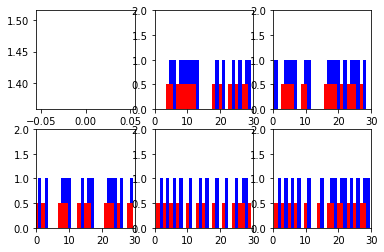

New data, epoch 58
Step 0 Loss nan


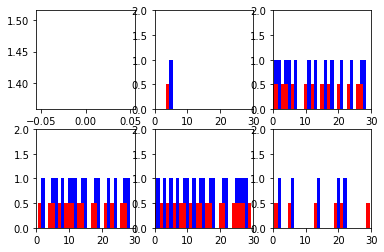

New data, epoch 59
Step 0 Loss nan


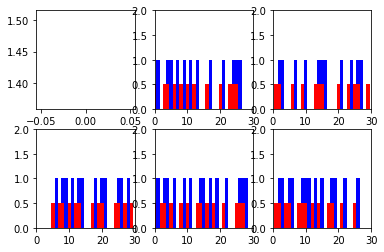

New data, epoch 60
Step 0 Loss nan


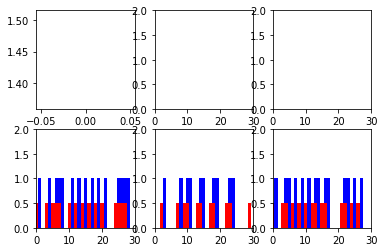

New data, epoch 61
Step 0 Loss nan


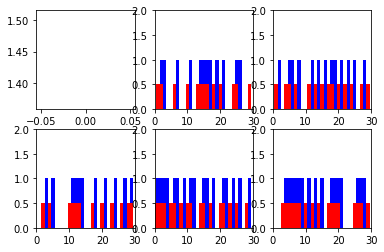

New data, epoch 62
Step 0 Loss nan


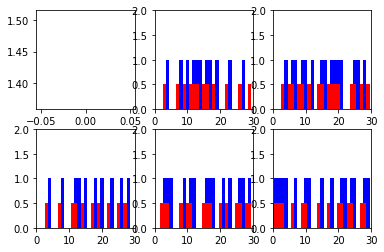

New data, epoch 63
Step 0 Loss nan


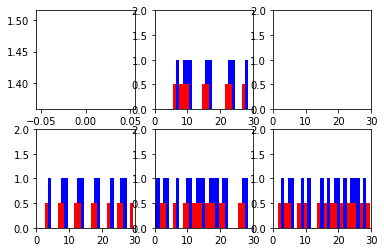

New data, epoch 64
Step 0 Loss nan


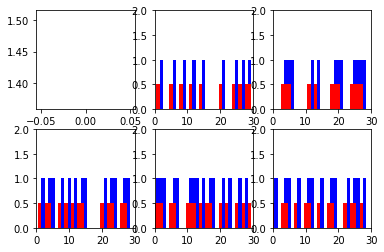

New data, epoch 65
Step 0 Loss nan


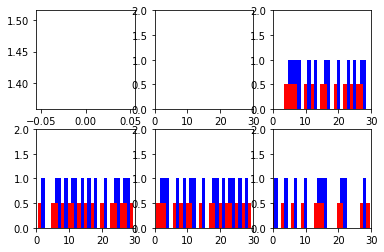

New data, epoch 66
Step 0 Loss nan


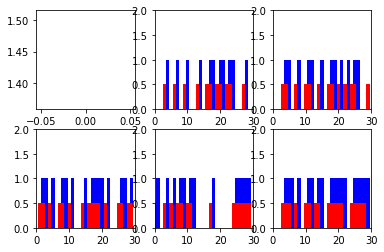

New data, epoch 67
Step 0 Loss nan


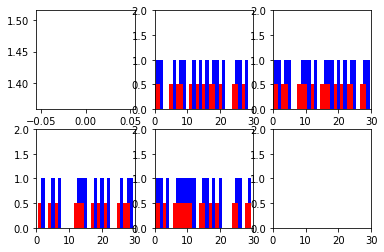

New data, epoch 68
Step 0 Loss nan


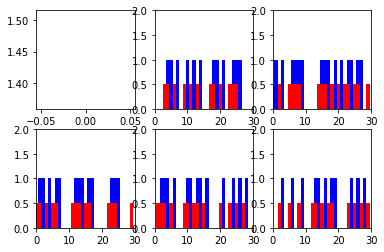

New data, epoch 69
Step 0 Loss nan


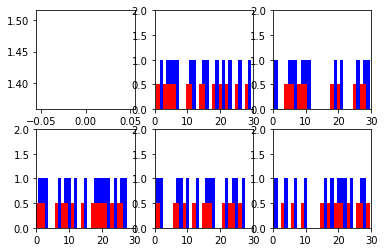

New data, epoch 70
Step 0 Loss nan


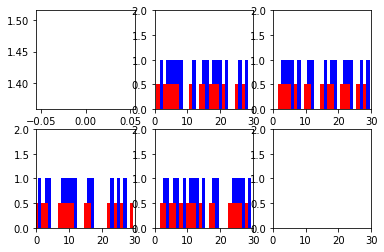

New data, epoch 71
Step 0 Loss nan


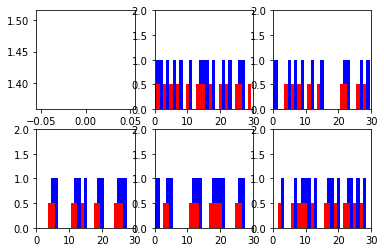

New data, epoch 72
Step 0 Loss nan


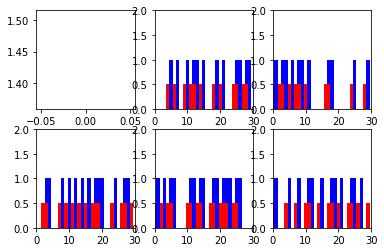

New data, epoch 73
Step 0 Loss nan


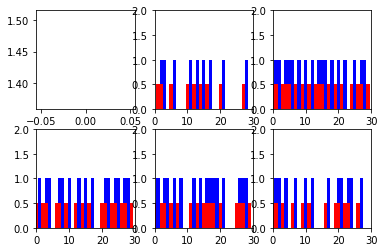

New data, epoch 74
Step 0 Loss nan


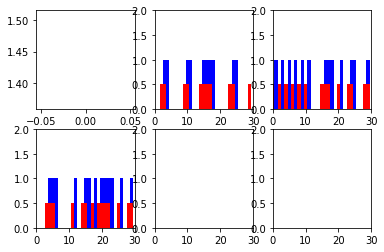

New data, epoch 75
Step 0 Loss nan


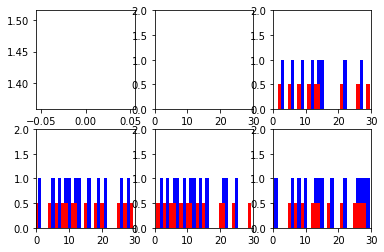

New data, epoch 76
Step 0 Loss nan


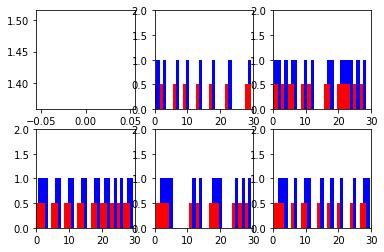

New data, epoch 77
Step 0 Loss nan


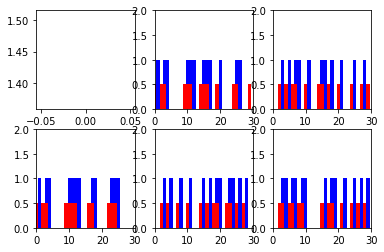

New data, epoch 78
Step 0 Loss nan


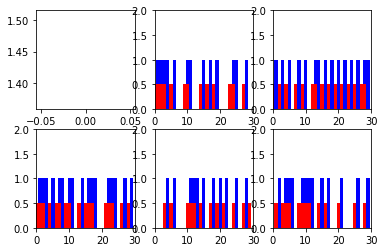

New data, epoch 79
Step 0 Loss nan


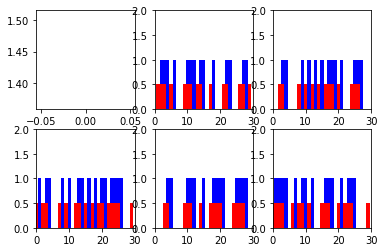

New data, epoch 80
Step 0 Loss nan


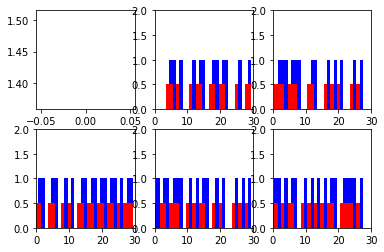

New data, epoch 81
Step 0 Loss nan


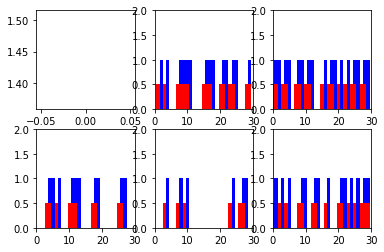

New data, epoch 82
Step 0 Loss nan


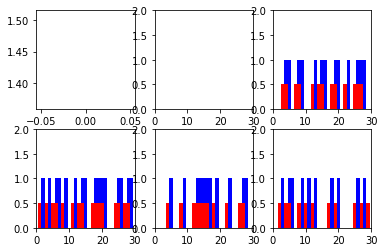

New data, epoch 83
Step 0 Loss nan


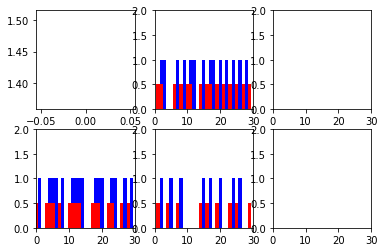

New data, epoch 84
Step 0 Loss nan


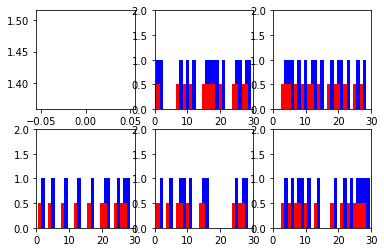

New data, epoch 85
Step 0 Loss nan


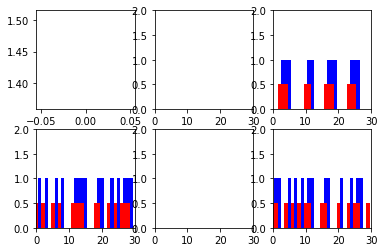

New data, epoch 86
Step 0 Loss nan


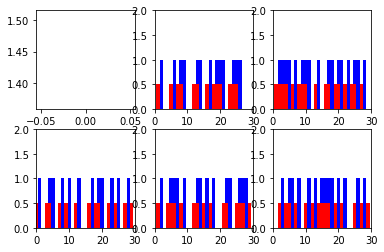

New data, epoch 87
Step 0 Loss nan


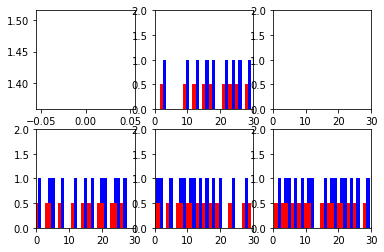

New data, epoch 88
Step 0 Loss nan


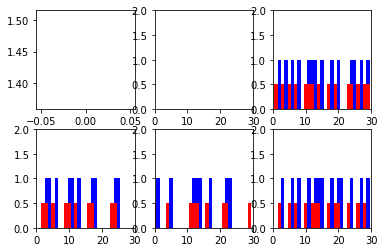

New data, epoch 89
Step 0 Loss nan


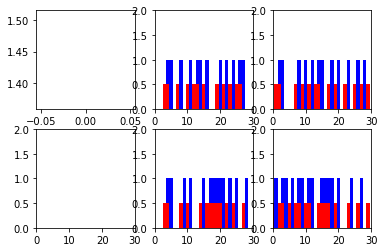

New data, epoch 90
Step 0 Loss nan


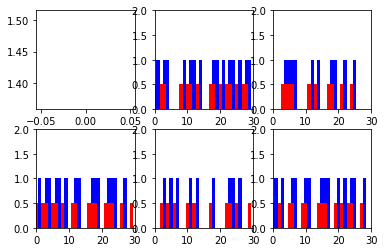

New data, epoch 91
Step 0 Loss nan


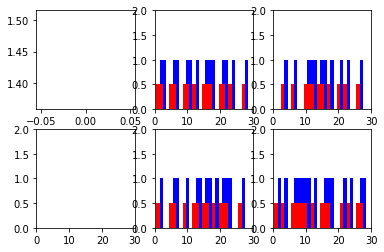

New data, epoch 92
Step 0 Loss nan


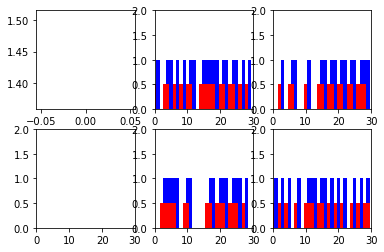

New data, epoch 93
Step 0 Loss nan


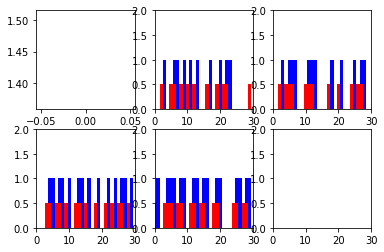

New data, epoch 94
Step 0 Loss nan


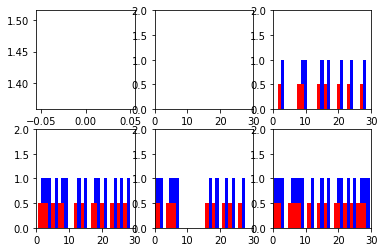

New data, epoch 95
Step 0 Loss nan


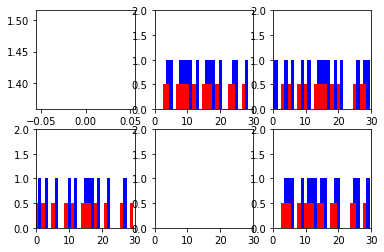

New data, epoch 96
Step 0 Loss nan


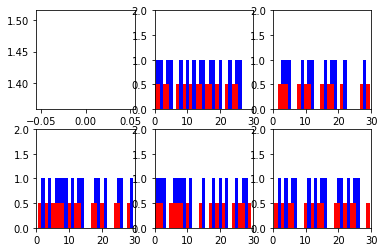

New data, epoch 97
Step 0 Loss nan


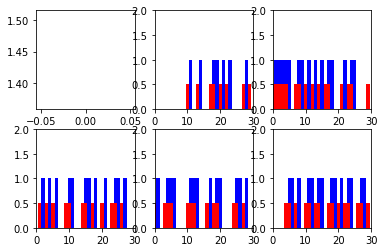

New data, epoch 98
Step 0 Loss nan


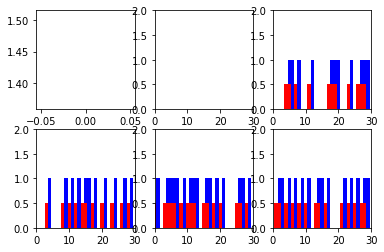

New data, epoch 99
Step 0 Loss nan


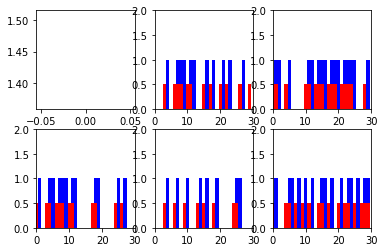

In [45]:
num_epochs = 100
total_series_length = trn.shape[1]
truncated_backprop_length = 30
state_size = 15
num_classes = 2
echo_step = 3
batch_size = 10
num_batches = total_series_length//truncated_backprop_length

def generateData(data, batch_size):
    x = data.iloc[np.random.choice(data.shape[0], size=(batch_size,)), :]
    x[x > 0] = 1
    x[x <= 0] = 0
    y = x.T.shift(-1).T
    return (x, y)

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.int32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
current_state = init_state
states_series = []
for current_input in inputs_series:
    current_input = tf.reshape(current_input, [batch_size, 1])
    input_and_state_concatenated = tf.concat([current_input, current_state], 1)  # Increasing number of columns

    next_state = tf.tanh(tf.matmul(input_and_state_concatenated, W) + b)  # Broadcasted addition
    states_series.append(next_state)
    current_state = next_state

logits_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.sparse_softmax_cross_entropy_with_logits(logits=logits, labels=labels) for logits, labels in zip(logits_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdagradOptimizer(0.3).minimize(total_loss)

def plot(loss_list, predictions_series, batchX, batchY):
    plt.subplot(2, 3, 1)
    plt.cla()
    plt.plot(loss_list)

    for batch_series_idx in range(5):
        one_hot_output_series = np.array(predictions_series)[:, batch_series_idx, :]
        single_output_series = np.array([(1 if out[0] < 0.5 else 0) for out in one_hot_output_series])

        plt.subplot(2, 3, batch_series_idx + 2)
        plt.cla()
        plt.axis([0, truncated_backprop_length, 0, 2])
        left_offset = range(truncated_backprop_length)
        plt.bar(left_offset, batchX[batch_series_idx, :], width=1, color="blue")
        plt.bar(left_offset, batchY[batch_series_idx, :] * 0.5, width=1, color="red")
        plt.bar(left_offset, single_output_series * 0.3, width=1, color="green")

    plt.draw()
    plt.pause(0.0001)


with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx)

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if batch_idx%100 == 0:
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)

plt.ioff()
plt.show()


In [39]:
num_epochs = 10
total_series_length = trn.shape[1]
truncated_backprop_length = 15
state_size = 4
num_classes = 2
echo_step = 3
batch_size = 2000
num_batches = total_series_length//truncated_backprop_length

def generateData(data, batch_size):
    x = data.iloc[np.random.choice(df.shape[0], size=(batch_size,)), :]
    x[x > 0] = 1
    x[x <= 0] = 0
    y = x.T.shift(-1).T
    return (x, y)

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
current_state = init_state
states_series = []
for current_input in inputs_series:
    current_input = tf.reshape(current_input, [batch_size, 1])
    input_and_state_concatenated = tf.concat([current_input, current_state], 1)  # Increasing number of columns

    next_state = tf.matmul(input_and_state_concatenated, W) + b  # Broadcasted addition
    states_series.append(next_state)
    current_state = next_state

predictions_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
## predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.l2_loss(x - x_hat) for x_hat, x in zip(predictions_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdamOptimizer(0.001).minimize(total_loss)

def plot(loss_list, predictions_series, batchX, batchY):
    plt.subplot(2, 3, 1)
    plt.cla()
    plt.plot(loss_list)

    for batch_series_idx in range(5):
        one_hot_output_series = np.array(predictions_series)[:, batch_series_idx, :]
        single_output_series = np.array([(1 if out[0] < 0.5 else 0) for out in one_hot_output_series])

        plt.subplot(2, 3, batch_series_idx + 2)
        plt.cla()
        plt.axis([0, truncated_backprop_length, 0, 2])
        left_offset = range(truncated_backprop_length)
        plt.bar(left_offset, batchX[batch_series_idx, :], width=1, color="blue")
        plt.bar(left_offset, batchY[batch_series_idx, :] * 0.5, width=1, color="red")
        plt.bar(left_offset, single_output_series * 0.3, width=1, color="green")

    plt.draw()
    plt.pause(0.0001)


with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx)

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if batch_idx%100 == 0:
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)

plt.ioff()
plt.show()

ValueError: Dimensions must be equal, but are 2000 and 2 for 'sub_790' (op: 'Sub') with input shapes: [2000], [2000,2].

New data, epoch 0
Step 0 Loss 1.26074e+12


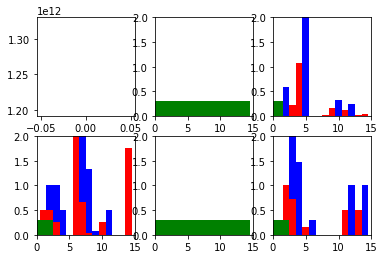

New data, epoch 1
Step 0 Loss nan


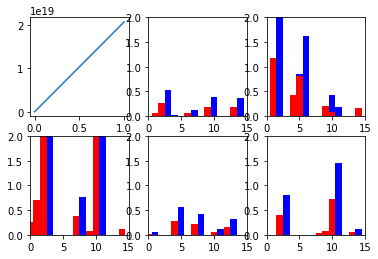

New data, epoch 2
Step 0 Loss nan


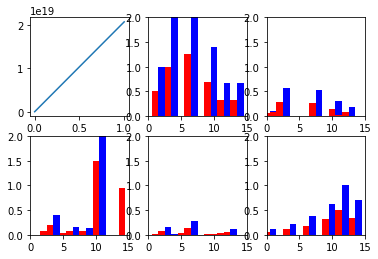

New data, epoch 3
Step 0 Loss nan


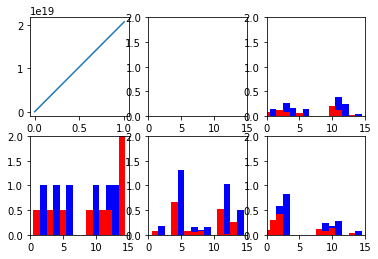

New data, epoch 4
Step 0 Loss nan


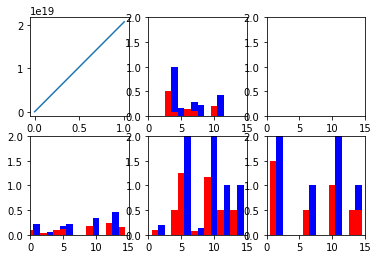

New data, epoch 5
Step 0 Loss nan


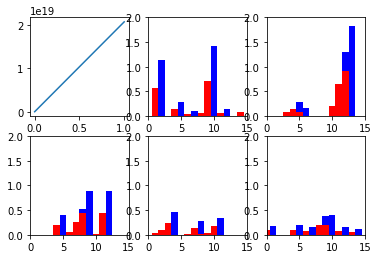

New data, epoch 6
Step 0 Loss nan


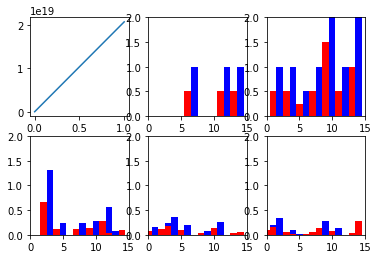

New data, epoch 7
Step 0 Loss nan


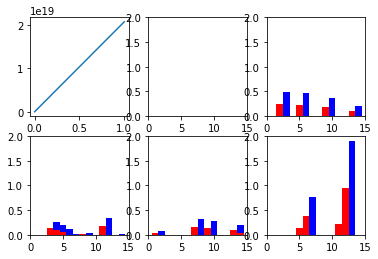

New data, epoch 8
Step 0 Loss nan


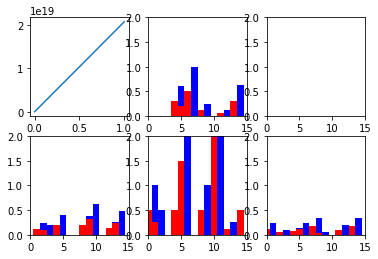

New data, epoch 9
Step 0 Loss nan


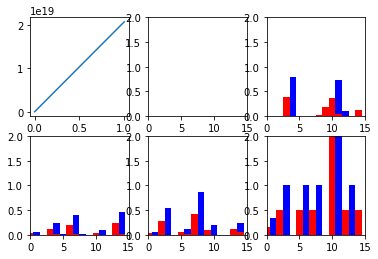

In [38]:
num_epochs = 10
total_series_length = trn.shape[1]
truncated_backprop_length = 15
state_size = 4
num_classes = 1
echo_step = 3
batch_size = 2000
num_batches = total_series_length//truncated_backprop_length

def generateData(data, batch_size):
    x = data.iloc[np.random.choice(df.shape[0], size=(batch_size,)), :].copy()
    y = x.T.shift(-1).T
    return (x, y)

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])

init_state = tf.placeholder(tf.float32, [batch_size, state_size])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.unstack(batchX_placeholder, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
current_state = init_state
states_series = []
for current_input in inputs_series:
    current_input = tf.reshape(current_input, [batch_size, 1])
    input_and_state_concatenated = tf.concat([current_input, current_state], 1)  # Increasing number of columns

    next_state = tf.matmul(input_and_state_concatenated, W) + b  # Broadcasted addition
    states_series.append(next_state)
    current_state = next_state

predictions_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
## predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.nn.l2_loss(x - x_hat) for x_hat, x in zip(predictions_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdamOptimizer(0.001).minimize(total_loss)

def plot(loss_list, predictions_series, batchX, batchY):
    plt.subplot(2, 3, 1)
    plt.cla()
    plt.plot(loss_list)

    for batch_series_idx in range(5):
        one_hot_output_series = np.array(predictions_series)[:, batch_series_idx, :]
        single_output_series = np.array([(1 if out[0] < 0.5 else 0) for out in one_hot_output_series])

        plt.subplot(2, 3, batch_series_idx + 2)
        plt.cla()
        plt.axis([0, truncated_backprop_length, 0, 2])
        left_offset = range(truncated_backprop_length)
        plt.bar(left_offset, batchX[batch_series_idx, :], width=1, color="blue")
        plt.bar(left_offset, batchY[batch_series_idx, :] * 0.5, width=1, color="red")
        plt.bar(left_offset, single_output_series * 0.3, width=1, color="green")

    plt.draw()
    plt.pause(0.0001)


with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx)

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if batch_idx%100 == 0:
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)

plt.ioff()
plt.show()

# Using TF NN built-ins

## 175 day history:

In [35]:
num_epochs = 10
total_series_length = trn.shape[1]
truncated_backprop_length = 175
state_size = 10
num_classes = 1
echo_step = 3
batch_size = 20
num_batches = total_series_length//truncated_backprop_length

def generateData(data, batch_size):
    x = data.iloc[np.random.choice(df.shape[0], size=(batch_size,)), :]
    y = x.T.shift(-1).T
    return (x, y)

batchX_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])
batchY_placeholder = tf.placeholder(tf.float32, [batch_size, truncated_backprop_length])

W = tf.Variable(np.random.rand(state_size+1, state_size), dtype=tf.float32)
b = tf.Variable(np.zeros((1,state_size)), dtype=tf.float32)

W2 = tf.Variable(np.random.rand(state_size, num_classes),dtype=tf.float32)
b2 = tf.Variable(np.zeros((1,num_classes)), dtype=tf.float32)

# Unpack columns
inputs_series = tf.split(batchX_placeholder, truncated_backprop_length, axis=1)
labels_series = tf.unstack(batchY_placeholder, axis=1)

# Forward pass
# init_state = tf.placeholder(tf.float32, [batch_size, state_size])
rnn_cell   = tf.nn.rnn_cell.BasicRNNCell((state_size,))
init_state = rnn_cell.zero_state(batch_size, dtype=tf.float32)

states_series, current_state = tf.nn.dynamic_rnn(rnn_cell,
                                                 [[inputs_series]],
                                                 initial_state=init_state)

predictions_series = [tf.matmul(state, W2) + b2 for state in states_series] #Broadcasted addition
## predictions_series = [tf.nn.softmax(logits) for logits in logits_series]

losses = [tf.losses.mean_squared_error(x, x_hat) for x_hat, x in zip(predictions_series,labels_series)]
total_loss = tf.reduce_mean(losses)

train_step = tf.train.AdagradOptimizer(0.3).minimize(total_loss)

def plot(loss_list, predictions_series, batchX, batchY):
    plt.subplot(2, 3, 1)
    plt.cla()
    plt.plot(loss_list)

    for batch_series_idx in range(5):
        one_hot_output_series = np.array(predictions_series)[:, batch_series_idx, :]
        single_output_series = np.array([(1 if out[0] < 0.5 else 0) for out in one_hot_output_series])

        plt.subplot(2, 3, batch_series_idx + 2)
        plt.cla()
        plt.axis([0, truncated_backprop_length, 0, 2])
        left_offset = range(truncated_backprop_length)
        plt.bar(left_offset, batchX[batch_series_idx, :], width=1, color="blue")
        plt.bar(left_offset, batchY[batch_series_idx, :] * 0.5, width=1, color="red")
        plt.bar(left_offset, single_output_series * 0.3, width=1, color="green")

    plt.draw()
    plt.pause(0.0001)


with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    plt.ion()
    plt.figure()
    plt.show()
    loss_list = []

    for epoch_idx in range(num_epochs):
        x,y = generateData(trn, batch_size)
        _current_state = np.zeros((batch_size, state_size))

        print("New data, epoch", epoch_idx)

        for batch_idx in range(num_batches):
            start_idx = batch_idx * truncated_backprop_length
            end_idx = start_idx + truncated_backprop_length

            batchX = x.iloc[:,start_idx:end_idx].values
            batchY = y.iloc[:,start_idx:end_idx].values

            _total_loss, _train_step, _current_state, _predictions_series = sess.run(
                [total_loss, train_step, current_state, predictions_series],
                feed_dict={
                    batchX_placeholder:batchX,
                    batchY_placeholder:batchY,
                    init_state:_current_state
                })

            loss_list.append(_total_loss)

            if batch_idx%100 == 0:
                print("Step",batch_idx, "Loss", _total_loss)
                plot(loss_list, _predictions_series, batchX, batchY)

plt.ioff()
plt.show()

ValueError: Shape (1, 20) must have rank at least 3

In [4]:
%pwd

'/home/amniskin/Documents/courses/ts/proj/web_traffic_wikipedia/src'

In [4]:
df.columns

Index(['Page', '2015-07-01', '2015-07-02', '2015-07-03', '2015-07-04',
       '2015-07-05', '2015-07-06', '2015-07-07', '2015-07-08', '2015-07-09',
       ...
       '2017-09-01', '2017-09-02', '2017-09-03', '2017-09-04', '2017-09-05',
       '2017-09-06', '2017-09-07', '2017-09-08', '2017-09-09', '2017-09-10'],
      dtype='object', length=804)

In [5]:
df.describe()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2017-09-01,2017-09-02,2017-09-03,2017-09-04,2017-09-05,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10
count,1.243230e+05,1.242470e+05,1.245190e+05,1.244090e+05,1.244040e+05,1.245800e+05,1.243990e+05,1.247690e+05,1.248190e+05,1.247210e+05,...,1.415430e+05,1.413870e+05,1.413460e+05,1.418680e+05,1.424060e+05,1.432880e+05,1.415960e+05,1.440020e+05,1.417310e+05,1.394850e+05
mean,1.195857e+03,1.204004e+03,1.133676e+03,1.170437e+03,1.217769e+03,1.290273e+03,1.239137e+03,1.193092e+03,1.197992e+03,1.189651e+03,...,1.036314e+03,1.024713e+03,1.174865e+03,1.175681e+03,1.138931e+03,1.202851e+03,1.276387e+03,9.496720e+02,9.338783e+02,1.017055e+03
std,7.275352e+04,7.421515e+04,6.961022e+04,7.257351e+04,7.379612e+04,8.054448e+04,7.576288e+04,6.820002e+04,7.149717e+04,7.214536e+04,...,4.999129e+04,5.713222e+04,6.743460e+04,6.915052e+04,6.646815e+04,6.386384e+04,6.726099e+04,5.048330e+04,4.536524e+04,5.704368e+04
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.300000e+01,1.300000e+01,1.200000e+01,1.300000e+01,1.400000e+01,1.100000e+01,1.300000e+01,1.300000e+01,1.400000e+01,1.400000e+01,...,2.100000e+01,1.900000e+01,1.900000e+01,1.800000e+01,1.800000e+01,1.800000e+01,2.300000e+01,1.800000e+01,1.800000e+01,1.800000e+01
50%,1.090000e+02,1.080000e+02,1.050000e+02,1.050000e+02,1.130000e+02,1.130000e+02,1.150000e+02,1.170000e+02,1.150000e+02,1.130000e+02,...,1.250000e+02,1.260000e+02,1.320000e+02,1.230000e+02,1.210000e+02,1.190000e+02,1.365000e+02,1.150000e+02,1.200000e+02,1.250000e+02
75%,5.240000e+02,5.190000e+02,5.040000e+02,4.870000e+02,5.400000e+02,5.550000e+02,5.510000e+02,5.540000e+02,5.490000e+02,5.450000e+02,...,5.090000e+02,5.140000e+02,5.610000e+02,5.360000e+02,5.300000e+02,5.320000e+02,5.760000e+02,5.040000e+02,5.160000e+02,5.480000e+02
max,2.038124e+07,2.075219e+07,1.957397e+07,2.043964e+07,2.077211e+07,2.254467e+07,2.121089e+07,1.910791e+07,1.999385e+07,2.020182e+07,...,1.372256e+07,1.578888e+07,1.856151e+07,1.906250e+07,1.839517e+07,1.749919e+07,1.827305e+07,1.411666e+07,1.269626e+07,1.573111e+07


In [6]:
df.head()['Page'].str.replace("^(.*)_([^_.]{2,})\.(wikipedia|wikimedia|mediawiki)\.org_([^_]*)_([^_]*)", r"\1___\2___\3___\4___\5").str.split("___", expand=True)

,0,1,2,3,4
0,2NE1,zh,wikipedia,all-access,spider
1,2PM,zh,wikipedia,all-access,spider
2,3C,zh,wikipedia,all-access,spider
3,4minute,zh,wikipedia,all-access,spider
4,52_Hz_I_Love_You,zh,wikipedia,all-access,spider


In [7]:
cols = ["title", "language", "host", "platform", "isRobot"]
df[cols] = df['Page'].str.replace("^(.*)_([^_.]{2,})\.(wikipedia|wikimedia|mediawiki)\.org_([^_]*)_([^_]*)", r"\1___\2___\3___\4___\5").str.split("___", expand=True)
df.head()

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10,title,language,host,platform,isRobot
0,2NE1_zh.wikipedia.org_all-access_spider,18.0,11.0,5.0,13.0,14.0,9.0,9.0,22.0,26.0,...,27.0,29.0,23.0,54.0,38.0,2NE1,zh,wikipedia,all-access,spider
1,2PM_zh.wikipedia.org_all-access_spider,11.0,14.0,15.0,18.0,11.0,13.0,22.0,11.0,10.0,...,25.0,26.0,23.0,13.0,81.0,2PM,zh,wikipedia,all-access,spider
2,3C_zh.wikipedia.org_all-access_spider,1.0,0.0,1.0,1.0,0.0,4.0,0.0,3.0,4.0,...,7.0,3.0,4.0,7.0,6.0,3C,zh,wikipedia,all-access,spider
3,4minute_zh.wikipedia.org_all-access_spider,35.0,13.0,10.0,94.0,4.0,26.0,14.0,9.0,11.0,...,16.0,19.0,30.0,38.0,4.0,4minute,zh,wikipedia,all-access,spider
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,23.0,28.0,14.0,8.0,7.0,52_Hz_I_Love_You,zh,wikipedia,all-access,spider


In [8]:
df.shape

(145063, 809)

In [9]:
df.describe()

,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,2015-07-10,...,2017-09-01,2017-09-02,2017-09-03,2017-09-04,2017-09-05,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10
count,1.243230e+05,1.242470e+05,1.245190e+05,1.244090e+05,1.244040e+05,1.245800e+05,1.243990e+05,1.247690e+05,1.248190e+05,1.247210e+05,...,1.415430e+05,1.413870e+05,1.413460e+05,1.418680e+05,1.424060e+05,1.432880e+05,1.415960e+05,1.440020e+05,1.417310e+05,1.394850e+05
mean,1.195857e+03,1.204004e+03,1.133676e+03,1.170437e+03,1.217769e+03,1.290273e+03,1.239137e+03,1.193092e+03,1.197992e+03,1.189651e+03,...,1.036314e+03,1.024713e+03,1.174865e+03,1.175681e+03,1.138931e+03,1.202851e+03,1.276387e+03,9.496720e+02,9.338783e+02,1.017055e+03
std,7.275352e+04,7.421515e+04,6.961022e+04,7.257351e+04,7.379612e+04,8.054448e+04,7.576288e+04,6.820002e+04,7.149717e+04,7.214536e+04,...,4.999129e+04,5.713222e+04,6.743460e+04,6.915052e+04,6.646815e+04,6.386384e+04,6.726099e+04,5.048330e+04,4.536524e+04,5.704368e+04
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.300000e+01,1.300000e+01,1.200000e+01,1.300000e+01,1.400000e+01,1.100000e+01,1.300000e+01,1.300000e+01,1.400000e+01,1.400000e+01,...,2.100000e+01,1.900000e+01,1.900000e+01,1.800000e+01,1.800000e+01,1.800000e+01,2.300000e+01,1.800000e+01,1.800000e+01,1.800000e+01
50%,1.090000e+02,1.080000e+02,1.050000e+02,1.050000e+02,1.130000e+02,1.130000e+02,1.150000e+02,1.170000e+02,1.150000e+02,1.130000e+02,...,1.250000e+02,1.260000e+02,1.320000e+02,1.230000e+02,1.210000e+02,1.190000e+02,1.365000e+02,1.150000e+02,1.200000e+02,1.250000e+02
75%,5.240000e+02,5.190000e+02,5.040000e+02,4.870000e+02,5.400000e+02,5.550000e+02,5.510000e+02,5.540000e+02,5.490000e+02,5.450000e+02,...,5.090000e+02,5.140000e+02,5.610000e+02,5.360000e+02,5.300000e+02,5.320000e+02,5.760000e+02,5.040000e+02,5.160000e+02,5.480000e+02
max,2.038124e+07,2.075219e+07,1.957397e+07,2.043964e+07,2.077211e+07,2.254467e+07,2.121089e+07,1.910791e+07,1.999385e+07,2.020182e+07,...,1.372256e+07,1.578888e+07,1.856151e+07,1.906250e+07,1.839517e+07,1.749919e+07,1.827305e+07,1.411666e+07,1.269626e+07,1.573111e+07


In [10]:
df['host'].unique()

array(['wikipedia', 'wikimedia', 'mediawiki'], dtype=object)

In [11]:
df['platform'].unique()

array(['all-access', 'desktop', 'mobile-web'], dtype=object)

In [12]:
df['language'].unique()

array(['zh', 'fr', 'en', 'commons', 'ru', 'www', 'de', 'ja', '_de', 'es'], dtype=object)

In [13]:
df[df['language'].isin(['commons', 'www'])]

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10,title,language,host,platform,isRobot
13332,Accueil_commons.wikimedia.org_all-access_spider,55.0,48.0,44.0,35.0,46.0,41.0,32.0,43.0,40.0,...,3232.0,5853.0,46.0,48.0,52.0,Accueil,commons,wikimedia,all-access,spider
13333,Atlas_of_Asia_commons.wikimedia.org_all-access...,5.0,3.0,4.0,6.0,3.0,1.0,5.0,6.0,6.0,...,20.0,23.0,21.0,23.0,21.0,Atlas_of_Asia,commons,wikimedia,all-access,spider
13334,Atlas_of_Europe_commons.wikimedia.org_all-acce...,4.0,6.0,9.0,7.0,6.0,4.0,5.0,6.0,13.0,...,40.0,39.0,21.0,33.0,35.0,Atlas_of_Europe,commons,wikimedia,all-access,spider
13335,Atlas_of_World_War_II_commons.wikimedia.org_al...,5.0,2.0,6.0,6.0,8.0,11.0,5.0,5.0,6.0,...,7.0,13.0,5.0,9.0,13.0,Atlas_of_World_War_II,commons,wikimedia,all-access,spider
13336,Atlas_of_colonialism_commons.wikimedia.org_all...,8.0,6.0,15.0,5.0,5.0,9.0,10.0,3.0,9.0,...,23.0,20.0,28.0,27.0,30.0,Atlas_of_colonialism,commons,wikimedia,all-access,spider
13337,Atlas_of_the_United_Kingdom_commons.wikimedia....,5.0,7.0,6.0,10.0,7.0,8.0,6.0,3.0,8.0,...,10.0,15.0,4.0,5.0,8.0,Atlas_of_the_United_Kingdom,commons,wikimedia,all-access,spider
13338,Atlas_of_the_United_States_commons.wikimedia.o...,10.0,14.0,13.0,20.0,9.0,18.0,10.0,9.0,19.0,...,18.0,27.0,10.0,14.0,13.0,Atlas_of_the_United_States,commons,wikimedia,all-access,spider
13339,Bikini_commons.wikimedia.org_all-access_spider,4.0,5.0,2.0,2.0,2.0,1.0,5.0,5.0,5.0,...,9.0,4.0,5.0,3.0,11.0,Bikini,commons,wikimedia,all-access,spider
13340,Campaign:OFBA2016_commons.wikimedia.org_all-ac...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.0,NaN,NaN,NaN,NaN,Campaign:OFBA2016,commons,wikimedia,all-access,spider
13341,Catalogue_of_Wilhelm_von_Gloeden's_pictures_co...,3.0,4.0,5.0,2.0,3.0,5.0,1.0,1.0,0.0,...,11.0,8.0,9.0,6.0,14.0,Catalogue_of_Wilhelm_von_Gloeden's_pictures,commons,wikimedia,all-access,spider


In [14]:
df[df['language'].isin(['commons', 'www'])]['host'].unique()

array(['wikimedia', 'mediawiki'], dtype=object)

In [15]:
df[~df['language'].isin(['commons', 'www'])]['host'].unique()

array(['wikipedia'], dtype=object)

In [16]:
df[~df['language'].isin(['commons'])]['host'].unique()

array(['wikipedia', 'mediawiki'], dtype=object)

In [17]:
df[~df['language'].isin(['www'])]['host'].unique()

array(['wikipedia', 'wikimedia'], dtype=object)

In [18]:
df.loc[df['title'].str.lower().str.contains('footlights_and_fools')]

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10,title,language,host,platform,isRobot
110871,Footlights_and_Fools_en.wikipedia.org_all-acce...,10.0,10.0,15.0,8.0,8.0,3.0,6.0,12.0,12.0,...,8.0,12.0,16.0,5.0,8.0,Footlights_and_Fools,en,wikipedia,all-access,all-agents


In [19]:
df.loc[df['host'] == 'wikimedia', ['Page']].values

array([['Accueil_commons.wikimedia.org_all-access_spider'],
       ['Atlas_of_Asia_commons.wikimedia.org_all-access_spider'],
       ['Atlas_of_Europe_commons.wikimedia.org_all-access_spider'],
       ..., 
       [ 'File:Battle_of_Mosul_(2016–2017).svg_commons.wikimedia.org_desktop_all-agents'],
       ['File:Ура!.ogv_commons.wikimedia.org_desktop_all-agents'],
       ['File:関東地方居住者の自治体別四年制大学卒業率.png_commons.wikimedia.org_desktop_all-agents']], dtype=object)

In [20]:
df.loc[df['title'].str.lower().str.contains('kalman')]

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10,title,language,host,platform,isRobot


In [21]:
df.loc[df['title'].str.lower().str.contains('simpsons')]

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10,title,language,host,platform,isRobot
9683,List_of_The_Simpsons_episodes_en.wikipedia.org...,2881.0,2500.0,2524.0,2294.0,2617.0,2893.0,3277.0,3478.0,2812.0,...,1890.0,1668.0,1662.0,1771.0,2226.0,List_of_The_Simpsons_episodes,en,wikipedia,desktop,all-agents
10590,The_Simpsons_en.wikipedia.org_desktop_all-agents,4068.0,4157.0,3732.0,3266.0,3873.0,4499.0,6273.0,6681.0,4569.0,...,4316.0,4871.0,3775.0,3120.0,3474.0,The_Simpsons,en,wikipedia,desktop,all-agents
34453,The_Simpsons_en.wikipedia.org_all-access_spider,99.0,115.0,83.0,90.0,113.0,68.0,89.0,116.0,112.0,...,999.0,1721.0,486.0,347.0,348.0,The_Simpsons,en,wikipedia,all-access,spider
39378,The_Simpsons_en.wikipedia.org_all-access_all-a...,8115.0,7723.0,7576.0,7365.0,8648.0,9054.0,11618.0,12427.0,8749.0,...,7672.0,7789.0,7008.0,6591.0,7519.0,The_Simpsons,en,wikipedia,all-access,all-agents
46884,Die_Simpsons_de.wikipedia.org_all-access_spider,14.0,35.0,18.0,14.0,11.0,13.0,11.0,8.0,11.0,...,30.0,46.0,19.0,18.0,14.0,Die_Simpsons,de,wikipedia,all-access,spider
65448,Die_Simpsons_de.wikipedia.org_desktop_all-agents,725.0,687.0,489.0,486.0,468.0,587.0,740.0,1123.0,692.0,...,416.0,483.0,327.0,320.0,336.0,Die_Simpsons,de,wikipedia,desktop,all-agents
76910,The_Simpsons_en.wikipedia.org_mobile-web_all-a...,3844.0,3368.0,3636.0,3839.0,4496.0,4306.0,5035.0,5451.0,3934.0,...,3145.0,2756.0,3027.0,3276.0,3801.0,The_Simpsons,en,wikipedia,mobile-web,all-agents
114475,Die_Simpsons_de.wikipedia.org_mobile-web_all-a...,424.0,343.0,361.0,553.0,456.0,421.0,657.0,651.0,445.0,...,590.0,475.0,449.0,698.0,569.0,Die_Simpsons,de,wikipedia,mobile-web,all-agents
137449,Die_Simpsons_de.wikipedia.org_all-access_all-a...,1189.0,1062.0,887.0,1093.0,975.0,1041.0,1476.0,1849.0,1203.0,...,1070.0,1021.0,820.0,1099.0,986.0,Die_Simpsons,de,wikipedia,all-access,all-agents


In [26]:
df.loc[(df['title'].str.lower().str.contains('simpsons')) & (df['language'] == 'en')]

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10,title,language,host,platform,isRobot
9683,List_of_The_Simpsons_episodes_en.wikipedia.org...,2881.0,2500.0,2524.0,2294.0,2617.0,2893.0,3277.0,3478.0,2812.0,...,1890.0,1668.0,1662.0,1771.0,2226.0,List_of_The_Simpsons_episodes,en,wikipedia,desktop,all-agents
10590,The_Simpsons_en.wikipedia.org_desktop_all-agents,4068.0,4157.0,3732.0,3266.0,3873.0,4499.0,6273.0,6681.0,4569.0,...,4316.0,4871.0,3775.0,3120.0,3474.0,The_Simpsons,en,wikipedia,desktop,all-agents
34453,The_Simpsons_en.wikipedia.org_all-access_spider,99.0,115.0,83.0,90.0,113.0,68.0,89.0,116.0,112.0,...,999.0,1721.0,486.0,347.0,348.0,The_Simpsons,en,wikipedia,all-access,spider
39378,The_Simpsons_en.wikipedia.org_all-access_all-a...,8115.0,7723.0,7576.0,7365.0,8648.0,9054.0,11618.0,12427.0,8749.0,...,7672.0,7789.0,7008.0,6591.0,7519.0,The_Simpsons,en,wikipedia,all-access,all-agents
76910,The_Simpsons_en.wikipedia.org_mobile-web_all-a...,3844.0,3368.0,3636.0,3839.0,4496.0,4306.0,5035.0,5451.0,3934.0,...,3145.0,2756.0,3027.0,3276.0,3801.0,The_Simpsons,en,wikipedia,mobile-web,all-agents


In [27]:
df.loc[df['title'].str.lower().str.contains('thrones')]

,Page,2015-07-01,2015-07-02,2015-07-03,2015-07-04,2015-07-05,2015-07-06,2015-07-07,2015-07-08,2015-07-09,...,2017-09-06,2017-09-07,2017-09-08,2017-09-09,2017-09-10,title,language,host,platform,isRobot
4939,Game_of_thrones_fr.wikipedia.org_desktop_all-a...,141.0,170.0,142.0,138.0,211.0,178.0,178.0,197.0,150.0,...,529.0,540.0,486.0,461.0,483.0,Game_of_thrones,fr,wikipedia,desktop,all-agents
5671,Personnages_de_Game_of_Thrones_fr.wikipedia.or...,1571.0,1627.0,1595.0,1239.0,1647.0,1740.0,1511.0,1587.0,1434.0,...,1054.0,1036.0,961.0,771.0,1009.0,Personnages_de_Game_of_Thrones,fr,wikipedia,desktop,all-agents
5845,Saison_2_de_Game_of_Thrones_fr.wikipedia.org_d...,492.0,512.0,489.0,436.0,507.0,552.0,491.0,562.0,470.0,...,527.0,510.0,465.0,460.0,506.0,Saison_2_de_Game_of_Thrones,fr,wikipedia,desktop,all-agents
5865,Saison_6_de_Game_of_Thrones_fr.wikipedia.org_d...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,920.0,1084.0,820.0,742.0,779.0,Saison_6_de_Game_of_Thrones,fr,wikipedia,desktop,all-agents
6467,Game_of_Thrones_fr.wikipedia.org_desktop_all-a...,4748.0,4433.0,4263.0,3871.0,4996.0,5029.0,4491.0,4449.0,3908.0,...,5745.0,5499.0,4910.0,4531.0,4869.0,Game_of_Thrones,fr,wikipedia,desktop,all-agents
6928,Saison_1_de_Game_of_Thrones_fr.wikipedia.org_d...,692.0,626.0,554.0,528.0,673.0,626.0,554.0,589.0,478.0,...,811.0,796.0,675.0,625.0,637.0,Saison_1_de_Game_of_Thrones,fr,wikipedia,desktop,all-agents
6938,Saison_3_de_Game_of_Thrones_fr.wikipedia.org_d...,560.0,518.0,506.0,412.0,548.0,606.0,473.0,495.0,516.0,...,590.0,527.0,512.0,428.0,530.0,Saison_3_de_Game_of_Thrones,fr,wikipedia,desktop,all-agents
6941,Saison_4_de_Game_of_Thrones_fr.wikipedia.org_d...,786.0,694.0,683.0,671.0,850.0,866.0,697.0,713.0,630.0,...,640.0,502.0,472.0,438.0,561.0,Saison_4_de_Game_of_Thrones,fr,wikipedia,desktop,all-agents
6945,Saison_5_de_Game_of_Thrones_fr.wikipedia.org_d...,2396.0,2209.0,2374.0,1963.0,2440.0,2475.0,2203.0,2113.0,1923.0,...,690.0,711.0,529.0,511.0,569.0,Saison_5_de_Game_of_Thrones,fr,wikipedia,desktop,all-agents
8006,Liste_des_épisodes_de_Game_of_Thrones_fr.wikip...,278.0,266.0,350.0,266.0,312.0,264.0,239.0,245.0,220.0,...,560.0,494.0,438.0,420.0,474.0,Liste_des_épisodes_de_Game_of_Thrones,fr,wikipedia,desktop,all-agents


In [8]:
melted_df = pd.melt(df, id_vars=['Page'], var_name="Date", value_name="Value")
melted_df.head()

,Page,Date,Value
0,2NE1_zh.wikipedia.org_all-access_spider,2015-07-01,18
1,2PM_zh.wikipedia.org_all-access_spider,2015-07-01,11
2,3C_zh.wikipedia.org_all-access_spider,2015-07-01,1
3,4minute_zh.wikipedia.org_all-access_spider,2015-07-01,35
4,52_Hz_I_Love_You_zh.wikipedia.org_all-access_s...,2015-07-01,NaN


In [10]:
melted_df['Page'].str.contains("_[A-Za-z]{2}.wikipedia").all()

False

In [11]:
melted_df[~melted_df['Page'].str.contains("_[A-Za-z]{2}.wikipedia")].head()

,Page,Date,Value
13332,Accueil_commons.wikimedia.org_all-access_spider,2015-07-01,55
13333,Atlas_of_Asia_commons.wikimedia.org_all-access...,2015-07-01,5
13334,Atlas_of_Europe_commons.wikimedia.org_all-acce...,2015-07-01,4
13335,Atlas_of_World_War_II_commons.wikimedia.org_al...,2015-07-01,5
13336,Atlas_of_colonialism_commons.wikimedia.org_all...,2015-07-01,8


In [12]:
melted_df[~melted_df['Page'].str.contains("_([^_.]{2,})\.(wikipedia|wikimedia|mediawiki)\.org.*")].head()

/usr/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  """Entry point for launching an IPython kernel.


,Page,Date,Value


In [ ]:
melted_df[~melted_df['Page'].str.contains("_([^_.]{2,})\.(wikipedia|wikimedia|mediawiki)\.org.*")].count()

/usr/lib/python3.6/site-packages/ipykernel_launcher.py:1: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  """Entry point for launching an IPython kernel.


Page     0
Date     0
Value    0
dtype: int64

In [ ]:
split_page = melted_df['Page'].str.replace("^(.*)_([^_.]{2,})\.(wikipedia|wikimedia|mediawiki)\.org_([^_]*)_([^_]*)", r"\1___\2___\3___\4___\5").str.split("___", expand=True)
split_page.head()

In [ ]:
melted_df.head()

In [31]:
tmp = melted_df.head(100000)['Page'].str.replace("^(.*)_([^_.]{2,})\.(wikipedia|wikimedia|mediawiki)\.org_([^_]*)_([^_]*)", r"\1___\2___\3___\4___\5").str.split("___", expand=True)

tmp.head()

,0,1,2,3,4
0,2NE1,zh,wikipedia,all-access,spider
1,2PM,zh,wikipedia,all-access,spider
2,3C,zh,wikipedia,all-access,spider
3,4minute,zh,wikipedia,all-access,spider
4,52_Hz_I_Love_You,zh,wikipedia,all-access,spider


In [32]:
tmp[2].unique()

array(['wikipedia', 'wikimedia', 'mediawiki'], dtype=object)

In [9]:
melted2 = melted_df[melted_df['Page'].str.contains("_[A-Za-z]{2}.wikipedia")]

In [10]:
melted2['title'] = melted2['Page'].str.replace("_([A-Za-z]{2}).wikipedia.org.*", r"___\1").str.split("___").apply(lambda x: x[0])

KeyboardInterrupt: 

In [12]:
melted2['Page'].head().str.replace("_([^_.]{2,})\.wiki(pedia|media)\.org.*", r"___\1").str.split("___", expand=True)

,0,1
0,2NE1,zh
1,2PM,zh
2,3C,zh
3,4minute,zh
4,52_Hz_I_Love_You,zh


In [7]:
melted2['language'] = melted2['Page'].str.replace("_([A-Za-z]{2}).wikipedia.org.*", r"___\1").str.split("___").apply(lambda x: x[1])

IndexError: list index out of range

In [ ]:
melted2['Page'].str.replace("_([A-Za-z]{2}).wikipedia.org.*", r"___\1").str.split("___").apply(lambda x: len(x))

In [ ]:
melted2['platform'] = melted2['Page'].str.replace(".*.wikipedia.org_(.*)", r"\1").str.split("_").apply(lambda x: x[0])

In [ ]:
melted2['isRobot'] = melted2['Page'].str.replace(".*.wikipedia.org_(.*)", r"\1").str.split("_").apply(lambda x: int(x[1]=="spider"))

In [113]:
# drop page colum
#del melted_df['Page']

In [ ]:
melted_df.shape

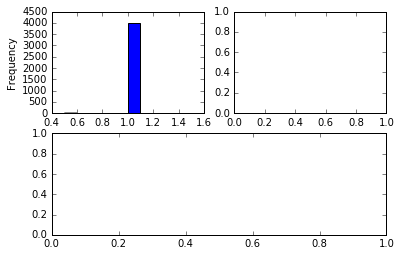

In [144]:
ax = plt.subplot2grid((2, 2), (0, 0))
ax1 = plt.subplot2grid((2, 2), (0, 0), colspan=1)
melted2['isRobot'].plot(kind="hist",ax=ax1)

ax2 = plt.subplot2grid((2, 2), (0, 1), colspan=1)
ax3 = plt.subplot2grid((2, 2), (1, 0), colspan=2)


In [ ]:
ax.plot(kind='hist')